<a href="https://colab.research.google.com/github/yaffka/Tesis/blob/main/ML_Bpy_Bz_MV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Funciones

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as image
from matplotlib.offsetbox import (OffsetImage, AnnotationBbox)
from IPython.display import HTML

from google.colab import drive
drive.mount('/content/drive')

!pip install rdkit-pypi
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import Draw
from rdkit.Chem import Descriptors
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import PandasTools
PandasTools.molSize = (80,80)

Mounted at /content/drive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.4/29.4 MB 19.7 MB/s eta 0:00:00


Failed to find the pandas get_adjustment() function to patch
Failed to patch pandas - PandasTools will have limited functionality


In [ ]:
def draw(df, name):
  smis = df[name]
  mols = [Chem.MolFromSmiles(smi) for smi in smis]
  count=1
  for m in mols:
    if (str(type(m)) == "<class 'rdkit.Chem.rdchem.Mol'>"):
      draw = AllChem.Compute2DCoords(m)
  count += 1

  img = Draw.MolsToGridImage(mols,molsPerRow=5,subImgSize=(350,150),maxMols=110)
  return (img)


def smile_Ox_to_R1(smiles_original):
   # Convertir el SMILES en un objeto de molécula RDKit
   mol = Chem.MolFromSmiles(smiles_original)
   num_electrones_valencia_mol1 = Descriptors.NumValenceElectrons(mol)
   Chem.SanitizeMol(mol, sanitizeOps=Chem.SANITIZE_KEKULIZE)
   # Modificar la carga del nitrógeno y radical del C
   atom_1 = None
   atom_2 = None
   count = 0
   for atom in mol.GetAtoms():
       count=count+1
       if count > 2 :
          #print(atom_2.GetSymbol(), atom_1.GetSymbol(), atom.GetSymbol())
          indice_atom1 = atom_2.GetIdx()
          indice_atom2 = atom_1.GetIdx()
          indice_atom3 = atom.GetIdx()
          #print(indice_atom1, indice_atom2, indice_atom3)

          enlace_1 = mol.GetBondBetweenAtoms(indice_atom1, indice_atom2)
          enlace_2 = mol.GetBondBetweenAtoms(indice_atom2, indice_atom3)

          if enlace_1 is not None and enlace_2 is not None:
            tipo_enlace_1 = enlace_1.GetBondTypeAsDouble()
            tipo_enlace_2 = enlace_2.GetBondTypeAsDouble()
            #print(tipo_enlace_1, tipo_enlace_2)
            if atom_2.GetAtomicNum() == 6 and atom_1.GetAtomicNum() == 7 and atom.GetAtomicNum() == 6 or tipo_enlace_1 == 2.0 or tipo_enlace_2 == 2.0:  # condiciones de los tres atomos
                carga_formal_nitrogen = atom_1.GetFormalCharge()-1
                atom_1.SetFormalCharge(carga_formal_nitrogen)  # Cambia la carga
                atom_2.SetNumRadicalElectrons(1) # Radical
                # Cambiar el tipo de enlace a sencillo (Single)
                enlace_1.SetBondType(Chem.BondType.SINGLE)
                enlace_2.SetBondType(Chem.BondType.SINGLE)
                break
       atom_2 = atom_1
       atom_1 = atom

   # Generar el nuevo SMILES modificado
   smiles_modificado = Chem.MolToSmiles(mol)

   # Crear una nueva molécula RDKit desde el SMILES modificado
   mol_modificado = Chem.MolFromSmiles(smiles_modificado)

   # Calcular el número de electrones de valencia
   num_electrones_valencia_mol2 = Descriptors.NumValenceElectrons(mol_modificado)
   # Imprimir los SMILES
   #print("SMILES original:", smiles_original)
   #print("SMILES modificado:", smiles_modificado)
   dif_electron = abs(num_electrones_valencia_mol1 - num_electrones_valencia_mol2)
   #print("dif de electrones de valencia = :", dif_electron ,'(',num_electrones_valencia_mol2,'-', num_electrones_valencia_mol1 ,')')
   return smiles_modificado

In [ ]:
def intercambiar_enlaces_en_anillo(mol):
    for bond in mol.GetBonds():
        if mol.GetAtomWithIdx(bond.GetBeginAtomIdx()).IsInRing() and mol.GetAtomWithIdx(bond.GetEndAtomIdx()).IsInRing():
            # Verificar que ambos átomos estén en un anillo antes de intercambiar el enlace
            if bond.GetBondType() == Chem.BondType.SINGLE:
                bond.SetBondType(Chem.BondType.DOUBLE)
            elif bond.GetBondType() == Chem.BondType.DOUBLE:
                bond.SetBondType(Chem.BondType.SINGLE)

def smile_Ox_to_R2(smiles_original):
   # Convertir el SMILES en un objeto de molécula RDKit
   mol = Chem.MolFromSmiles(smiles_original)

   intercambiar_enlaces_en_anillo(mol)

   lista_nitrogeno = []
   lista_carbono = []
   for atom in mol.GetAtoms():
    if atom.GetAtomicNum() == 7: #Guarda el atomo de N en la lista
      lista_nitrogeno.append(atom)
    if atom.GetAtomicNum() == 6: #Guarda el atomo de C en la lista
      lista_carbono.append(atom)

   N1, N2 = None, None  # Inicializar variables

   for nitrogeno in lista_nitrogeno:
       conteo_vecinos = 0
       atom_neighbors = [neighbor.GetIdx() for neighbor in nitrogeno.GetNeighbors()]
       num_vecinos = len(atom_neighbors)
       for neighbor_index in atom_neighbors:
           neighbor_atom = mol.GetAtomWithIdx(neighbor_index)
           tipo_vecino = neighbor_atom.GetSymbol()
           #print(f"Símbolo del vecino: {tipo_vecino}")
           if tipo_vecino == 'C':
               conteo_vecinos += 1
       if conteo_vecinos == 2 and num_vecinos == 2:
           if N1 is None:
               N1 = nitrogeno
           else:
               N2 = nitrogeno

   N1.SetFormalCharge(N1.GetFormalCharge() -1)
   N2.SetFormalCharge(N2.GetFormalCharge() -1)

   lista_enlace = []
   for c in lista_carbono:
      enlace_1 = mol.GetBondBetweenAtoms(N1.GetIdx(), c.GetIdx())
      enlace_2 = mol.GetBondBetweenAtoms(N2.GetIdx(), c.GetIdx())
      if enlace_1 is not None:
        lista_enlace.append(c)
        enlace_1.SetBondType(Chem.BondType.SINGLE)
      if enlace_2 is not None:
        lista_enlace.append(c)
        enlace_2.SetBondType(Chem.BondType.SINGLE)


   # Generar el nuevo SMILES modificado
   smiles_modificado = Chem.MolToSmiles(mol)

   # Imprimir los SMILES
   #print("SMILES original:", smiles_original)
   #print("SMILES modificado:", smiles_modificado)
   return smiles_modificado

In [ ]:
#Calcula todos los desciptores de todos lo smiles que se le den
def fun_descriptors(name,df):
  def getMolDescriptors(mol, missingVal=None):
    res = {}
    for nm,fn in Descriptors._descList:
        # some of the descriptor fucntions can throw errors if they fail, catch those here:
        try:
            val = fn(mol)
        except:
            # print the error message:
            import traceback
            traceback.print_exc()
            # and set the descriptor value to whatever missingVal is
            val = missingVal
        res[nm] = val
    return res

  mols = [Chem.MolFromSmiles(m) for m in df[name]]
  len(mols)
  allDescrs = [getMolDescriptors(m) for m in mols]
  df_descriptors = pd.DataFrame(allDescrs)
  df_descriptors.head()
  return df_descriptors

#Calcula la correlación pedida para un DataFrame dado
def rm_descriptor(df,correlacion):
  contador =0
  lista = []
  for columna in range(0,df.shape[1]):
      conteo_valores = df.iloc[:,columna].value_counts()
      if len(conteo_valores) > correlacion:
        print("Columna:",columna,"Valores distintos",len(conteo_valores))
        contador = contador + 1
      else:
        lista.append(df.columns[columna])
  print(contador)
  return lista

#Función para encontrar una lista a partir de un valor de correlación
def corr_rm(matrix, corr):
  lista = []
  for fila in range(0, len(matrix)):
    for columna in range(fila +1 ,len(matrix)):
      correlacion = abs(matrix.iloc[fila, columna])
      find = matrix.columns[columna] in lista
      find_fila = matrix.columns[fila] in lista
      if correlacion > corr:
        if not find:
          lista.append(matrix.columns[columna])
        if find and not find_fila:
          lista.append(matrix.columns[fila])
  print(len(lista))
  return lista

#Base de datos: DatOx y  DatRed

In [ ]:
#Energía de reorganización a la se de van a elegir los descriptores
"""
lamda1 = 0
lambda2 = 1
lambda_Ox = 2
lambda_Red = 3
'numero' (n) es la cantidad de unicos descriptores que se concideran
lista_Ox y lista_Red contiene a los 'n' unicoscriptores con la correlacion más alta respectivamente
familia = Bpy,MV, Bz
"""

familia = 'All'

In [ ]:
df = pd.read_csv('https://docs.google.com/spreadsheets/d/1hhuRKR_BCx1HXhcQSbH960zCB7a4ZBjERpDMXrCfpGg/export?format=csv')

In [ ]:
df_reorganitation = df.iloc[:,:4]
df_reorganitation

,lambda1,lambda2,lambda_Ox,lambda_Red
0,1.095447,0.912869,0.284814,0.259998
1,1.017108,0.983180,0.250747,0.246529
2,1.003110,0.996900,0.228189,0.227481
3,1.014841,0.985376,0.240592,0.237073
4,0.214281,4.666779,0.080925,0.377657
...,...,...,...,...
2214,1.092866,0.915025,0.268025,0.245250
2215,1.149546,0.869909,0.285930,0.248733
2216,0.897557,1.114135,0.219835,0.244926
2217,1.200964,0.832664,0.332215,0.276624


#Criterio 1 y 2 DatOx
1. Selección de descriptores que tengan mas de dos valores distintos en el DataFrame.
2. Selección de descriptores únicos con el análisis de correlaciones.

### Criterio 1:

In [ ]:
df_reorganitation_Ox = pd.read_csv('https://docs.google.com/spreadsheets/d/1hhuRKR_BCx1HXhcQSbH960zCB7a4ZBjERpDMXrCfpGg/export?format=csv')

In [ ]:
df_descriptors_Ox = df_reorganitation_Ox.iloc[:,4:]
df_descriptors_Ox

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,8.978696,0.493977,8.978696,0.493977,0.702010,298.396,288.316,298.033591,96,0,...,2,0,0,0,0,0,2,0,0,0
1,6.078573,-0.806730,6.078573,0.458792,0.705653,350.076,337.980,347.974362,104,0,...,0,0,0,0,0,0,0,0,0,0
2,5.888018,-1.129242,5.888018,0.162616,0.716811,382.074,369.978,379.964191,116,0,...,0,0,0,0,0,0,0,0,0,0
3,13.131387,-0.769941,13.131387,0.228542,0.668918,248.276,234.164,248.111408,92,0,...,0,0,0,0,0,0,0,0,0,0
4,12.558340,-1.085281,12.558340,0.014375,0.727167,280.274,266.162,280.101237,104,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2214,12.372585,-4.364117,12.372585,0.069792,0.847387,322.252,310.156,322.089919,119,1,...,0,0,0,0,0,0,0,0,0,0
2215,5.826066,-0.595430,5.826066,0.595430,0.843229,324.038,313.958,321.959261,95,1,...,0,0,0,0,0,0,0,0,0,0
2216,3.430436,1.029076,3.430436,1.029076,0.821221,214.312,196.168,214.146450,83,1,...,0,0,0,0,0,0,0,0,0,0
2217,13.348189,-5.933530,13.348189,0.407896,0.761772,394.212,386.148,394.052232,143,1,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#Se guarda en la lista los descriptores que tengan mas de 4 valores diferentes, pero esta condición puede cambiar a cualquier numero entero
lista_borrar = rm_descriptor(df_reorganitation_Ox.iloc[:,4:], 4)
print(lista_borrar)
# Limpieza del DataFrame con los descriptores que tiene 4 o menos datos
df_filtro_01_Ox = df_reorganitation_Ox.copy()
df_filtro_01_Ox.drop(columns = lista_borrar, axis=1, inplace=True)
df_filtro_01_Ox

Columna: 0 Valores distintos 1332
Columna: 1 Valores distintos 1384
Columna: 2 Valores distintos 1332
Columna: 3 Valores distintos 1359
Columna: 4 Valores distintos 882
Columna: 5 Valores distintos 390
Columna: 6 Valores distintos 109
Columna: 7 Valores distintos 648
Columna: 8 Valores distintos 84
Columna: 10 Valores distintos 1805
Columna: 11 Valores distintos 1623
Columna: 12 Valores distintos 1698
Columna: 13 Valores distintos 1755
Columna: 14 Valores distintos 121
Columna: 15 Valores distintos 168
Columna: 16 Valores distintos 216
Columna: 17 Valores distintos 1381
Columna: 18 Valores distintos 1502
Columna: 19 Valores distintos 2083
Columna: 20 Valores distintos 2083
Columna: 21 Valores distintos 2083
Columna: 22 Valores distintos 2083
Columna: 23 Valores distintos 2083
Columna: 24 Valores distintos 2078
Columna: 25 Valores distintos 789
Columna: 26 Valores distintos 693
Columna: 27 Valores distintos 40
Columna: 28 Valores distintos 367
Columna: 29 Valores distintos 427
Columna: 

,lambda1,lambda2,lambda_Ox,lambda_Red,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,...,NumHAcceptors,NumHeteroatoms,NumRotatableBonds,MolLogP,MolMR,fr_NH0,fr_alkyl_halide,fr_allylic_oxid,fr_aryl_methyl,fr_halogen
0,1.095447,0.912869,0.284814,0.259998,8.978696,0.493977,8.978696,0.493977,0.702010,298.396,...,4,6,2,0.01916,81.7448,2,0,9,0,0
1,1.017108,0.983180,0.250747,0.246529,6.078573,-0.806730,6.078573,0.458792,0.705653,350.076,...,0,6,2,1.28300,86.3248,0,4,10,0,4
2,1.003110,0.996900,0.228189,0.227481,5.888018,-1.129242,5.888018,0.162616,0.716811,382.074,...,2,8,4,1.14620,88.4948,0,4,7,0,4
3,1.014841,0.985376,0.240592,0.237073,13.131387,-0.769941,13.131387,0.228542,0.668918,248.276,...,0,4,2,-0.38540,67.2868,0,2,10,0,2
4,0.214281,4.666779,0.080925,0.377657,12.558340,-1.085281,12.558340,0.014375,0.727167,280.274,...,2,6,4,-0.52220,69.4568,0,2,7,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2214,1.092866,0.915025,0.268025,0.245250,12.372585,-4.364117,12.372585,0.069792,0.847387,322.252,...,1,8,3,3.48129,66.1324,0,6,3,0,6
2215,1.149546,0.869909,0.285930,0.248733,5.826066,-0.595430,5.826066,0.595430,0.843229,324.038,...,1,6,3,3.70399,75.6424,0,4,3,0,4
2216,0.897557,1.114135,0.219835,0.244926,3.430436,1.029076,3.430436,1.029076,0.821221,214.312,...,1,2,3,2.39649,65.3704,0,0,3,1,0
2217,1.200964,0.832664,0.332215,0.276624,13.348189,-5.933530,13.348189,0.407896,0.761772,394.212,...,1,12,3,4.27579,66.6524,0,10,3,0,10


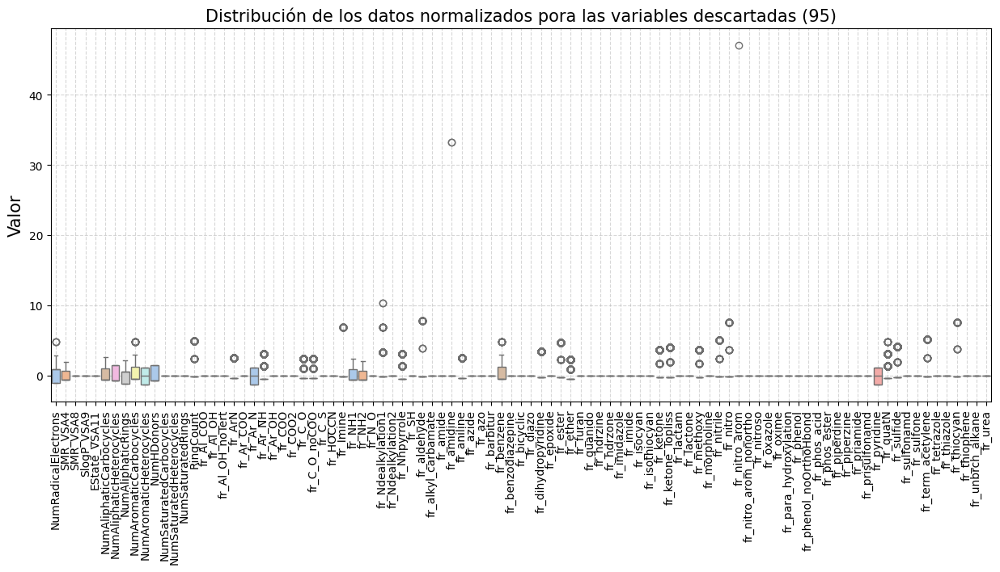

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

plt.figure(figsize=(15, 6))
sns.boxplot(data=pd.DataFrame(scaler.fit_transform(df_reorganitation_Ox[lista_borrar]), columns=lista_borrar), palette='pastel')

tamano = len(lista_borrar)
# Agregar etiquetas
plt.title(f'Distribución de los datos normalizados pora las variables descartadas ({tamano})', fontsize=15)
plt.ylabel('Valor', fontsize=15 )
plt.xticks(rotation=90)
plt.grid(True, linestyle='--', alpha=0.5)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/Critero01_Bigotes_Fuera.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
# Mostrar el gráfico
plt.show()

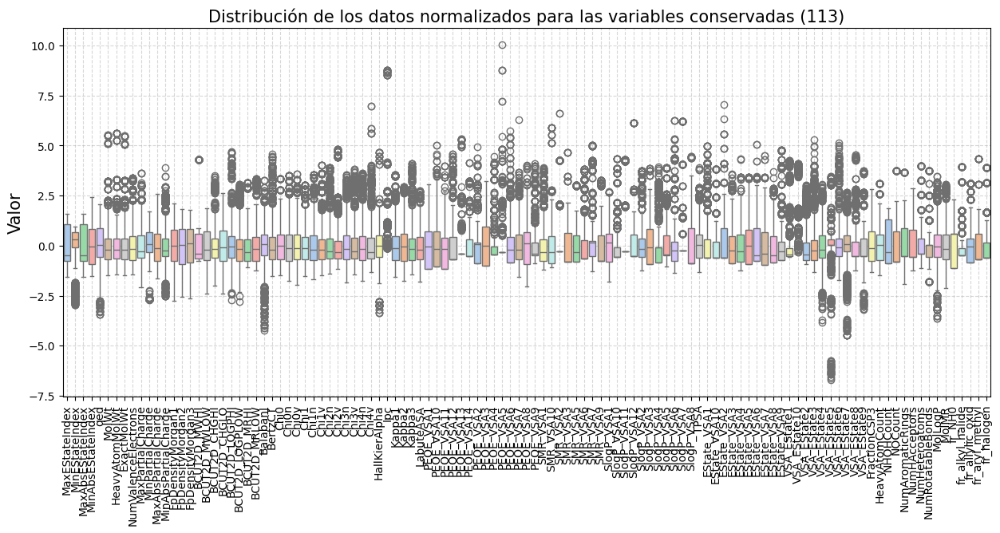

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

plt.figure(figsize=(15, 6))
sns.boxplot(data=pd.DataFrame(scaler.fit_transform(df_filtro_01_Ox.iloc[:,4:]), columns=df_filtro_01_Ox.iloc[:,4:].columns), palette='pastel')

tamano = df_filtro_01_Ox.iloc[:,4:].shape[1]
# Agregar etiquetas
plt.title(f'Distribución de los datos normalizados para las variables conservadas ({tamano})' , fontsize=15)
plt.ylabel('Valor', fontsize=15)
plt.xticks(rotation=90)
plt.grid(True, linestyle='--', alpha=0.5)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/Critero01_Bigotes_Dentro.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
# Mostrar el gráfico
plt.show()

In [ ]:
df_filtro_01_Ox.columns


Index(['lambda1', 'lambda2', 'lambda_Ox', 'lambda_Red', 'MaxEStateIndex',
       'MinEStateIndex', 'MaxAbsEStateIndex', 'MinAbsEStateIndex', 'qed',
       'MolWt',
       ...
       'NumHAcceptors', 'NumHeteroatoms', 'NumRotatableBonds', 'MolLogP',
       'MolMR', 'fr_NH0', 'fr_alkyl_halide', 'fr_allylic_oxid',
       'fr_aryl_methyl', 'fr_halogen'],
      dtype='object', length=117)

### Criterio 2

In [ ]:
# Correlacion de Pearson Kendall y Sperarman
corr_matrix_pearson = abs(df_filtro_01_Ox.iloc[:,4:].select_dtypes(include=['float64', 'int']).corr(method='pearson'))
corr_matrix_kendall = df_filtro_01_Ox.iloc[:,4:].select_dtypes(include=['float64', 'int']).corr(method='kendall')
corr_matrix_spearman = df_filtro_01_Ox.iloc[:,4:].select_dtypes(include=['float64', 'int']).corr(method='spearman')

"""
La lista que se creo es para guardar los descriptores que tengan una correlaciòn mayor a 0.9
Es decir, que gurda uno de los descriptores que tienen una correlacion mayor a 0.9
"""
lista_corr_eliminar_spearman = corr_rm(corr_matrix_spearman, 0.9)
lista_corr_eliminar_kendall = corr_rm(corr_matrix_kendall, 0.9)
lista_corr_eliminar_pearson = corr_rm(corr_matrix_pearson, 0.9)

df_filtro_02_Ox_spearman = df_filtro_01_Ox.copy()
df_filtro_02_Ox_kendall = df_filtro_01_Ox.copy()
df_filtro_02_Ox_pearson = df_filtro_01_Ox.copy()

df_filtro_02_Ox_spearman.drop(columns = lista_corr_eliminar_spearman , axis=1, inplace=True)
df_filtro_02_Ox_kendall.drop(columns =lista_corr_eliminar_kendall , axis=1, inplace=True)
df_filtro_02_Ox_pearson.drop(columns = lista_corr_eliminar_pearson , axis=1, inplace=True)

25
10
26


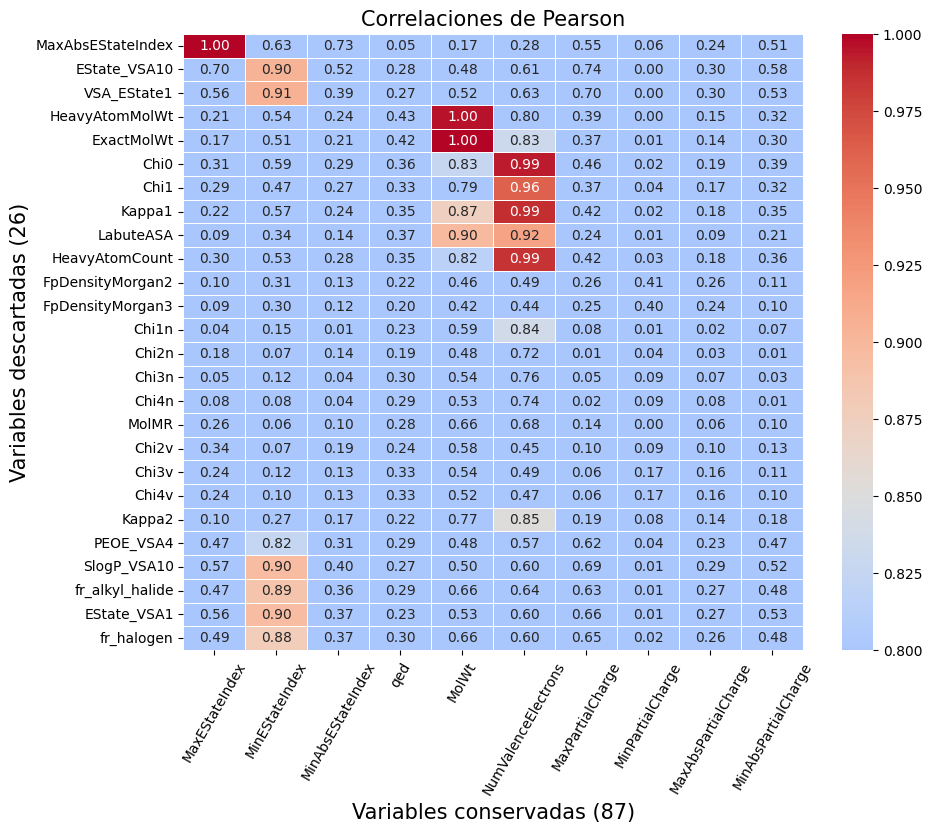

In [ ]:
# Graficar el heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(abs(corr_matrix_pearson.loc[lista_corr_eliminar_pearson, df_filtro_02_Ox_pearson.columns[4:14]]), annot=True, cmap='coolwarm', center=0.85, vmin=0.8, vmax=1, fmt='.2f', linewidths=.5)
plt.title('Correlaciones de Pearson', fontsize=15)
plt.ylabel(f'Variables descartadas ({len(lista_corr_eliminar_pearson)})',  fontsize=15)
plt.xlabel(f'Variables conservadas ({df_filtro_02_Ox_pearson.shape[1]-4})', fontsize=15)
plt.xticks(rotation=60)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/Critero02_Pearson_MatrixCorr.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

In [ ]:
df_filtro_02_Ox_kendall.shape[1]-4

103

In [ ]:
len(df_filtro_02_Ox_kendall.columns[4:])

103

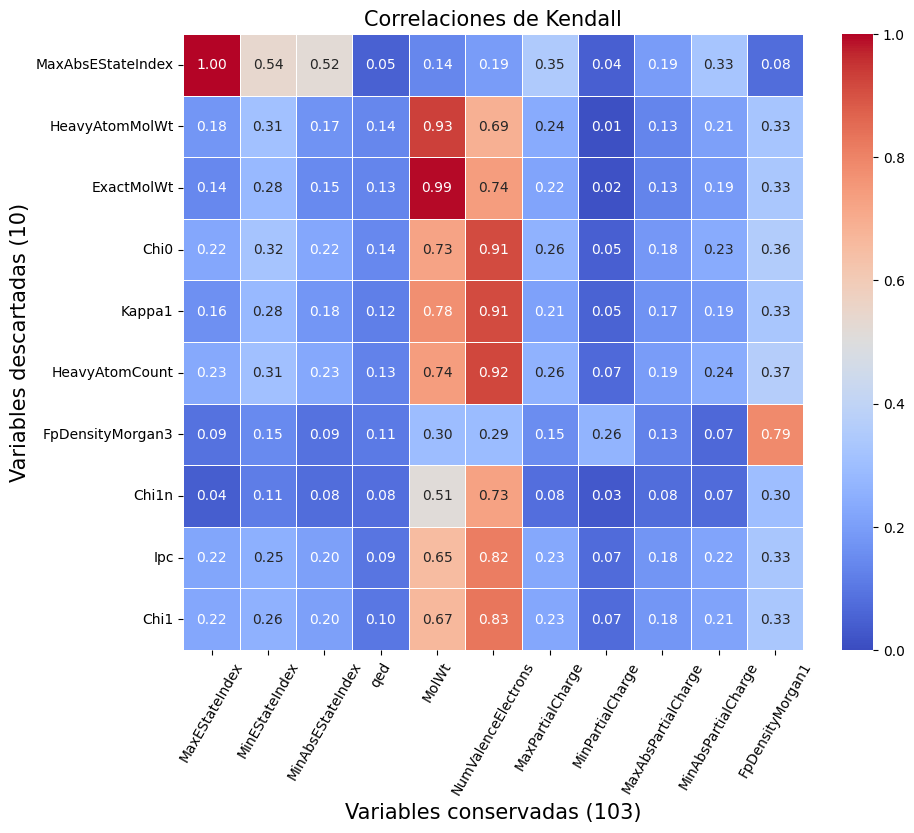

In [ ]:
# Graficar el heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(abs(corr_matrix_kendall.loc[lista_corr_eliminar_kendall, df_filtro_02_Ox_kendall.columns[4:15]]), annot=True, cmap='coolwarm', center=0.5, vmin=0, vmax=1, fmt='.2f', linewidths=.5)
plt.title('Correlaciones de Kendall', fontsize=15)
plt.ylabel(f'Variables descartadas ({len(lista_corr_eliminar_kendall)})',  fontsize=15)
plt.xlabel(f'Variables conservadas ({df_filtro_02_Ox_kendall.shape[1]-4})', fontsize=15)
plt.xticks(rotation=60)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/Critero02_Kendall_MatrixCorr.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')

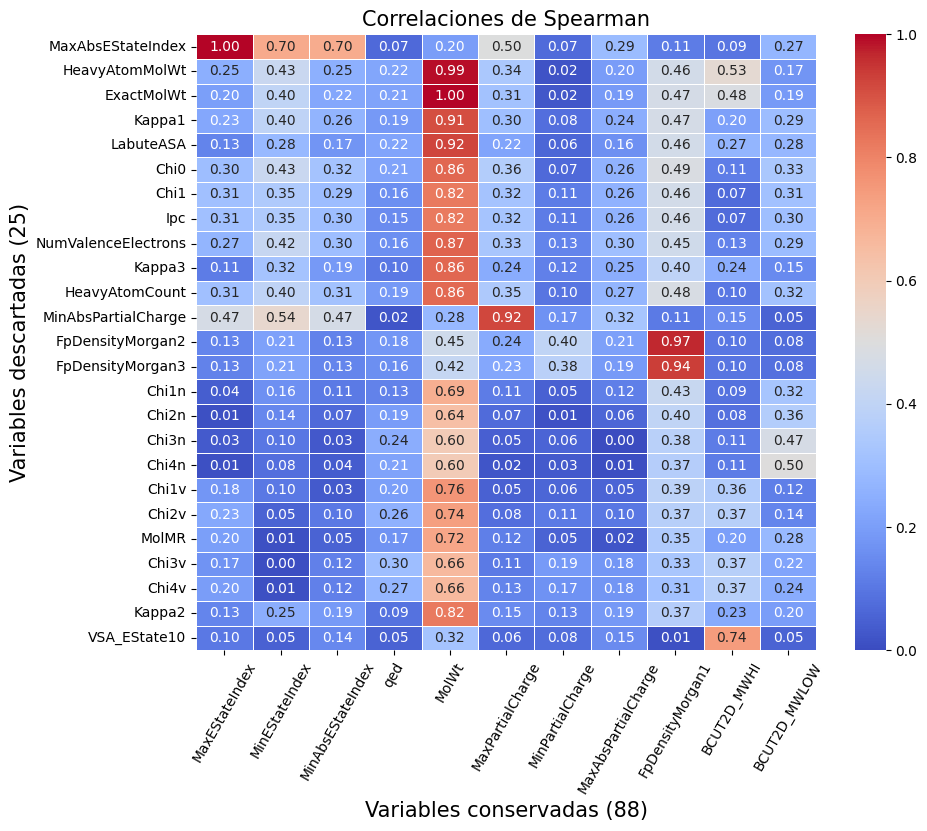

In [ ]:
# Graficar el heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(abs(corr_matrix_spearman.loc[lista_corr_eliminar_spearman, df_filtro_02_Ox_spearman.columns[4:15]]), annot=True, cmap='coolwarm', center=0.5, vmin=0, vmax=1, fmt='.2f', linewidths=.5)
plt.title('Correlaciones de Spearman', fontsize=15)
plt.ylabel(f'Variables descartadas ({len(lista_corr_eliminar_spearman)})',  fontsize=15)
plt.xlabel(f'Variables conservadas ({df_filtro_02_Ox_spearman.shape[1]-4})', fontsize=15)
plt.xticks(rotation=60)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/Critero02_Spearman_MatrixCorr.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

In [ ]:
print(df_filtro_02_Ox_pearson.shape)
print(df_filtro_02_Ox_kendall.shape)
print(df_filtro_02_Ox_spearman.shape)

(2219, 91)
(2219, 107)
(2219, 92)


#Criterio 1 y 2 DatRed

###Criterio 1:


In [ ]:
df_reorganitation_Red = pd.read_csv('https://docs.google.com/spreadsheets/d/14Rx0V3g3CH4AB6TiHkQdBe0qFKQSLGRenRAI4f4-qyQ/export?format=csv')

In [ ]:
df_descriptors_Red = df_reorganitation_Red.iloc[:,4:]
df_descriptors_Red

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,8.978696,0.493977,8.978696,0.493977,0.652015,298.396,288.316,298.034140,97,1,...,2,0,0,0,0,0,2,0,0,0
1,6.078573,-0.806730,6.078573,0.458792,0.639408,350.076,337.980,347.974911,105,1,...,0,0,0,0,0,0,0,0,0,0
2,5.888018,-1.129242,5.888018,0.162616,0.608069,382.074,369.978,379.964740,117,1,...,0,0,0,0,0,0,0,0,0,0
3,13.131387,-0.769941,13.131387,0.228542,0.775789,248.276,234.164,248.111956,93,1,...,0,0,0,0,0,0,0,0,0,0
4,12.558340,-1.085281,12.558340,0.014375,0.792327,280.274,266.162,280.101786,105,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2214,12.372585,-4.364117,12.372585,0.069792,0.745080,322.252,310.156,322.090468,120,0,...,0,0,0,0,0,0,0,0,0,0
2215,5.826066,-0.595430,5.826066,0.595430,0.753235,324.038,313.958,321.959809,96,0,...,0,0,0,0,0,0,0,0,0,0
2216,3.430436,1.029076,3.430436,1.029076,0.737744,214.312,196.168,214.146999,84,0,...,0,0,0,0,0,0,0,0,0,0
2217,13.348189,-5.933530,13.348189,0.407896,0.665126,394.212,386.148,394.052780,144,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#Se guarda en la lista los descriptores que tengan mas de 2 valores diferentes, pero esta condición puede cambiar a cualquier numero entero
lista_borrar = rm_descriptor(df_reorganitation_Red.iloc[:,3:], 4)
print(lista_borrar)
# Limpieza del DataFrame con los descriptores que tiene 2 o menos datos
df_filtro_01_Red = df_reorganitation_Red.copy()
df_filtro_01_Red.drop(columns = lista_borrar, axis=1, inplace=True)
df_filtro_01_Red

Columna: 0 Valores distintos 2028
Columna: 1 Valores distintos 1292
Columna: 2 Valores distintos 1364
Columna: 3 Valores distintos 1292
Columna: 4 Valores distintos 1327
Columna: 5 Valores distintos 848
Columna: 6 Valores distintos 390
Columna: 7 Valores distintos 109
Columna: 8 Valores distintos 648
Columna: 9 Valores distintos 84
Columna: 11 Valores distintos 1996
Columna: 12 Valores distintos 1542
Columna: 13 Valores distintos 1602
Columna: 14 Valores distintos 1950
Columna: 15 Valores distintos 125
Columna: 16 Valores distintos 179
Columna: 17 Valores distintos 224
Columna: 18 Valores distintos 1384
Columna: 19 Valores distintos 1517
Columna: 20 Valores distintos 2083
Columna: 21 Valores distintos 2083
Columna: 22 Valores distintos 2083
Columna: 23 Valores distintos 2083
Columna: 24 Valores distintos 2083
Columna: 25 Valores distintos 2076
Columna: 26 Valores distintos 812
Columna: 27 Valores distintos 666
Columna: 28 Valores distintos 40
Columna: 29 Valores distintos 367
Columna: 

,lambda1,lambda2,lambda_Ox,lambda_Red,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,...,NumHeteroatoms,NumRotatableBonds,MolLogP,MolMR,fr_NH0,fr_Ndealkylation1,fr_alkyl_halide,fr_allylic_oxid,fr_benzene,fr_halogen
0,1.095447,0.912869,0.284814,0.259998,8.978696,0.493977,8.978696,0.493977,0.652015,298.396,...,6,3,1.60145,82.7058,2,0,0,4,1,0
1,1.017108,0.983180,0.250747,0.246529,6.078573,-0.806730,6.078573,0.458792,0.639408,350.076,...,6,3,2.86529,87.2858,0,0,4,4,1,4
2,1.003110,0.996900,0.228189,0.227481,5.888018,-1.129242,5.888018,0.162616,0.608069,382.074,...,8,5,2.72849,89.4558,0,0,4,2,1,4
3,1.014841,0.985376,0.240592,0.237073,13.131387,-0.769941,13.131387,0.228542,0.775789,248.276,...,4,3,1.19689,68.2478,0,0,2,4,1,2
4,0.214281,4.666779,0.080925,0.377657,12.558340,-1.085281,12.558340,0.014375,0.792327,280.274,...,6,5,1.06009,70.4178,0,0,2,2,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2214,1.092866,0.915025,0.268025,0.245250,12.372585,-4.364117,12.372585,0.069792,0.745080,322.252,...,8,2,4.18940,69.0874,0,0,6,8,0,6
2215,1.149546,0.869909,0.285930,0.248733,5.826066,-0.595430,5.826066,0.595430,0.753235,324.038,...,6,2,3.89200,78.7314,0,0,4,8,0,4
2216,0.897557,1.114135,0.219835,0.244926,3.430436,1.029076,3.430436,1.029076,0.737744,214.312,...,2,2,3.10460,68.3254,0,0,0,8,0,0
2217,1.200964,0.832664,0.332215,0.276624,13.348189,-5.933530,13.348189,0.407896,0.665126,394.212,...,12,2,4.67980,69.7474,0,0,10,8,0,10


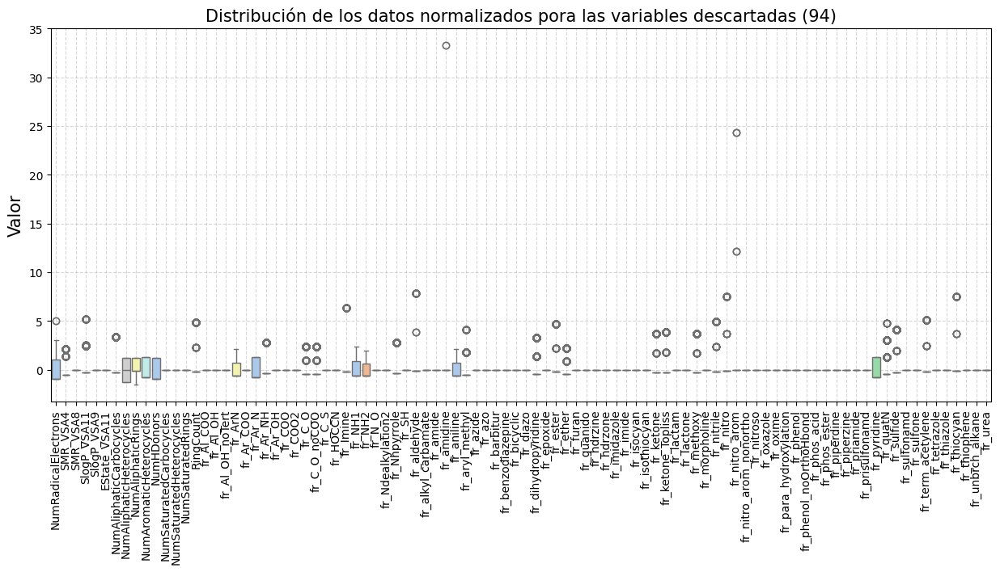

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

plt.figure(figsize=(15, 6))
sns.boxplot(data=pd.DataFrame(scaler.fit_transform(df_reorganitation_Red[lista_borrar]), columns=lista_borrar), palette='pastel')

tamano = len(lista_borrar)
# Agregar etiquetas
plt.title(f'Distribución de los datos normalizados pora las variables descartadas ({tamano})', fontsize=15)
plt.ylabel('Valor', fontsize=15 )
plt.xticks(rotation=90)
plt.grid(True, linestyle='--', alpha=0.5)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/Critero01_Bigotes_Fuera_Red.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
# Mostrar el gráfico
plt.show()

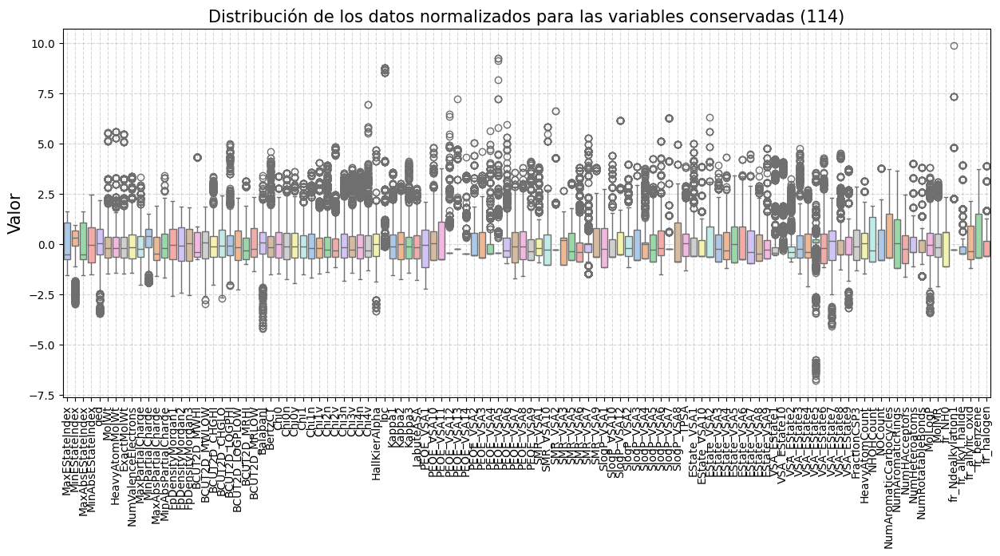

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

plt.figure(figsize=(15, 6))
sns.boxplot(data=pd.DataFrame(scaler.fit_transform(df_filtro_01_Red.iloc[:,4:]), columns=df_filtro_01_Red.iloc[:,4:].columns), palette='pastel')

tamano = df_filtro_01_Red.iloc[:,4:].shape[1]
# Agregar etiquetas
plt.title(f'Distribución de los datos normalizados para las variables conservadas ({tamano})' , fontsize=15)
plt.ylabel('Valor', fontsize=15)
plt.xticks(rotation=90)
plt.grid(True, linestyle='--', alpha=0.5)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/Critero01_Bigotes_Dentro_Red.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
# Mostrar el gráfico
plt.show()

### Criterio 2

In [ ]:
#Matriz de correlacion para tres metodos
corr_matrix_pearson_Red = df_filtro_01_Red.iloc[:,4:].select_dtypes(include=['float64', 'int']).corr(method='pearson')
corr_matrix_kendall_Red = df_filtro_01_Red.iloc[:,4:].select_dtypes(include=['float64', 'int']).corr(method='kendall')
corr_matrix_spearman_Red = df_filtro_01_Red.iloc[:,4:].select_dtypes(include=['float64', 'int']).corr(method='spearman')
#lista de descriptores que tienen una correlacion mayor a 0.9
lista_corr_eliminar_Red_pearson = corr_rm(corr_matrix_pearson_Red,0.9)
lista_corr_eliminar_Red_kendall = corr_rm(corr_matrix_kendall_Red,0.9)
lista_corr_eliminar_Red_spearman = corr_rm(corr_matrix_spearman_Red, 0.9)

df_filtro_02_Red_pearson = df_filtro_01_Red.copy()
df_filtro_02_Red_kendall = df_filtro_01_Red.copy()
df_filtro_02_Red_spearman = df_filtro_01_Red.copy()

df_filtro_02_Red_pearson.drop(columns = lista_corr_eliminar_Red_pearson , axis=1, inplace=True)
df_filtro_02_Red_kendall.drop(columns =lista_corr_eliminar_Red_kendall , axis=1, inplace=True)
df_filtro_02_Red_spearman.drop(columns = lista_corr_eliminar_Red_spearman , axis=1, inplace=True)

30
12
29


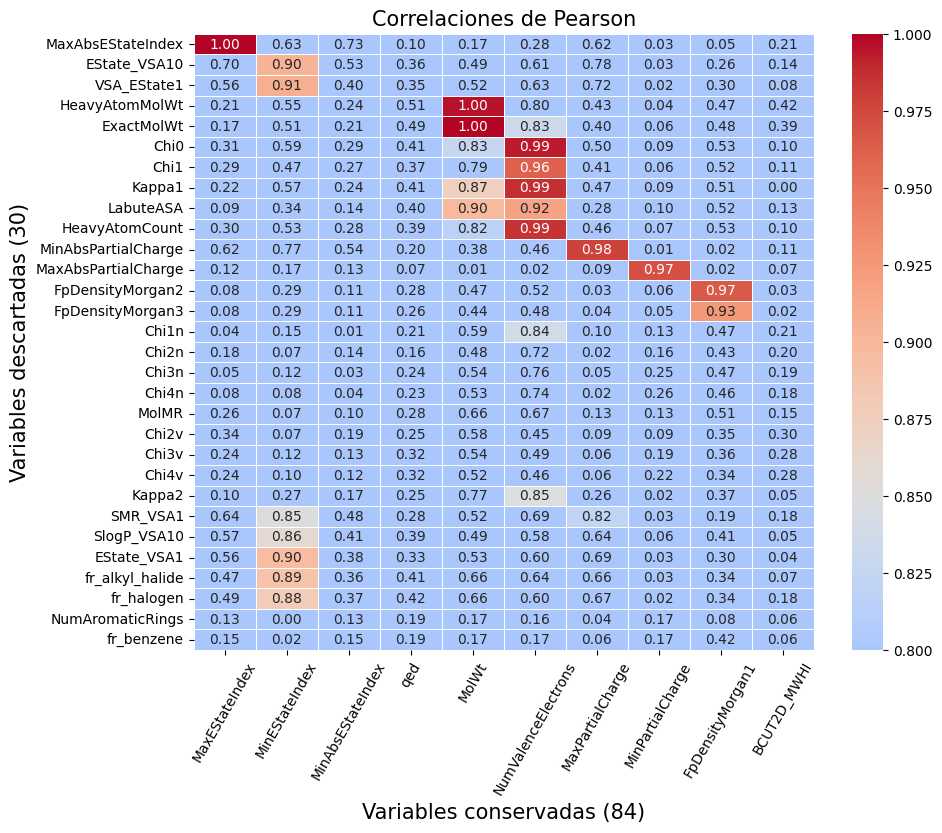

In [ ]:
# Graficar el heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(abs(corr_matrix_pearson_Red.loc[lista_corr_eliminar_Red_pearson, df_filtro_02_Red_pearson.columns[4:14]]), annot=True, cmap='coolwarm', center=0.85, vmin=0.8, vmax=1, fmt='.2f', linewidths=.5)
plt.title('Correlaciones de Pearson', fontsize=15)
plt.ylabel(f'Variables descartadas ({len(lista_corr_eliminar_Red_pearson)})',  fontsize=15)
plt.xlabel(f'Variables conservadas ({df_filtro_02_Red_pearson.shape[1]-4})', fontsize=15)
plt.xticks(rotation=60)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/Critero02_Pearson_MatrixCorr_Red.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

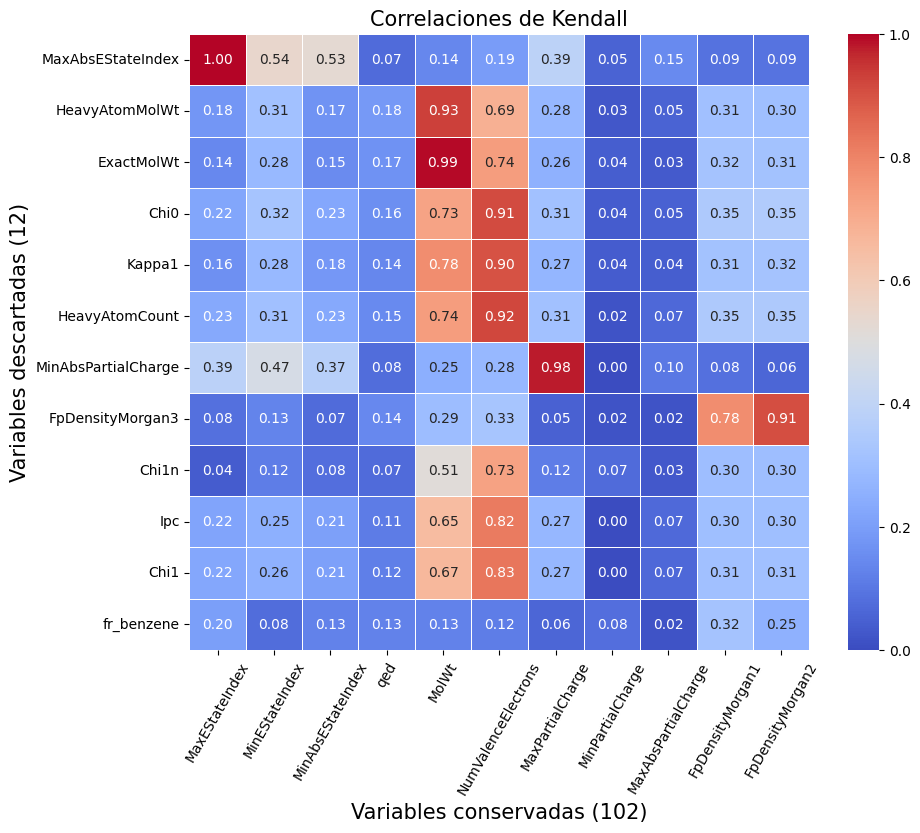

In [ ]:
# Graficar el heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(abs(corr_matrix_kendall_Red.loc[lista_corr_eliminar_Red_kendall, df_filtro_02_Red_kendall.columns[4:15]]), annot=True, cmap='coolwarm', center=0.5, vmin=0, vmax=1, fmt='.2f', linewidths=.5)
plt.title('Correlaciones de Kendall', fontsize=15)
plt.ylabel(f'Variables descartadas ({len(lista_corr_eliminar_Red_kendall)})',  fontsize=15)
plt.xlabel(f'Variables conservadas ({df_filtro_02_Red_kendall.shape[1]-4})', fontsize=15)
plt.xticks(rotation=60)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/Critero02_Kendall_MatrixCorr_Red.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')

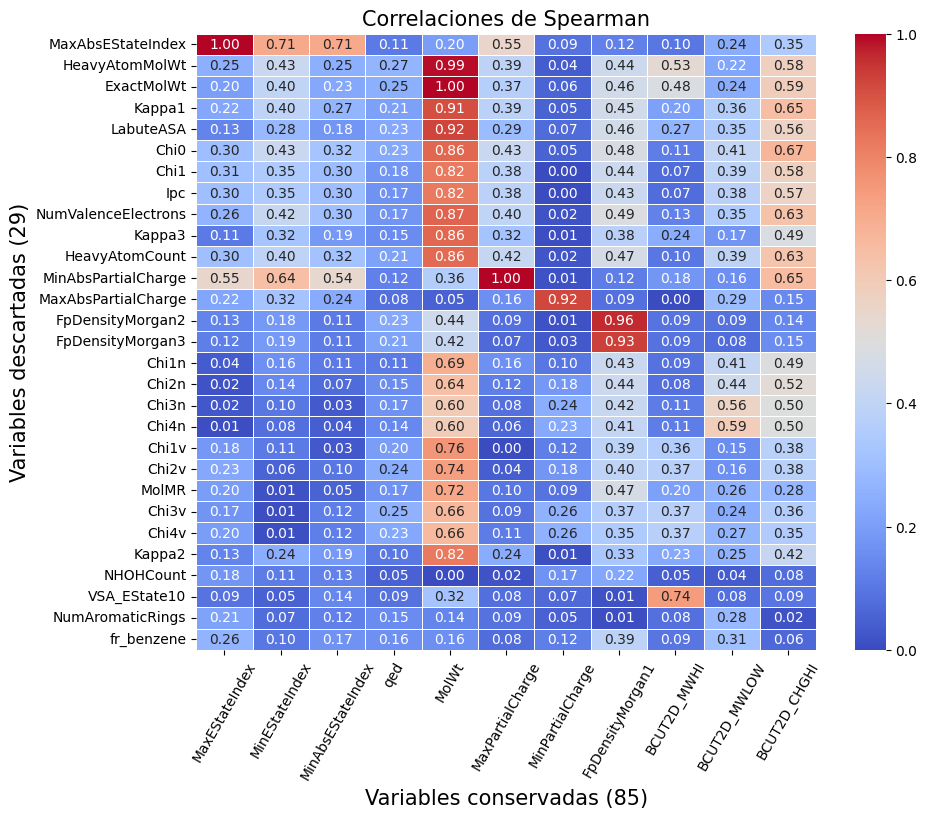

In [ ]:
# Graficar el heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(abs(corr_matrix_spearman_Red.loc[lista_corr_eliminar_Red_spearman, df_filtro_02_Red_spearman.columns[4:15]]), annot=True, cmap='coolwarm', center=0.5, vmin=0, vmax=1, fmt='.2f', linewidths=.5)
plt.title('Correlaciones de Spearman', fontsize=15)
plt.ylabel(f'Variables descartadas ({len(lista_corr_eliminar_Red_spearman)})',  fontsize=15)
plt.xlabel(f'Variables conservadas ({df_filtro_02_Red_spearman.shape[1]-4})', fontsize=15)
plt.xticks(rotation=60)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/Critero02_Spearman_MatrixCorr_Red.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

In [ ]:
print(df_filtro_02_Red_pearson.shape)
print(df_filtro_02_Red_kendall.shape)
print(df_filtro_02_Red_spearman.shape)

(2219, 88)
(2219, 106)
(2219, 89)


## Heatmaps criterios

#Criterio 3: Creación de listas.
 tambien busca variables que coninciden entre los las correlaciones comparando DataBase-Ox y DataBase-Red

In [ ]:
#Correlación con la energía de reorganización
corr_matrix_pearson_Ox = df_filtro_02_Ox_pearson.select_dtypes(include=['float64', 'int']).corr(method='pearson')
corr_matrix_kendall_Ox = df_filtro_02_Ox_kendall.select_dtypes(include=['float64', 'int']).corr(method='kendall')
corr_matrix_spearman_Ox = df_filtro_02_Ox_spearman.select_dtypes(include=['float64', 'int']).corr(method='spearman')

corr_matrix_pearson_Red = df_filtro_02_Red_pearson.select_dtypes(include=['float64', 'int']).corr(method='pearson')
corr_matrix_kendall_Red = df_filtro_02_Red_kendall.select_dtypes(include=['float64', 'int']).corr(method='kendall')
corr_matrix_spearman_Red = df_filtro_02_Red_spearman.select_dtypes(include=['float64', 'int']).corr(method='spearman')

In [ ]:
# Seleccionar las 30 variables con mayor correlación
top_30_pearson_DatOx_lambda_Ox = corr_matrix_pearson_Ox['lambda_Ox'].iloc[4:].abs().nlargest(30)

print("Top 30 variables con mayor correlación (Pearson): lambda_Ox (DatOx)\n")
print(top_30_pearson_DatOx_lambda_Ox.index)

# Seleccionar las 30 variables con mayor correlación
top_30_pearson_DatRed_lambda_Ox = corr_matrix_pearson_Red['lambda_Ox'].iloc[4:].abs().nlargest(30)

print("Top 30 variables con mayor correlación (Pearson): lambda_Ox (DatRed)\n")
print(top_30_pearson_DatRed_lambda_Ox.index)

# Seleccionar las 30 variables con mayor correlación
top_30_pearson_DatOx_lambda_Red = corr_matrix_pearson_Ox['lambda_Red'].iloc[4:].abs().nlargest(30)

print("Top 30 variables con mayor correlación (Pearson): lambda_Red (DatOx)\n")
print(top_30_pearson_DatOx_lambda_Red.index)

# Seleccionar las 30 variables con mayor correlación
top_30_pearson_DatRed_lambda_Red = corr_matrix_pearson_Red['lambda_Red'].iloc[4:].abs().nlargest(30)

print("Top 30 variables con mayor correlación (Pearson): lambda_Red (DatRed)\n")
print(top_30_pearson_DatRed_lambda_Red.index)

Top 30 variables con mayor correlación (Pearson): lambda_Ox (DatOx)

Index(['fr_aryl_methyl', 'PEOE_VSA11', 'fr_allylic_oxid', 'NHOHCount',
       'NumAromaticRings', 'BalabanJ', 'SlogP_VSA3', 'fr_NH0', 'TPSA',
       'SlogP_VSA8', 'PEOE_VSA7', 'PEOE_VSA3', 'PEOE_VSA10', 'BCUT2D_MRLOW',
       'FractionCSP3', 'SMR_VSA9', 'VSA_EState4', 'PEOE_VSA8', 'VSA_EState3',
       'SMR_VSA7', 'VSA_EState9', 'PEOE_VSA1', 'PEOE_VSA2', 'PEOE_VSA13',
       'PEOE_VSA6', 'qed', 'SlogP_VSA6', 'EState_VSA3', 'MinPartialCharge',
       'BCUT2D_MWLOW'],
      dtype='object')
Top 30 variables con mayor correlación (Pearson): lambda_Ox (DatRed)

Index(['NHOHCount', 'PEOE_VSA11', 'VSA_EState4', 'NumAromaticCarbocycles',
       'SlogP_VSA8', 'TPSA', 'fr_NH0', 'SMR_VSA3', 'PEOE_VSA8', 'BCUT2D_MRLOW',
       'FractionCSP3', 'VSA_EState6', 'BCUT2D_CHGHI', 'PEOE_VSA7', 'SMR_VSA9',
       'PEOE_VSA1', 'BCUT2D_CHGLO', 'PEOE_VSA3', 'FpDensityMorgan1',
       'VSA_EState9', 'SlogP_VSA2', 'SlogP_VSA1', 'VSA_EState7', 

In [ ]:
# Seleccionar las 30 variables con mayor correlación
top_30_kendall_DatOx_lambda_Ox = corr_matrix_kendall_Ox['lambda_Ox'].iloc[4:].abs().nlargest(30)

print("Top 30 variables con mayor correlación (kendall): lambda_Ox (DatOx)\n")
print(top_30_kendall_DatOx_lambda_Ox.index)

# Seleccionar las 30 variables con mayor correlación
top_30_kendall_DatRed_lambda_Ox = corr_matrix_kendall_Red['lambda_Ox'].iloc[4:].abs().nlargest(30)

print("Top 30 variables con mayor correlación (kendall): lambda_Ox (DatRed)\n")
print(top_30_kendall_DatRed_lambda_Ox.index)

# Seleccionar las 30 variables con mayor correlación
top_30_kendall_DatOx_lambda_Red = corr_matrix_kendall_Ox['lambda_Red'].iloc[4:].abs().nlargest(30)

print("Top 30 variables con mayor correlación (kendall): lambda_Red (DatOx)\n")
print(top_30_kendall_DatOx_lambda_Red.index)

# Seleccionar las 30 variables con mayor correlación
top_30_kendall_DatRed_lambda_Red = corr_matrix_kendall_Red['lambda_Red'].iloc[4:].abs().nlargest(30)

print("Top 30 variables con mayor correlación (kendall): lambda_Red (DatRed)\n")
print(top_30_kendall_DatRed_lambda_Red.index)

Top 30 variables con mayor correlación (kendall): lambda_Ox (DatOx)

Index(['fr_aryl_methyl', 'PEOE_VSA11', 'fr_allylic_oxid', 'NumAromaticRings',
       'NHOHCount', 'BCUT2D_MRLOW', 'BalabanJ', 'SlogP_VSA3', 'fr_NH0',
       'PEOE_VSA7', 'VSA_EState3', 'PEOE_VSA10', 'VSA_EState9', 'SlogP_VSA8',
       'TPSA', 'PEOE_VSA2', 'SMR_VSA9', 'PEOE_VSA3', 'PEOE_VSA6', 'SMR_VSA7',
       'FractionCSP3', 'PEOE_VSA1', 'PEOE_VSA8', 'SlogP_VSA4', 'PEOE_VSA13',
       'FpDensityMorgan2', 'qed', 'PEOE_VSA12', 'VSA_EState4', 'EState_VSA9'],
      dtype='object')
Top 30 variables con mayor correlación (kendall): lambda_Ox (DatRed)

Index(['PEOE_VSA11', 'NHOHCount', 'SlogP_VSA8', 'NumAromaticCarbocycles',
       'VSA_EState4', 'fr_NH0', 'VSA_EState9', 'TPSA', 'BCUT2D_CHGHI',
       'BCUT2D_MRLOW', 'PEOE_VSA1', 'MinPartialCharge', 'PEOE_VSA8',
       'PEOE_VSA3', 'SMR_VSA3', 'FractionCSP3', 'MaxAbsPartialCharge',
       'SMR_VSA9', 'SlogP_VSA3', 'SlogP_VSA10', 'PEOE_VSA7',
       'FpDensityMorgan1', 'Slo

In [ ]:
# Seleccionar las 30 variables con mayor correlación
top_30_spearman_DatOx_lambda_Ox = corr_matrix_spearman_Ox['lambda_Ox'].iloc[4:].abs().nlargest(30)

print("Top 30 variables con mayor correlación (spearman): lambda_Ox (DatOx)\n")
print(top_30_spearman_DatOx_lambda_Ox.index)

# Seleccionar las 30 variables con mayor correlación
top_30_spearman_DatRed_lambda_Ox = corr_matrix_spearman_Red['lambda_Ox'].iloc[4:].abs().nlargest(30)

print("Top 30 variables con mayor correlación (spearman): lambda_Ox (DatRed)\n")
print(top_30_spearman_DatRed_lambda_Ox.index)

# Seleccionar las 30 variables con mayor correlación
top_30_spearman_DatOx_lambda_Red = corr_matrix_spearman_Ox['lambda_Red'].iloc[4:].abs().nlargest(30)

print("Top 30 variables con mayor correlación (spearman): lambda_Red (DatOx)\n")
print(top_30_spearman_DatOx_lambda_Red.index)

# Seleccionar las 30 variables con mayor correlación
top_30_spearman_DatRed_lambda_Red = corr_matrix_spearman_Red['lambda_Red'].iloc[4:].abs().nlargest(30)

print("Top 30 variables con mayor correlación (spearman): lambda_Red (DatRed)\n")
print(top_30_spearman_DatRed_lambda_Red.index)

Top 30 variables con mayor correlación (spearman): lambda_Ox (DatOx)

Index(['fr_aryl_methyl', 'PEOE_VSA11', 'fr_allylic_oxid', 'NHOHCount',
       'BCUT2D_MRLOW', 'NumAromaticRings', 'BalabanJ', 'SlogP_VSA3',
       'PEOE_VSA7', 'VSA_EState3', 'PEOE_VSA10', 'VSA_EState9', 'fr_NH0',
       'TPSA', 'SlogP_VSA8', 'SMR_VSA7', 'PEOE_VSA6', 'PEOE_VSA2', 'SMR_VSA9',
       'PEOE_VSA3', 'PEOE_VSA8', 'PEOE_VSA1', 'FractionCSP3', 'SlogP_VSA4',
       'qed', 'PEOE_VSA13', 'MinPartialCharge', 'VSA_EState4', 'PEOE_VSA12',
       'VSA_EState1'],
      dtype='object')
Top 30 variables con mayor correlación (spearman): lambda_Ox (DatRed)

Index(['PEOE_VSA11', 'VSA_EState4', 'SlogP_VSA8', 'NumAromaticCarbocycles',
       'TPSA', 'BCUT2D_MRLOW', 'VSA_EState9', 'BCUT2D_CHGHI',
       'MinPartialCharge', 'fr_NH0', 'PEOE_VSA8', 'PEOE_VSA1', 'PEOE_VSA3',
       'SMR_VSA3', 'FractionCSP3', 'PEOE_VSA7', 'FpDensityMorgan1', 'SMR_VSA9',
       'SlogP_VSA10', 'SlogP_VSA2', 'SlogP_VSA3', 'SlogP_VSA1', 'PEOE_VSA6

In [ ]:
!pip install factor_analyzer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 kB 3.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for factor_analyzer: filename=factor_analyzer-0.5.1-py2.py3-none-any.whl size=42622 sha256=005c306df24112e83dddfb927c89c477b39c447c863905366b20c2046781924b
  Stored in directory: /root/.cache/pip/wheels/fa/f7/53/a55a8a56668a6fe0199e0e02b6e0ae3007ec35cdf6e4c25df7
Successfully built factor_analyzer


In [ ]:
from factor_analyzer import calculate_kmo

# Calcular la prueba KMO
kmo_all, kmo_DatOx_lambda_Ox = calculate_kmo( df_reorganitation_Ox[top_30_pearson_DatOx_lambda_Ox.index])
kmo_all, kmo_DatOx_lambda_Red = calculate_kmo( df_reorganitation_Ox[top_30_pearson_DatOx_lambda_Red.index])

kmo_all, kmo_DatRed_lambda_Ox = calculate_kmo( df_reorganitation_Red[top_30_pearson_DatRed_lambda_Ox.index])
kmo_all, kmo_DatRed_lambda_Red = calculate_kmo( df_reorganitation_Red[top_30_pearson_DatRed_lambda_Red.index])

print(f"kmo_DatOx_lambda_Ox  {kmo_DatOx_lambda_Ox:.2f}")
print(f"kmo_DatOx_lambda_Red {kmo_DatOx_lambda_Red:.2f}")
print(f"kmo_DatRed_lambda_Ox {kmo_DatRed_lambda_Ox:.2f}")
print(f"kmo_DatRed_lambda_Red {kmo_DatRed_lambda_Red:.2f}")

kmo_DatOx_lambda_Ox  0.70
kmo_DatOx_lambda_Red 0.65
kmo_DatRed_lambda_Ox 0.72
kmo_DatRed_lambda_Red 0.64


In [ ]:
# Calcular la prueba KMO
kmo_all, kmo_DatOx_lambda_Ox = calculate_kmo( df_reorganitation_Ox[top_30_kendall_DatOx_lambda_Ox.index])
kmo_all, kmo_DatOx_lambda_Red = calculate_kmo( df_reorganitation_Ox[top_30_kendall_DatOx_lambda_Red.index])

kmo_all, kmo_DatRed_lambda_Ox = calculate_kmo( df_reorganitation_Red[top_30_kendall_DatRed_lambda_Ox.index])
kmo_all, kmo_DatRed_lambda_Red = calculate_kmo( df_reorganitation_Red[top_30_kendall_DatRed_lambda_Red.index])

print(f"kmo_DatOx_lambda_Ox {kmo_DatOx_lambda_Ox:.2f}")
print(f"kmo_DatOx_lambda_Red: {kmo_DatOx_lambda_Red:.2f}")
print(f"kmo_DatRed_lambda_Ox: {kmo_DatRed_lambda_Ox:.2f}")
print(f"kmo_DatRed_lambda_Red: {kmo_DatRed_lambda_Red:.2f}")

kmo_DatOx_lambda_Ox 0.63
kmo_DatOx_lambda_Red: 0.72
kmo_DatRed_lambda_Ox: 0.68
kmo_DatRed_lambda_Red: 0.74


In [ ]:
# Calcular la prueba KMO
kmo_all, kmo_DatOx_lambda_Ox = calculate_kmo( df_reorganitation_Ox[top_30_spearman_DatOx_lambda_Ox.index])
kmo_all, kmo_DatOx_lambda_Red = calculate_kmo( df_reorganitation_Ox[top_30_spearman_DatOx_lambda_Red.index])

kmo_all, kmo_DatRed_lambda_Ox = calculate_kmo( df_reorganitation_Red[top_30_spearman_DatRed_lambda_Ox.index])
kmo_all, kmo_DatRed_lambda_Red = calculate_kmo( df_reorganitation_Red[top_30_spearman_DatRed_lambda_Red.index])

print(f"kmo_DatOx_lambda_Ox: {kmo_DatOx_lambda_Ox:.2f}")
print(f"kmo_DatOx_lambda_Red: {kmo_DatOx_lambda_Red:.2f}")
print(f"kmo_DatRed_lambda_Ox: {kmo_DatRed_lambda_Ox:.2f}")
print(f"kmo_DatRed_lambda_Red: {kmo_DatRed_lambda_Red:.2f}")

kmo_DatOx_lambda_Ox: 0.62
kmo_DatOx_lambda_Red: 0.64
kmo_DatRed_lambda_Ox: 0.66
kmo_DatRed_lambda_Red: 0.59


#Evolución criterios

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

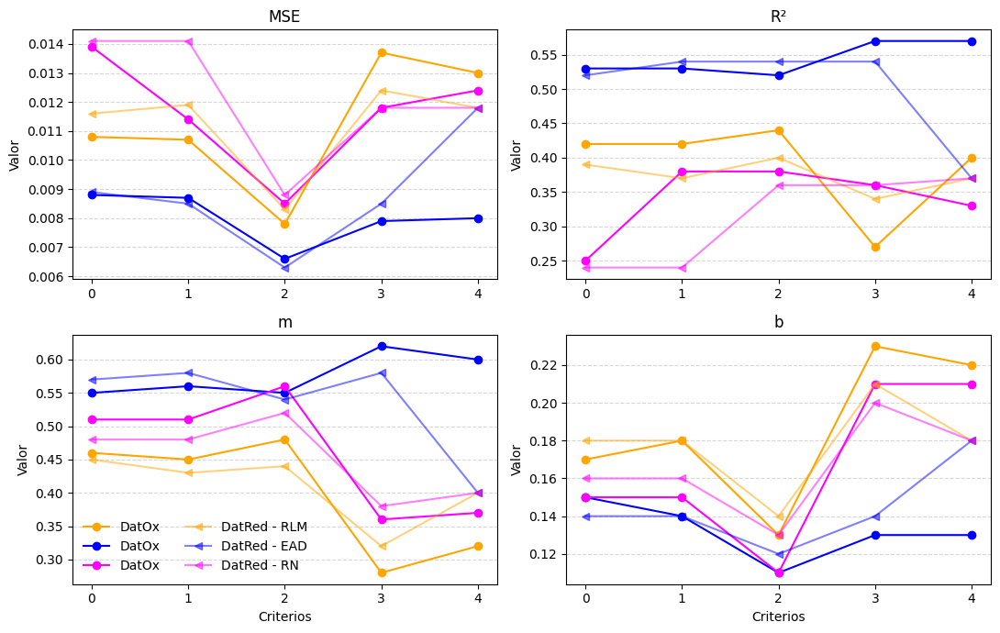

In [ ]:
# Definir métricas y modelos
metrics = ['MSE', 'R²', 'm', 'b']
models = ['RLM', 'EAD', 'RN']
criterios = ['0', '1', '2', '3', '4']

criterio00 = {
    'DatOx': [[0.0108, 0.42, 0.46, 0.17], [0.0088, 0.53, 0.55, 0.15], [0.0139, 0.25, 0.51, 0.15]],
    'DatRed': [[0.0116, 0.39, 0.45, 0.18], [0.0089, 0.52, 0.57, 0.14], [0.0141, 0.24, 0.48, 0.16]],
}
criterio01 = {
    'DatOx': [[0.0107, 0.42, 0.45, 0.18], [0.0087, 0.53, 0.56, 0.14], [0.0114, 0.38, 0.51, 0.15]],
    'DatRed': [[0.0119, 0.37, 0.43, 0.18], [0.0085, 0.54, 0.58, 0.14], [0.0141, 0.24, 0.48, 0.16]],
}
criterio02 = {
    'DatOx': [[0.0078, 0.44, 0.48, 0.13], [0.0066, 0.52, 0.55, 0.11], [0.0085, 0.38, 0.56, 0.11]],
    'DatRed': [[0.0083, 0.40, 0.44, 0.14], [0.0063, 0.54, 0.54, 0.12], [0.0088, 0.36, 0.52, 0.13]],
}
criterio03 = {
    'DatOx': [[0.0137, 0.27, 0.28, 0.23], [0.0079, 0.57, 0.62, 0.13], [0.0118, 0.36, 0.36, 0.21]],
    'DatRed': [[0.0124, 0.34, 0.32, 0.21], [0.0085, 0.54, 0.58, 0.14], [0.0118, 0.36, 0.38, 0.20]],
}
criterio04 = {
    'DatOx': [[0.0130, 0.40, 0.32, 0.22], [0.0080, 0.57, 0.60, 0.13], [0.0124, 0.33, 0.37, 0.21]],
    'DatRed': [[0.0128, 0.32, 0.31, 0.22], [0.0083, 0.55, 0.54, 0.15], [0.0118, 0.37, 0.40, 0.18]],
}


# Crear gráfica de líneas
fig, ax = plt.subplots(2, 2, figsize=(11, 7))  # Subgráficos para cada métrica

for i, metric in enumerate(metrics):
    row, col = divmod(i, 2)
    ax[row, col].plot(criterios, [criterio00['DatOx'][0][i],
                                  criterio01['DatOx'][0][i],
                                  criterio02['DatOx'][0][i],
                                  criterio03['DatOx'][0][i], criterio04['DatOx'][0][i]],
                       label='DatOx', marker='o', color='orange')

    ax[row, col].plot(criterios, [criterio00['DatOx'][1][i],
                                  criterio01['DatOx'][1][i],
                                  criterio02['DatOx'][1][i],
                                  criterio03['DatOx'][1][i],
                                  criterio04['DatOx'][1][i]],
                       label='DatOx', marker='o', color='blue')

    ax[row, col].plot(criterios, [criterio00['DatOx'][2][i],
                                  criterio01['DatOx'][2][i],
                                  criterio02['DatOx'][2][i],
                                  criterio03['DatOx'][2][i],
                                  criterio04['DatOx'][2][i]],
                      label='DatOx', marker='o', color='magenta')

    ax[row, col].plot(criterios, [criterio00['DatRed'][0][i],
                                  criterio01['DatRed'][0][i],
                                  criterio02['DatRed'][0][i],
                                  criterio03['DatRed'][0][i],
                                  criterio04['DatRed'][2][i]],
                      label='DatRed - RLM', marker='<', color='orange', alpha=0.5)

    ax[row, col].plot(criterios, [criterio00['DatRed'][1][i],
                                  criterio01['DatRed'][1][i],
                                  criterio02['DatRed'][1][i],
                                  criterio03['DatRed'][1][i],
                                  criterio04['DatRed'][2][i]]
                      , label='DatRed - EAD', marker='<', color='blue', alpha=0.5)

    ax[row, col].plot(criterios, [criterio00['DatRed'][2][i],
                                  criterio01['DatRed'][2][i],
                                  criterio02['DatRed'][2][i],
                                  criterio03['DatRed'][2][i],
                                  criterio04['DatRed'][2][i]]
                      , label='DatRed - RN', marker='<', color='magenta', alpha=0.5)

    ax[row, col].set_title(metric)
    ax[row, col].set_ylabel('Valor')
    ax[row, col].grid(axis='y', linestyle='--', alpha=0.5)

ax[1, 0].legend(loc='best', ncol=2, title=None, frameon=False)
ax[1,0].set_xlabel('Criterios')
ax[1,1].set_xlabel('Criterios')

plt.tight_layout()
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/All/lambda_Red/Criteros_evolucion.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')

plt.show()

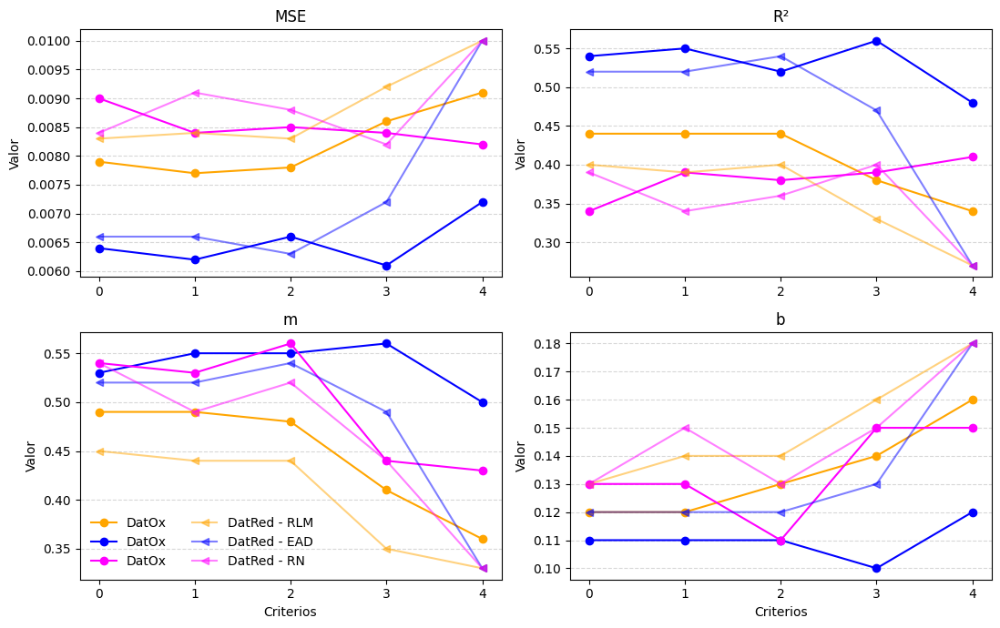

In [ ]:
#λOx
metrics = ['MSE', 'R²', 'm', 'b']
models = ['RLM', 'EAD', 'RN']
criterios = ['0', '1', '2', '3', '4']

criterio00 = {
    'DatOx': [
    [0.0079, 0.44, 0.49, 0.12],
    [0.0064, 0.54, 0.53, 0.11],
    [0.0090, 0.34, 0.54, 0.13]],
    'DatRed': [
    [0.0083, 0.40, 0.45, 0.13],
    [0.0066, 0.52, 0.52, 0.12],
    [0.0084, 0.39, 0.54, 0.13]]
}

criterio01 = {
    'DatOx': [
    [0.0077, 0.44, 0.49, 0.12],
    [0.0062, 0.55, 0.55, 0.11],
    [0.0084, 0.39, 0.53, 0.13]],
    'DatRed': [
    [0.0084, 0.39, 0.44, 0.14],
    [0.0066, 0.52, 0.52, 0.12],
    [0.0091, 0.34, 0.49, 0.15]]
}

criterio02 = {
    'DatOx': [
    [0.0078, 0.44, 0.48, 0.13],
    [0.0066, 0.52, 0.55, 0.11],
    [0.0085, 0.38, 0.56, 0.11]],
    'DatRed': [
    [0.0083, 0.40, 0.44, 0.14],
    [0.0063, 0.54, 0.54, 0.12],
    [0.0088, 0.36, 0.52, 0.13]]
}

criterio03 = {
    'DatOx': [
    [0.0086, 0.38, 0.41, 0.14],
    [0.0061, 0.56, 0.56, 0.10],
    [0.0084, 0.39, 0.44, 0.15]],
    'DatRed': [
    [0.0092, 0.33, 0.35, 0.16],
    [0.0072, 0.47, 0.49, 0.13],
    [0.0082, 0.40, 0.44, 0.15]]
}
criterio04 = {
    'DatOx': [
    [0.0091, 0.34, 0.36, 0.16],
    [0.0072, 0.48, 0.50, 0.12],
    [0.0082, 0.41, 0.43, 0.15]],
    'DatRed': [
    [0.0117, 0.17, 0.22, 0.19],
    [0.0073, 0.47, 0.47, 0.14],
    [0.0100, 0.27, 0.33, 0.18]]
}


# Crear gráfica de líneas
fig, ax = plt.subplots(2, 2, figsize=(11, 7))  # Subgráficos para cada métrica

for i, metric in enumerate(metrics):
    row, col = divmod(i, 2)
    ax[row, col].plot(criterios, [criterio00['DatOx'][0][i],
                                  criterio01['DatOx'][0][i],
                                  criterio02['DatOx'][0][i],
                                  criterio03['DatOx'][0][i], criterio04['DatOx'][0][i]],
                       label='DatOx', marker='o', color='orange')

    ax[row, col].plot(criterios, [criterio00['DatOx'][1][i],
                                  criterio01['DatOx'][1][i],
                                  criterio02['DatOx'][1][i],
                                  criterio03['DatOx'][1][i],
                                  criterio04['DatOx'][1][i]],
                       label='DatOx', marker='o', color='blue')

    ax[row, col].plot(criterios, [criterio00['DatOx'][2][i],
                                  criterio01['DatOx'][2][i],
                                  criterio02['DatOx'][2][i],
                                  criterio03['DatOx'][2][i],
                                  criterio04['DatOx'][2][i]],
                      label='DatOx', marker='o', color='magenta')

    ax[row, col].plot(criterios, [criterio00['DatRed'][0][i],
                                  criterio01['DatRed'][0][i],
                                  criterio02['DatRed'][0][i],
                                  criterio03['DatRed'][0][i],
                                  criterio04['DatRed'][2][i]],
                      label='DatRed - RLM', marker='<', color='orange', alpha=0.5)

    ax[row, col].plot(criterios, [criterio00['DatRed'][1][i],
                                  criterio01['DatRed'][1][i],
                                  criterio02['DatRed'][1][i],
                                  criterio03['DatRed'][1][i],
                                  criterio04['DatRed'][2][i]]
                      , label='DatRed - EAD', marker='<', color='blue', alpha=0.5)

    ax[row, col].plot(criterios, [criterio00['DatRed'][2][i],
                                  criterio01['DatRed'][2][i],
                                  criterio02['DatRed'][2][i],
                                  criterio03['DatRed'][2][i],
                                  criterio04['DatRed'][2][i]]
                      , label='DatRed - RN', marker='<', color='magenta', alpha=0.5)

    ax[row, col].set_title(metric)
    ax[row, col].set_ylabel('Valor')
    ax[row, col].grid(axis='y', linestyle='--', alpha=0.5)

ax[1, 0].legend(loc='best', ncol=2, title=None, frameon=False)
ax[1,0].set_xlabel('Criterios')
ax[1,1].set_xlabel('Criterios')

plt.tight_layout()
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/All/lambda_Ox/Criteros_evolucion.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')

plt.show()

#Funciones: RLM, EAD, RN

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error,  r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np

def model_rlm(data_Ox, data_Red, energia, random, color1, color2):

    model = LinearRegression()
    def rlm(data, energia, color, name):
      train = data.drop(columns=['lambda1', 'lambda2', 'lambda_Ox', 'lambda_Red'])

      # Datos
      y = data[energia].values
      X_train, X_test, y_train, y_test = train_test_split(train, y, test_size=.2, random_state=random)

      # Entrenamiento del modelo multilineal
      multilineal = model.fit(X_train, y_train)
      prediction = multilineal.predict(X_test)
      mse = mean_squared_error(y_test, prediction)

      # Configurar y entrenar el modelo de regresión lineal
      x_lineal = np.array(y_test).reshape(-1, 1)
      y_lineal = prediction
      lineal = model.fit(x_lineal, y_lineal)

      # Realizar predicciones con el modelo entrenado
      y_pred_lineal = lineal.predict(x_lineal)

      # Calcular el coeficiente de determinación (R^2)
      r2 = r2_score(y_lineal, y_pred_lineal)

      # Obtener la pendiente (coeficiente) y la ordenada al origen (intercepto)
      pendiente = lineal.coef_[0]
      ordenada_al_origen = lineal.intercept_
      descript = data.shape[1]-4


      # Graficar la recta de predicción
      x_graf = np.linspace(min(x_lineal), max(x_lineal), 100).reshape(-1, 1)
      y_graf = lineal.predict(x_graf)
      plt.plot(x_graf, y_graf, color=color)
      plt.scatter(y_test, prediction, label='${} - D: {},\quad MSE: {:.4f},\quad R^2: {:.2f}, \quad y = {:.2f}x + {:.2f}$'.format(name, descript ,mse, r2, pendiente, ordenada_al_origen), color=color)#alpha=0.6, s=20,

      return

    rlm(data_Ox, energia, color1, 'DatOx')
    rlm(data_Red, energia, color2, 'DatRed')

    plt.ylabel("Predicciones", fontsize= 15)
    plt.xlabel("Reales", fontsize= 15)

    #Recta con pendiente 1
    x = np.linspace(min(data_Ox[energia]), max(data_Ox[energia]), 100)
    y_plot = x
    plt.plot(x, y_plot, color='magenta')

    plt.legend(fontsize=15, loc='upper center')
    plt.xlim(min(data_Ox[energia]) - 0.1, max(data_Ox[energia]) + 0.1)
    plt.ylim(0, .8)
    plt.xlim(0,.8)

    return

In [ ]:
# Importar librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import train_test_split
import xgboost as xgb

# Definir las funciones
def model_ead(data_Ox, data_Red, energia, random, color1, color2):

    def rlm(data, energia, color, name):
        # Preparar los datos
        train = data.drop(columns=['lambda1', 'lambda2', 'lambda_Ox', 'lambda_Red'])
        y = data[energia].values
        X_train, X_test, y_train, y_test = train_test_split(train, y, test_size=.2, random_state=random)

        dtrain = xgb.DMatrix(X_train, label=y_train)
        dtest = xgb.DMatrix(X_test, label=y_test)

        # Parámetros del modelo
        params = {
            'objective': 'reg:squarederror',  # Configurar el objetivo para regresión
            'booster': 'gbtree',  # Utilizar un modelo de regresión con árboles
            #'max_depth': 8,
            #'learning_rate': 0.001,
        }

        evals = [(dtrain, 'train'), (dtest, 'eval')]

        # Entrenar el modelo
        model = xgb.train(params=params,
                          dtrain=dtrain,
                          num_boost_round=10000,
                          evals=evals,
                          verbose_eval=100,
                          early_stopping_rounds=10)

        # Realizar predicciones en el conjunto de prueba
        prediction = model.predict(dtest)

        # Calcular el coeficiente de determinación (R^2)
        r2 = r2_score(y_test, prediction)

        # Calcular la recta de predicción (lineal) - pendiente y ordenada al origen
        lineal = LinearRegression().fit(y_test.reshape(-1, 1), prediction)
        pendiente = lineal.coef_[0]
        ordenada_al_origen = lineal.intercept_

        # Número de descriptores
        descript = data.shape[1] - 4

        # Graficar la recta de predicción
        x_graf = np.linspace(min(y_test), max(y_test), 100).reshape(-1, 1)
        y_graf = lineal.predict(x_graf)
        plt.plot(x_graf, y_graf, color=color)

        # Graficar scatter plot
        plt.scatter(y_test, prediction,
                    label='${} - D: {},\quad MSE: {:.4f},\quad R^2: {:.2f}, \quad y = {:.2f}x + {:.2f}$'.format(
                        name, descript, mean_squared_error(y_test, prediction), r2, pendiente, ordenada_al_origen),
                     color=color)# alpha=0.6, s=20

        return

    # Aplicar la función rlm a los datos Ox y Red
    rlm(data_Ox, energia, color1, 'DatOx')
    rlm(data_Red, energia, color2, 'DatRed')

    # Configuración de la gráfica
    plt.ylabel("Predicciones", fontsize=15)
    plt.xlabel("Reales", fontsize=15)

    # Recta con pendiente 1
    x = np.linspace(min(data_Ox[energia]), max(data_Ox[energia]), 100)
    y_plot = x
    plt.plot(x, y_plot, color='magenta')

    plt.legend(fontsize=15, loc='upper center')
    plt.xlim(min(data_Ox[energia]) - 0.1, max(data_Ox[energia]) + 0.1)
    plt.ylim(0, 0.8)
    plt.xlim(0,.8)

    return

In [ ]:
# Importar librerías necesarias
import numpy as np
import tensorflow as tf
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras import initializers
from sklearn.model_selection import train_test_split
from sklearn.datasets import fetch_california_housing
from sklearn.preprocessing import StandardScaler
import keras.backend as K
import gc

# Asegurar la reproducibilidad fijando las semillas
def set_seed(seed=42):
    np.random.seed(seed)
    tf.random.set_seed(seed)
    keras.utils.set_random_seed(seed)

# Limpiar la sesión de Keras y liberar memoria
def reset_keras():
    K.clear_session()
    gc.collect()

# Descargar y preparar el dataset (California Housing)
def load_and_preprocess_data(data, energia):
    X = data.drop(columns=['lambda1', 'lambda2', 'lambda_Ox', 'lambda_Red'])
    y = data[energia]

    # Normalización de los datos
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Dividir en conjunto de entrenamiento y prueba
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

    return X_train, X_test, y_train, y_test

# Definir el modelo de red neuronal para ajuste (regresión)
def build_model(input_shape):
    model = Sequential()
    model.add(Dense(20, input_dim=input_shape, kernel_initializer=initializers.GlorotNormal(seed=42), activation='sigmoid'))
    model.add(Dense(1)) #sigmoid, softplus,exponential, lineal

    # Compilar el modelo
    model.compile(loss='mean_squared_error', optimizer='adam')

    return model

# Función principal
def main(df, energia):
    # Paso 1: Limpiar Keras y fijar la semilla para reproducibilidad
    reset_keras()
    set_seed(42)

    # Paso 2: Cargar y preprocesar los datos
    X_train, X_test, y_train, y_test = load_and_preprocess_data(df, energia)

    # Paso 3: Construir el modelo
    model = build_model(X_train.shape[1])

    #X_test, X_valid, y_test, y_valid = train_test_split(X_test, y_test, test_size=0.5, random_state=42)

    # Paso 4: Entrenar el modelo
    history = model.fit(X_train,
                        y_train,
                        epochs=100,
                        verbose=0,
                        validation_data=(X_test, y_test))

    # Evaluar el modelo
    loss = model.evaluate(X_test, y_test, verbose=0)
    print(f'Pérdida en el conjunto de prueba: {loss:.4f}')

    return model, history,  X_test, y_test

def metrics_lineal(model, X_test, y_test):

    y_pred = model.predict(X_test)

    # Cálculo de R^2 y MSE
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"Mean Squared Error: {mse}")
    print(f"R^2: {r2}")

    # Ajuste lineal para obtener la ecuación de la recta
    lin_reg = LinearRegression()
    lin_reg.fit(np.array(y_test).reshape(-1, 1), np.array(y_pred).reshape(-1, 1))
    y_lineal = lin_reg.predict(np.array(y_test).reshape(-1, 1))
    m = lin_reg.coef_[0][0]
    b = lin_reg.intercept_[0]
    return y_lineal, y_pred, mse, r2, m, b

In [ ]:
#plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

# 2. Graficar el historial de entrenamiento
def plot_history(history):
    plt.figure(figsize=(12, 6))

    # Graficar la pérdida de entrenamiento
    plt.plot(history.history['loss'], label='Train')

    # Graficar la pérdida de validación
    if 'val_loss' in history.history:
        plt.plot(history.history['val_loss'], label='Test')

    # Etiquetas y título
    plt.title('Entrenamiento', fontsize=14)
    plt.xlabel('Epocas', fontsize=12)
    plt.ylabel('ECM', fontsize=12)
    plt.legend()
    #plt.grid(True)
    plt.show()

# Redes neuronales

## Criterio 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0090


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0084
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Mean Squared Error: 0.009003612464304332
R^2: 0.3438357213909228
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.00842791287842011
R^2: 0.38579149247335254


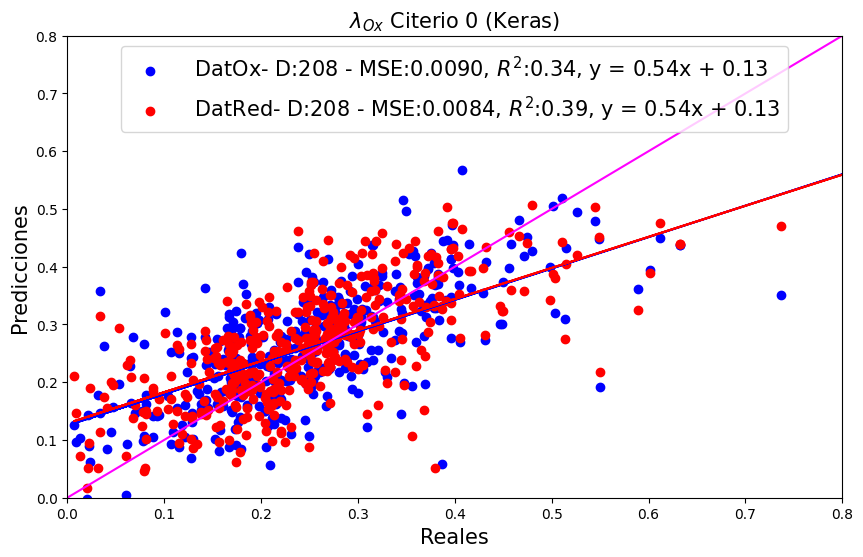

In [ ]:
df_entrenamiento_Ox = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Ox], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Red], axis=1)
descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

energia_reorganizacion = 'lambda_Ox'
energia_title = '$\lambda_{Ox}$'

model, history, X_test, y_test = main(df_entrenamiento_Ox, energia_reorganizacion)
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, energia_reorganizacion)

plt.figure(figsize=(10, 6))
plt.ylim(0, 0.8)
plt.xlim(0, 0.8)
# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx- D:{descript_Ox} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed- D:{descript_Red} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 0 (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero0_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0139


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0141
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Mean Squared Error: 0.013943390863069805
R^2: 0.24784795294573514
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Mean Squared Error: 0.014058791003063958
R^2: 0.24162289245798507


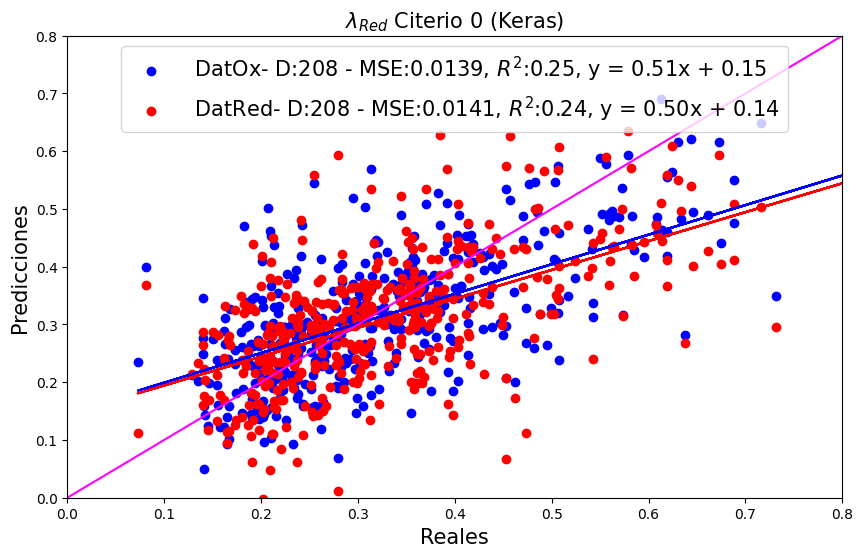

In [ ]:
df_entrenamiento_Ox = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Ox], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Red], axis=1)
descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

energia_reorganizacion = 'lambda_Red'
energia_title = '$\lambda_{Red}$'

model, history, X_test, y_test = main(df_entrenamiento_Ox, energia_reorganizacion)
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, energia_reorganizacion)

plt.figure(figsize=(10, 6))
plt.ylim(0, 0.8)
plt.xlim(0, 0.8)
# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx- D:{descript_Ox} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed- D:{descript_Red} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 0 (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero0_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

## Criterio 1

(2219, 117)
(2219, 118)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0084


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0091
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.008435752662989142
R^2: 0.38522014551605255
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Mean Squared Error: 0.009090892781716705
R^2: 0.33747491602099877


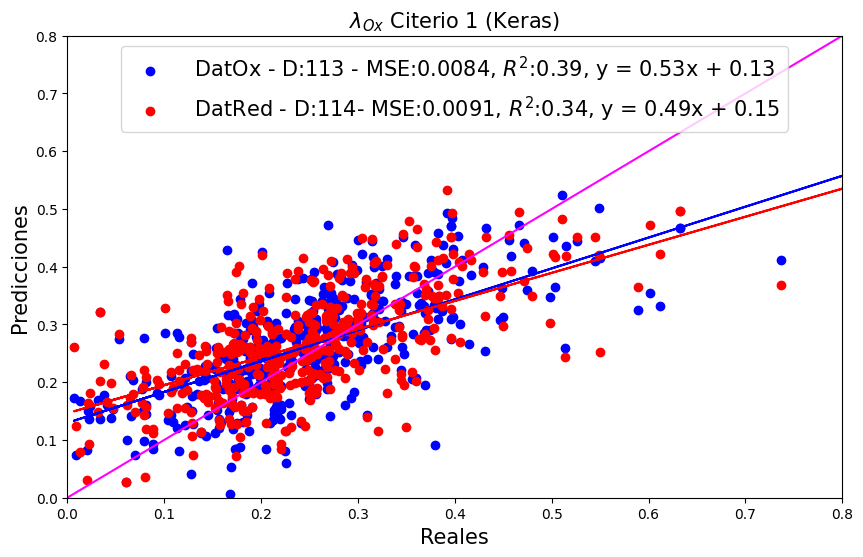

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_01_Ox
df_entrenamiento_Red = df_filtro_01_Red
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)
descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

energia_reorganizacion = 'lambda_Ox'
energia_title = '$\lambda_{Ox}$'

model, history, X_test, y_test = main(df_entrenamiento_Ox, energia_reorganizacion)
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, energia_reorganizacion)

plt.figure(figsize=(10, 6))
plt.ylim(0, 0.8)
plt.xlim(0, 0.8)

# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx - D:{descript_Ox} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed - D:{descript_Red}- MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 1 (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero01_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 117)
(2219, 118)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0114


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0141
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Mean Squared Error: 0.011412768385156749
R^2: 0.38435799528595127
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Mean Squared Error: 0.014074440780583425
R^2: 0.24077869234104032


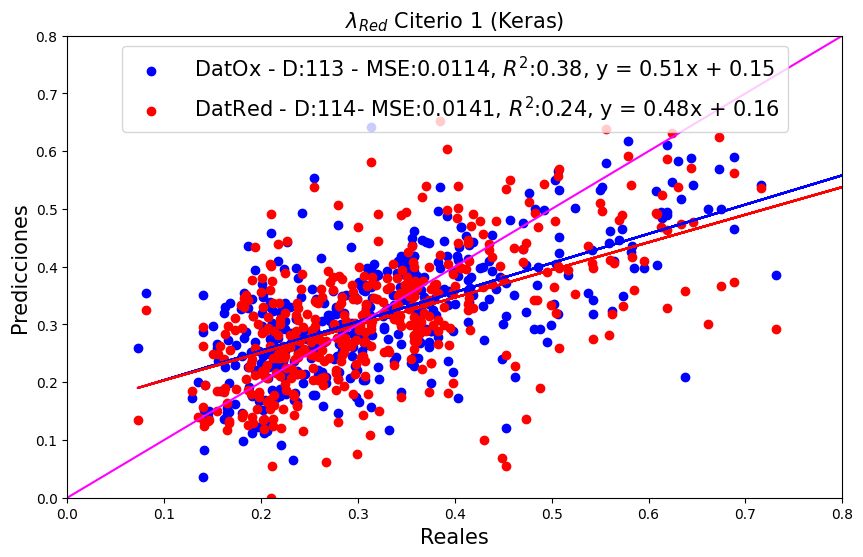

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_01_Ox
df_entrenamiento_Red = df_filtro_01_Red
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)
descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

energia_reorganizacion = 'lambda_Red'
energia_title = '$\lambda_{Red}$'

model, history, X_test, y_test = main(df_entrenamiento_Ox, energia_reorganizacion)
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, energia_reorganizacion)

plt.figure(figsize=(10, 6))
plt.ylim(0, 0.8)
plt.xlim(0, 0.8)

# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx - D:{descript_Ox} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed - D:{descript_Red}- MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 1 (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero01_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

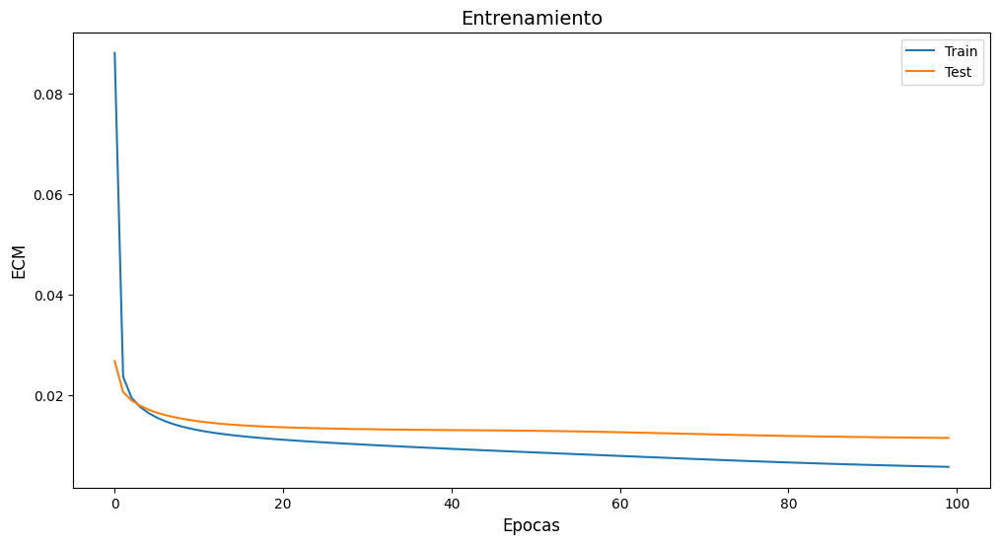

In [ ]:
plot_history(history)

## Criterio 2

###λOx

In [ ]:
energia_reorganizacion = 'lambda_Ox'
energia_title = '$\lambda_{Ox}$'

(2219, 91)
(2219, 88)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0089


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0080
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Mean Squared Error: 0.008876819796078204
R^2: 0.35307610351635943
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.008014668121600406
R^2: 0.4159078983962653


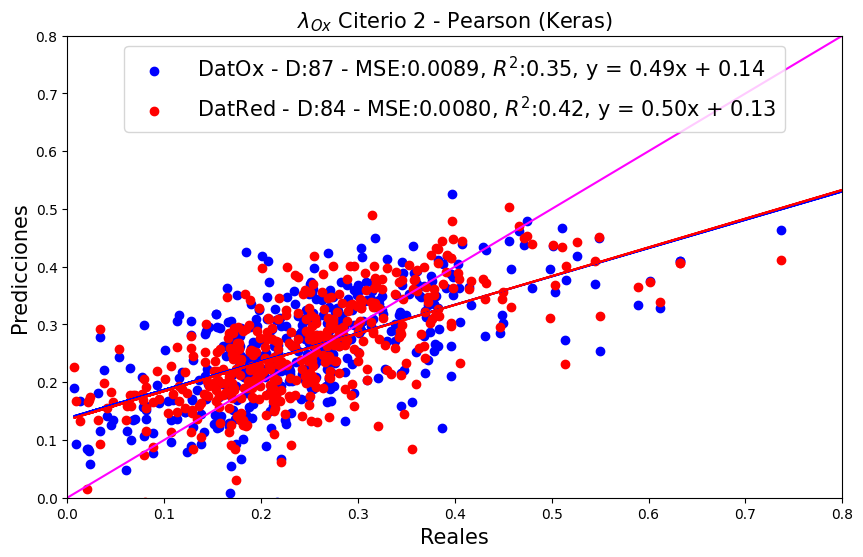

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_02_Ox_pearson
df_entrenamiento_Red = df_filtro_02_Red_pearson
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)
descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

model, history, X_test, y_test = main(df_entrenamiento_Ox, energia_reorganizacion)
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, energia_reorganizacion)

plt.figure(figsize=(10, 6))
plt.ylim(0, 0.8)
plt.xlim(0, 0.8)

# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx - D:{descript_Ox} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed - D:{descript_Red} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 2 - Pearson (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero02_Pearson_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

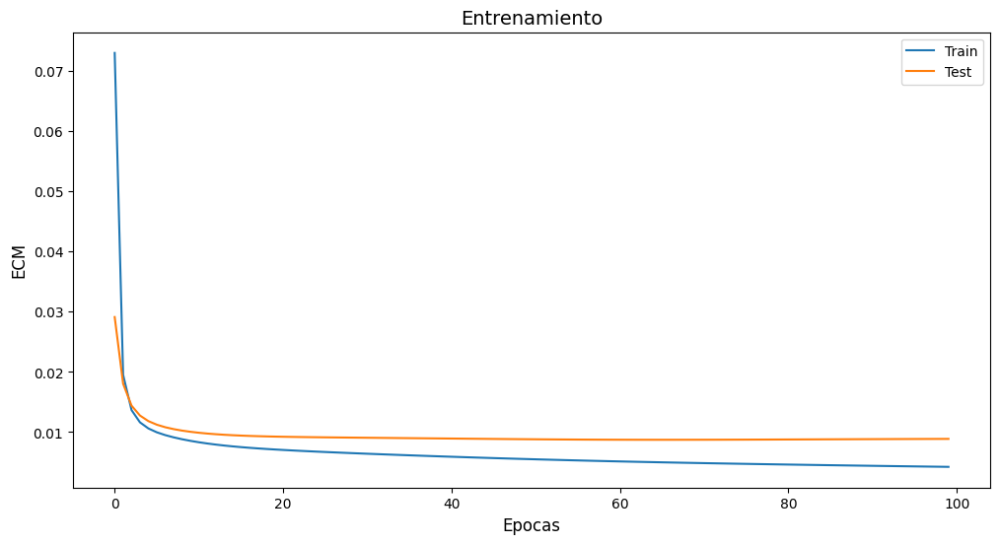

In [ ]:
plot_history(history)

(2219, 107)
(2219, 106)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0085


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0088
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.008455376861832911
R^2: 0.3837899753117424
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.00878200691778427
R^2: 0.35998586602948823


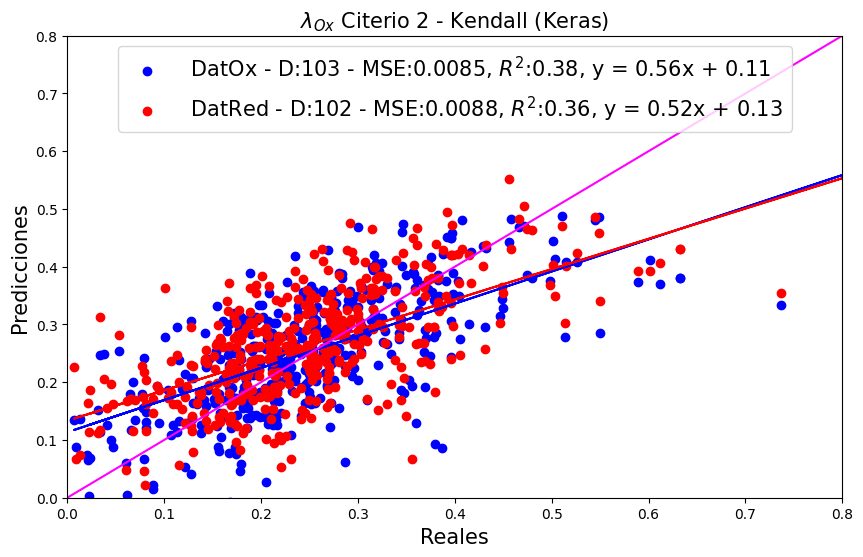

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_02_Ox_kendall
df_entrenamiento_Red = df_filtro_02_Red_kendall
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)
descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

model, history, X_test, y_test = main(df_entrenamiento_Ox, energia_reorganizacion)
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, energia_reorganizacion)

plt.figure(figsize=(10, 6))
plt.ylim(0, 0.8)
plt.xlim(0, 0.8)

# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx - D:{descript_Ox} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed - D:{descript_Red} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 2 - Kendall (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero02_Kendall_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

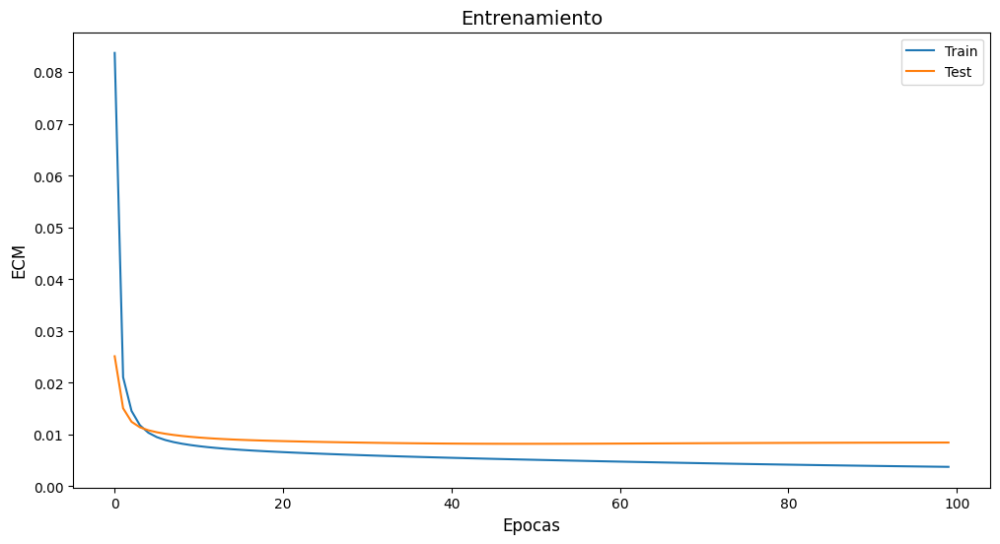

In [ ]:
plot_history(history)

(2219, 92)
(2219, 89)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0080


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0090
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.008025889611853186
R^2: 0.4150900998641953
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Mean Squared Error: 0.008978693736106111
R^2: 0.3456517457230299


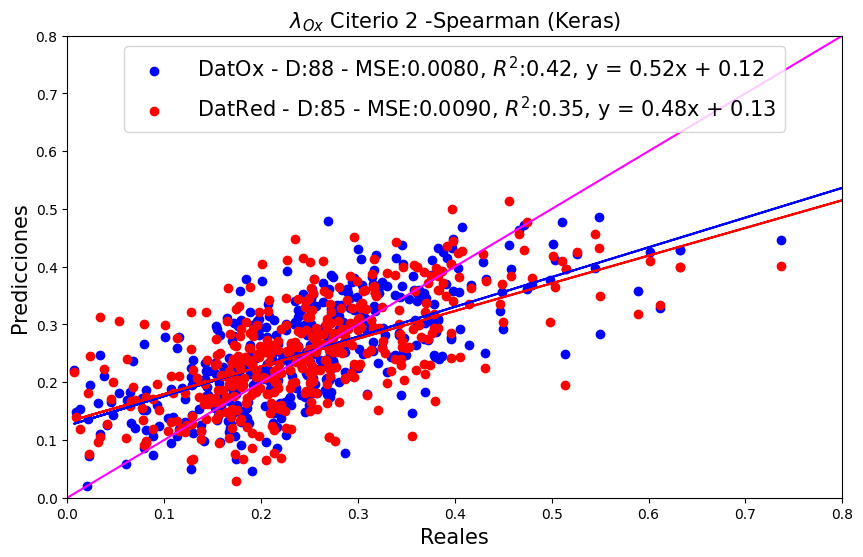

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_02_Ox_spearman
df_entrenamiento_Red = df_filtro_02_Red_spearman
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)
descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

model, history, X_test, y_test = main(df_entrenamiento_Ox, energia_reorganizacion)
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, energia_reorganizacion)

plt.figure(figsize=(10, 6))
plt.ylim(0, 0.8)
plt.xlim(0, 0.8)


# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx - D:{descript_Ox} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed - D:{descript_Red} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 2 -Spearman (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero02_Spearman_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

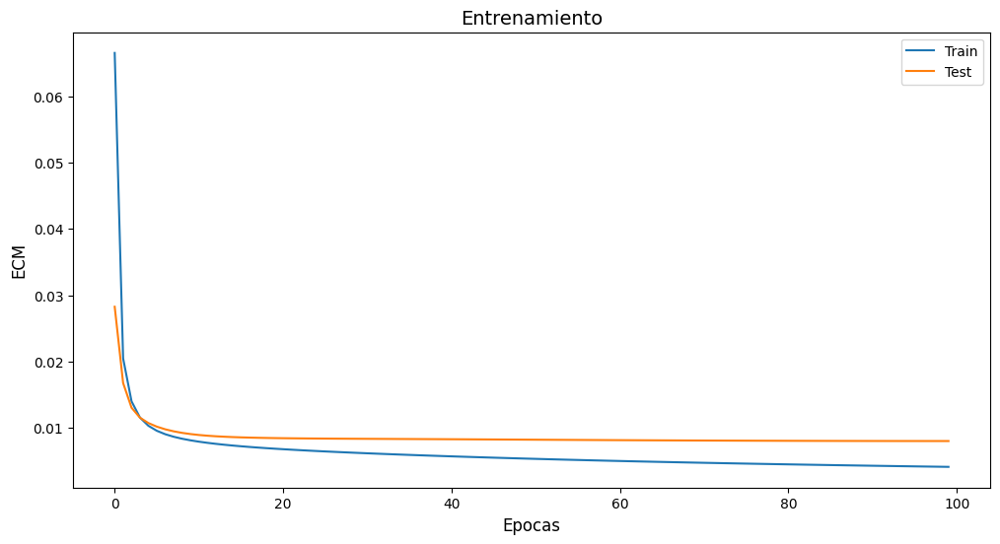

In [ ]:
plot_history(history)

### λRed

In [ ]:
energia_reorganizacion = 'lambda_Red'
energia_title = '$\lambda_{Red}$'

(2219, 91)
(2219, 88)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0118


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0125
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.011753938352555246
R^2: 0.36595417286626475
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.01253160545691557
R^2: 0.3240042691293912


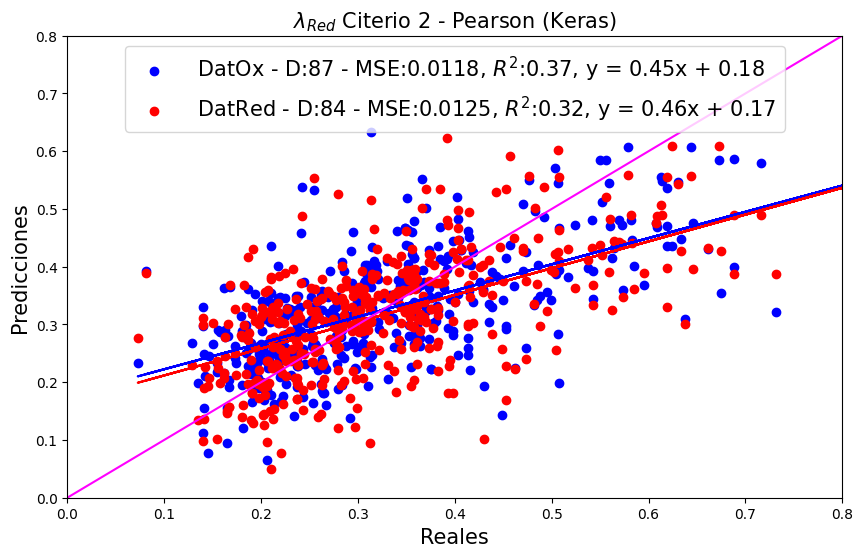

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_02_Ox_pearson
df_entrenamiento_Red = df_filtro_02_Red_pearson
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)
descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

model, history, X_test, y_test = main(df_entrenamiento_Ox, energia_reorganizacion)
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, energia_reorganizacion)

plt.figure(figsize=(10, 6))
plt.ylim(0, 0.8)
plt.xlim(0, 0.8)

# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx - D:{descript_Ox} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed - D:{descript_Red} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 2 - Pearson (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero02_Pearson_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 107)
(2219, 106)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0140


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0129
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Mean Squared Error: 0.013950439927266299
R^2: 0.24746770339831325
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Mean Squared Error: 0.01290247197854466
R^2: 0.30399851757536767


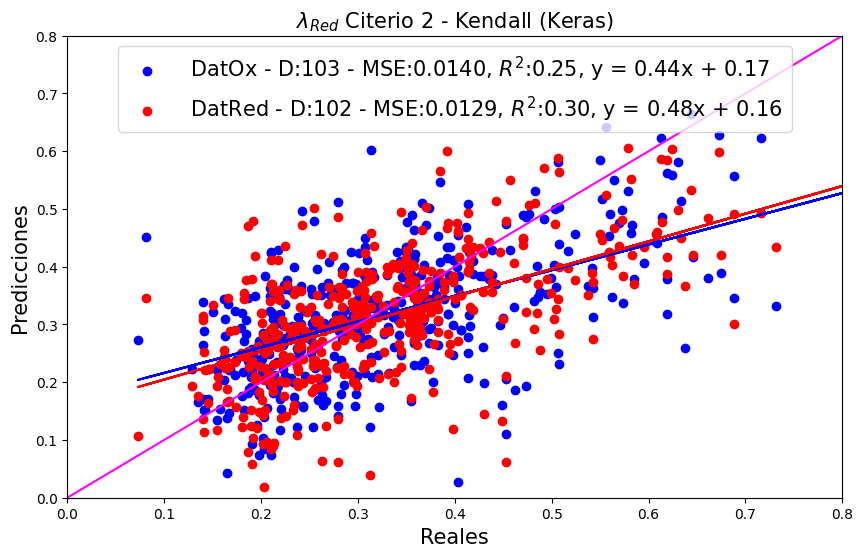

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_02_Ox_kendall
df_entrenamiento_Red = df_filtro_02_Red_kendall
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)
descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

model, history, X_test, y_test = main(df_entrenamiento_Ox, energia_reorganizacion)
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, energia_reorganizacion)

plt.figure(figsize=(10, 6))
plt.ylim(0, 0.8)
plt.xlim(0, 0.8)

# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx - D:{descript_Ox} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed - D:{descript_Red} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 2 - Kendall (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero02_Kendall_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 92)
(2219, 89)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0114


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0128
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Mean Squared Error: 0.01143839054357848
R^2: 0.3829758523699195
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Mean Squared Error: 0.012767469831664347
R^2: 0.31128097434143964


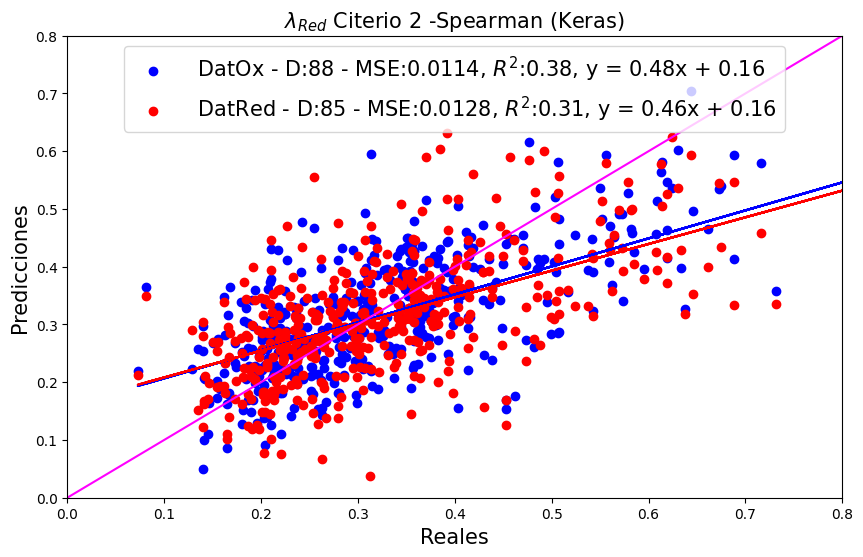

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_02_Ox_spearman
df_entrenamiento_Red = df_filtro_02_Red_spearman
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)
descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

model, history, X_test, y_test = main(df_entrenamiento_Ox, energia_reorganizacion)
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, energia_reorganizacion)

plt.figure(figsize=(10, 6))
plt.ylim(0, 0.8)
plt.xlim(0, 0.8)


# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx - D:{descript_Ox} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed - D:{descript_Red} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 2 -Spearman (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero02_Spearman_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

## Criterio 3

###λOx

(2219, 34)
(2219, 34)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0078


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0086
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.00776918722199039
R^2: 0.43379802839058845
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Mean Squared Error: 0.008604225148619051
R^2: 0.37294222624341655


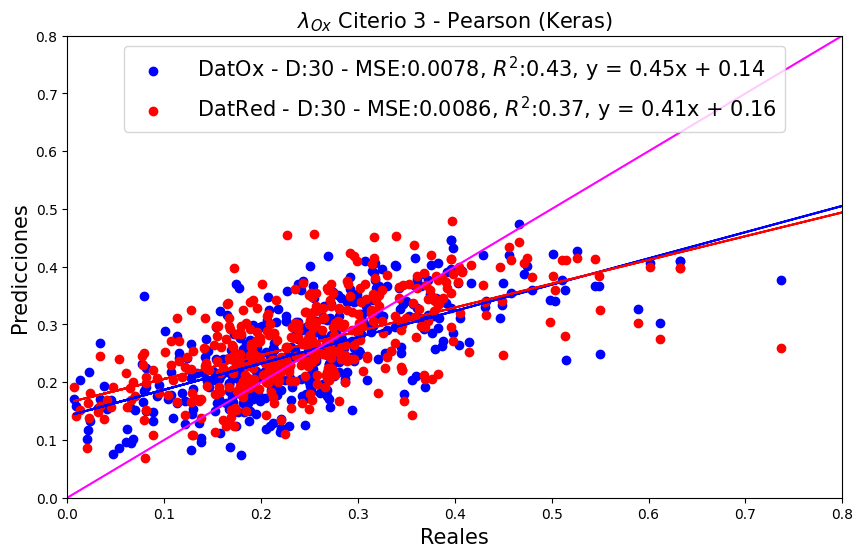

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[list(top_30_pearson_DatOx_lambda_Ox.index)]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[list(top_30_pearson_DatRed_lambda_Ox.index)]], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

energia_reorganizacion = 'lambda_Ox'
energia_title = '$\lambda_{Ox}$'

model, history, X_test, y_test = main(df_entrenamiento_Ox, energia_reorganizacion)
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, energia_reorganizacion)

plt.figure(figsize=(10, 6))
plt.ylim(0, 0.8)
plt.xlim(0, 0.8)

# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx - D:{descript_Ox} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed - D:{descript_Red} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 3 - Pearson (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_Pearson_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 34)
(2219, 34)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0084


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0086
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.008413145144336113
R^2: 0.38686773377320127
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Mean Squared Error: 0.00859610725304681
R^2: 0.3735338413438112


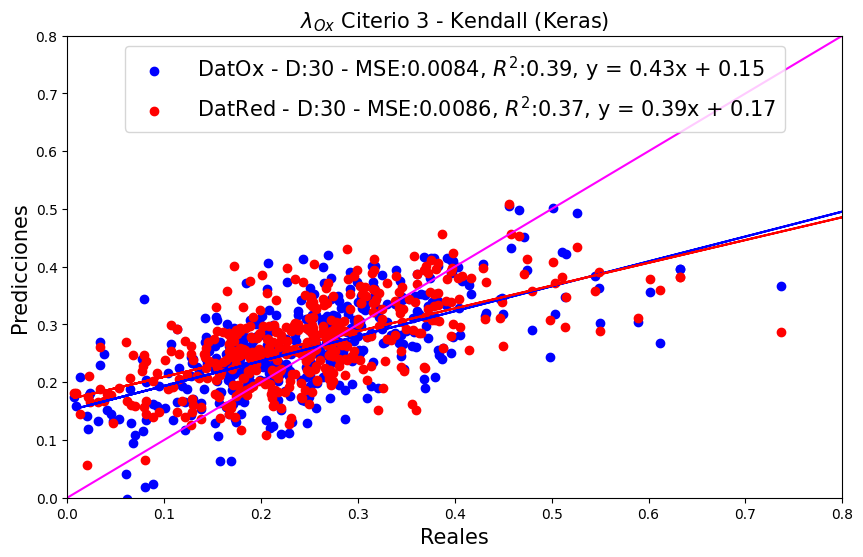

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[list(top_30_kendall_DatOx_lambda_Ox.index)]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[list(top_30_kendall_DatRed_lambda_Ox.index)]], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

eregargia_reorganizacion = 'lambda_Ox'
energia_title = '$\lambda_{Ox}$'

model, history, X_test, y_test = main(df_entrenamiento_Ox, energia_reorganizacion)
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, energia_reorganizacion)

plt.figure(figsize=(10, 6))
plt.ylim(0, 0.8)
plt.xlim(0, 0.8)

# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx - D:{descript_Ox} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed - D:{descript_Red} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 3 - Kendall (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_Kendall_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 34)
(2219, 34)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0083


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0087
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.008264811822648915
R^2: 0.3976779532717023
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.008651264704711571
R^2: 0.3695140826497302


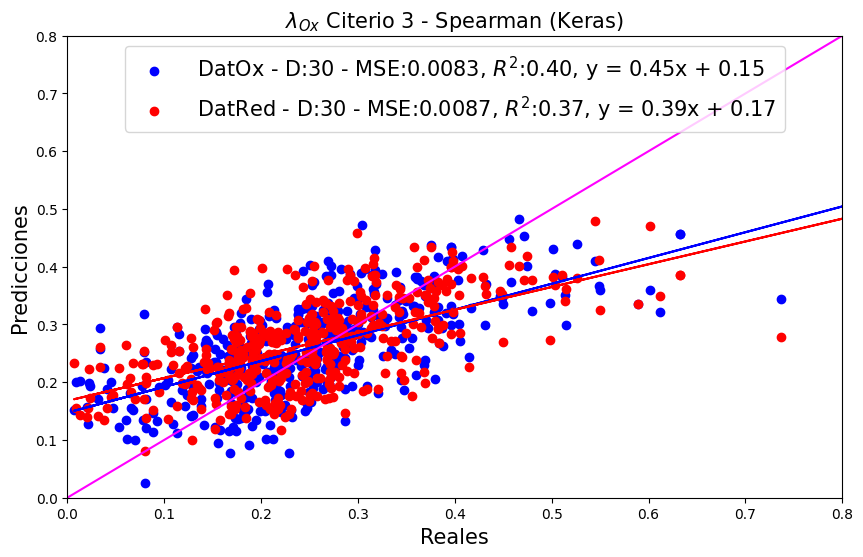

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[list(top_30_spearman_DatOx_lambda_Ox.index)]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[list(top_30_spearman_DatRed_lambda_Ox.index)]], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

energia_reorganizacion = 'lambda_Ox'
energia_title = '$\lambda_{Ox}$'

model, history, X_test, y_test = main(df_entrenamiento_Ox, energia_reorganizacion)
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, energia_reorganizacion)

plt.figure(figsize=(10, 6))
plt.ylim(0, 0.8)
plt.xlim(0, 0.8)

# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx - D:{descript_Ox} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed - D:{descript_Red} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 3 - Spearman (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_Spearman_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

###λRed

(2219, 34)
(2219, 34)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0119


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0124
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.011942258159369279
R^2: 0.3557955873695907
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Mean Squared Error: 0.012411935730937256
R^2: 0.3304596450310602


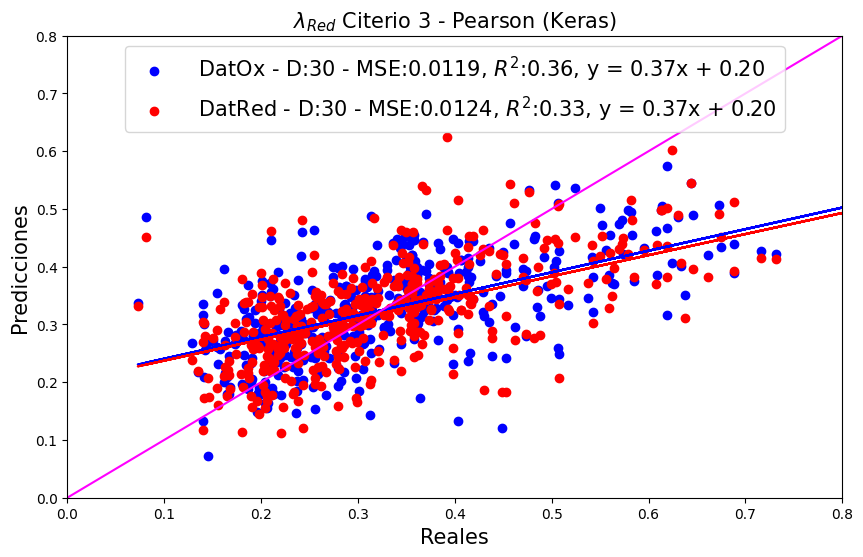

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[list(top_30_pearson_DatOx_lambda_Red.index)]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[list(top_30_pearson_DatRed_lambda_Red.index)]], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

energia_reorganizacion = 'lambda_Red'
energia_title = '$\lambda_{Red}$'


model, history, X_test, y_test = main(df_entrenamiento_Ox, energia_reorganizacion)
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, energia_reorganizacion)

plt.figure(figsize=(10, 6))
plt.ylim(0, 0.8)
plt.xlim(0, 0.8)

# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx - D:{descript_Ox} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed - D:{descript_Red} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 3 - Pearson (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_Pearson_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 34)
(2219, 34)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0118


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0118
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.011779800452723952
R^2: 0.3645590867086691
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.011795162704422801
R^2: 0.3637303966736464


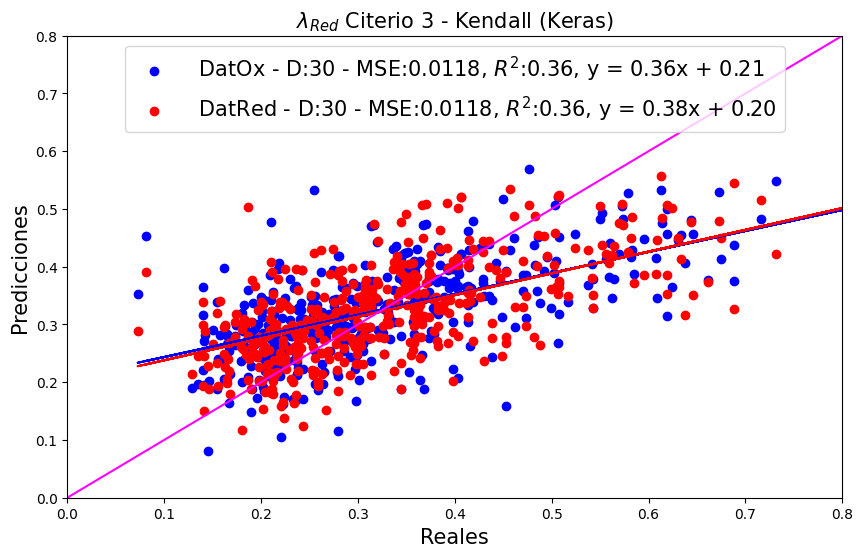

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[list(top_30_kendall_DatOx_lambda_Red.index)]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[list(top_30_kendall_DatRed_lambda_Red.index)]], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

energia_reorganizacion = 'lambda_Red'
energia_title = '$\lambda_{Red}$'

model, history, X_test, y_test = main(df_entrenamiento_Ox, energia_reorganizacion)
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, energia_reorganizacion)

plt.figure(figsize=(10, 6))
plt.ylim(0, 0.8)
plt.xlim(0, 0.8)

# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx - D:{descript_Ox} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed - D:{descript_Red} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 3 - Kendall (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_Kendall_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 34)
(2219, 34)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0126


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0123
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.012612222414741728
R^2: 0.3196555271015942
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.012318965463857552
R^2: 0.3354747649101413


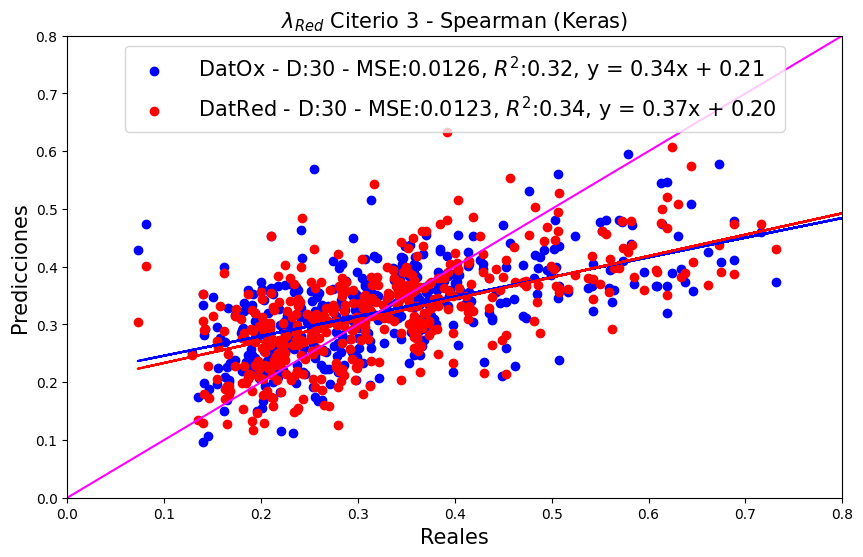

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[list(top_30_spearman_DatOx_lambda_Red.index)]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[list(top_30_spearman_DatRed_lambda_Red.index)]], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

energia_reorganizacion = 'lambda_Red'
energia_title = '$\lambda_{Red}$'


model, history, X_test, y_test = main(df_entrenamiento_Ox, energia_reorganizacion)
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, energia_reorganizacion)

plt.figure(figsize=(10, 6))
plt.ylim(0, 0.8)
plt.xlim(0, 0.8)

# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx - D:{descript_Ox} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed - D:{descript_Red} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 3 - Spearman (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_Spearman_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

#Regresión

##Criterio 0

(2219, 212)
(2219, 212)


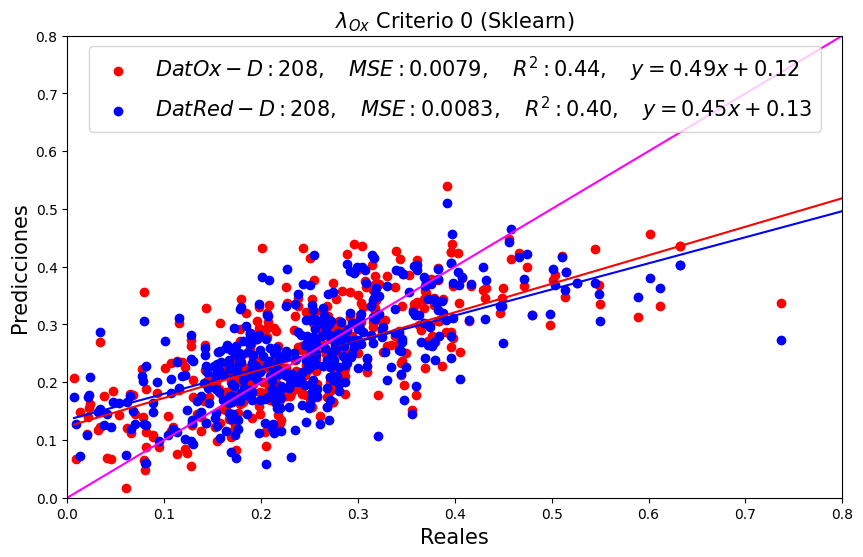

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Ox], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Red], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)
reacciones = df_entrenamiento_Ox.shape[0]

energia_reorganizacion = 'lambda_Ox'
energia_title = '$\lambda_{Ox}$'

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 0 (Sklearn)', fontsize= 15)#\n{reacciones} racciones redox
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero0_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 212)
(2219, 212)


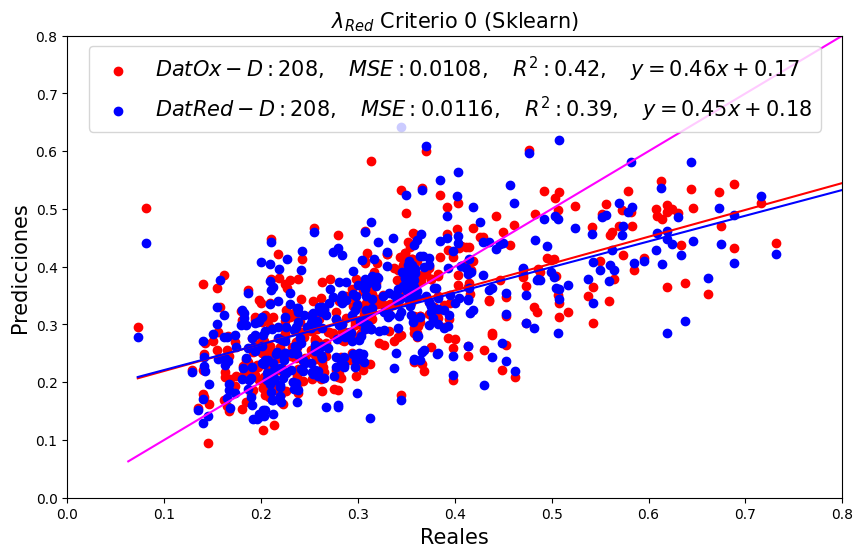

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Ox], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Red], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)
reacciones = df_entrenamiento_Ox.shape[0]

energia_reorganizacion = 'lambda_Red'
energia_title = '$\lambda_{Red}$'

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 0 (Sklearn)', fontsize= 15)#\n{reacciones} racciones redox
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero0_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

##Criterio 1: Poca variabilidad.

(2219, 117)
(2219, 118)


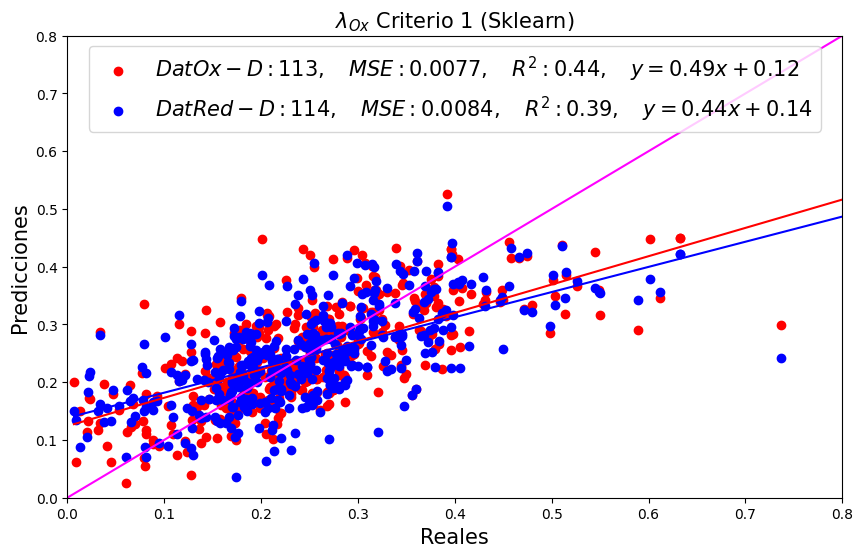

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_01_Ox
df_entrenamiento_Red = df_filtro_01_Red
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

energia_reorganizacion = 'lambda_Ox'
energia_title = '$\lambda_{Ox}$'

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 1 (Sklearn)', fontsize= 15)
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero1_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 117)
(2219, 118)


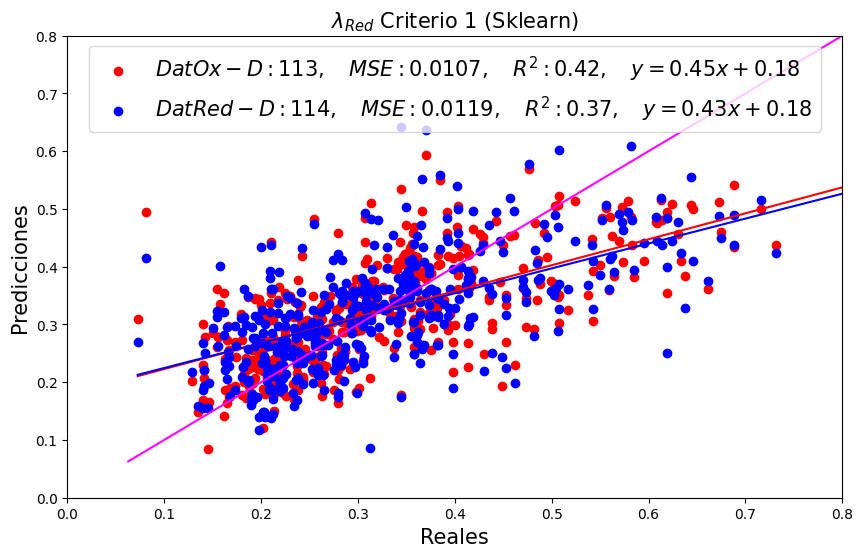

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_01_Ox
df_entrenamiento_Red = df_filtro_01_Red
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

energia_reorganizacion = 'lambda_Red'
energia_title = '$\lambda_{Red}$'

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 1 (Sklearn)', fontsize= 15)
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero1_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

## Criterio 2: Correlación: Feactures Vs Feactures

###λOx

In [ ]:
energia_reorganizacion = 'lambda_Ox'
energia_title = '$\lambda_{Ox}$'

(2219, 91)
(2219, 88)


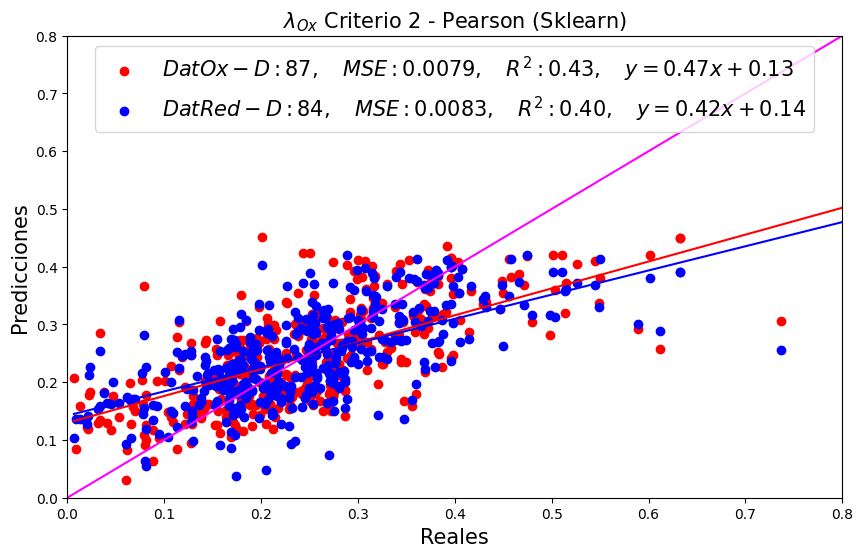

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_02_Ox_pearson
df_entrenamiento_Red = df_filtro_02_Red_pearson
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 2 - Pearson (Sklearn)', fontsize= 15)
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero02_Pearson_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 107)
(2219, 106)


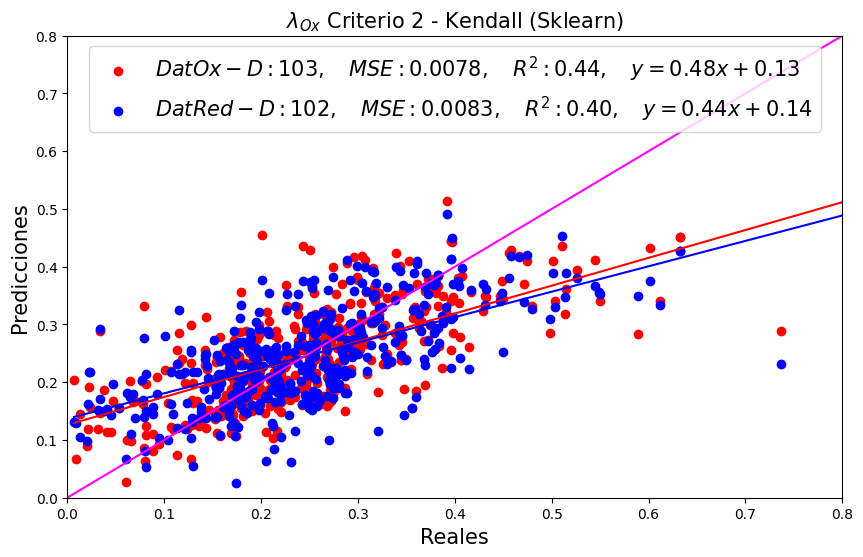

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_02_Ox_kendall
df_entrenamiento_Red = df_filtro_02_Red_kendall
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 2 - Kendall (Sklearn)', fontsize= 15)
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero02_Kendall_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 92)
(2219, 89)


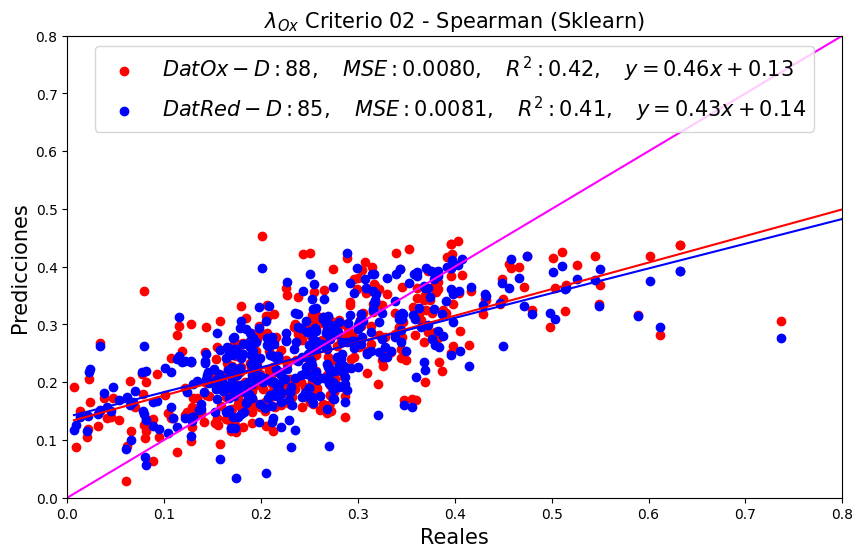

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_02_Ox_spearman
df_entrenamiento_Red = df_filtro_02_Red_spearman
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 02 - Spearman (Sklearn)', fontsize= 15)
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero02_Spearman_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

### λRed

In [ ]:
energia_reorganizacion = 'lambda_Red'
energia_title = '$\lambda_{Red}$'


(2219, 91)
(2219, 88)


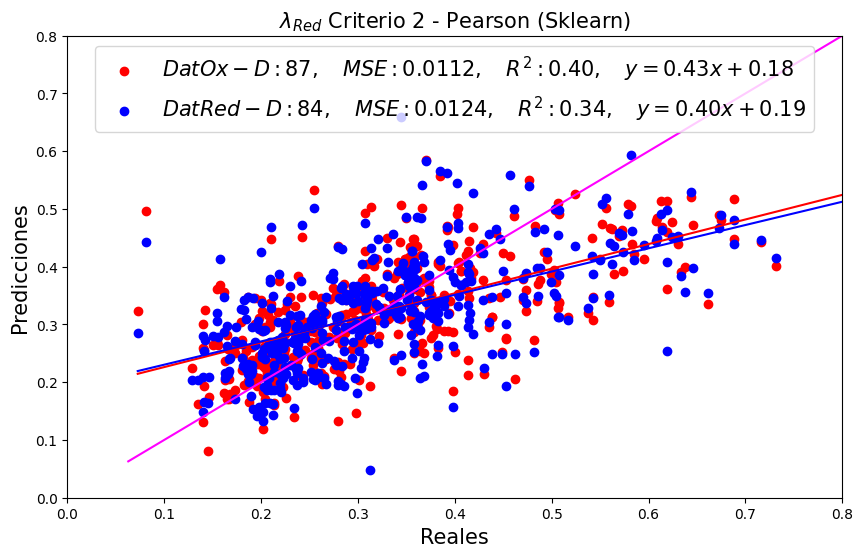

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_02_Ox_pearson
df_entrenamiento_Red = df_filtro_02_Red_pearson
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 2 - Pearson (Sklearn)', fontsize= 15)
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero02_Pearson_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 107)
(2219, 106)


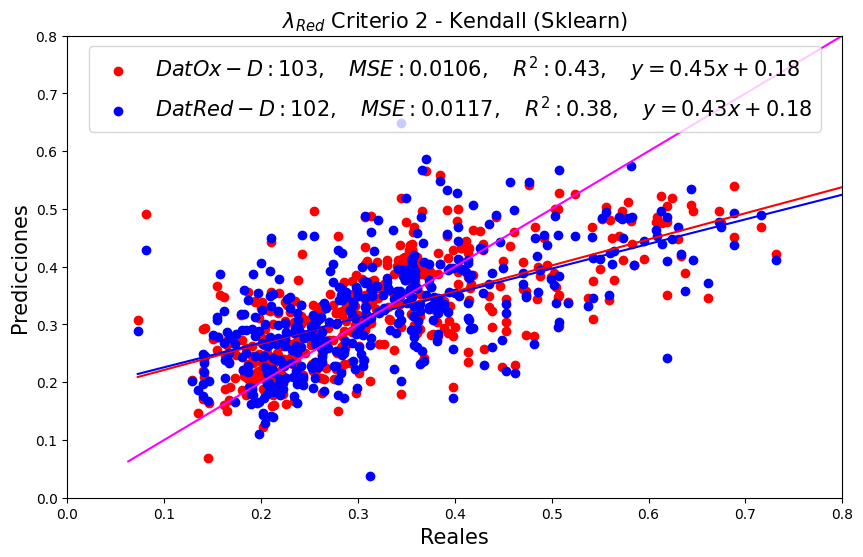

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_02_Ox_kendall
df_entrenamiento_Red = df_filtro_02_Red_kendall
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 2 - Kendall (Sklearn)', fontsize= 15)
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero02_Kendall_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 92)
(2219, 89)


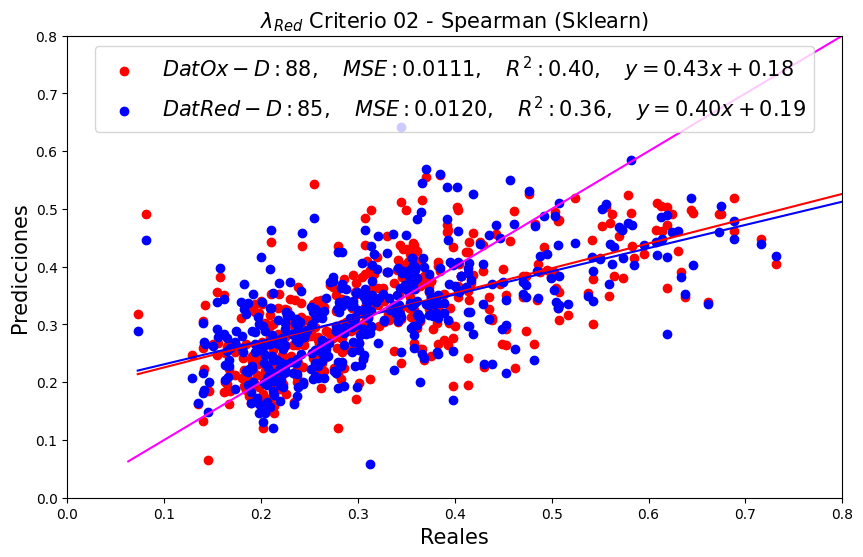

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_02_Ox_spearman
df_entrenamiento_Red = df_filtro_02_Red_spearman
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 02 - Spearman (Sklearn)', fontsize= 15)
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero02_Spearman_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

##Criterio 3 Target Vs Feactures (30 Variables)

1.   Spearman Smiles Ox y Red
2.   Pearson Smiles Ox y Red
3.   Kendall Smiles Ox y Red



###λOx

In [ ]:
energia_reorganizacion = 'lambda_Ox'
energia_title = '$\lambda_{Ox}$'

(2219, 34)
(2219, 34)


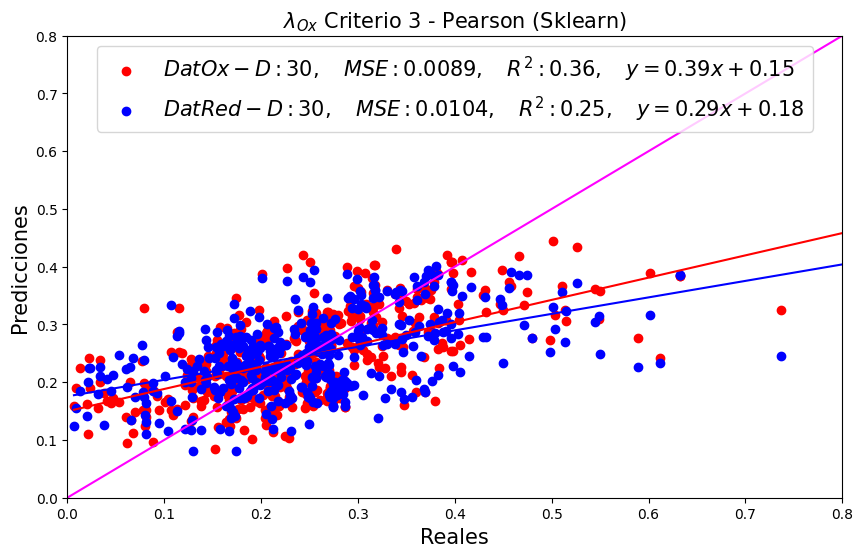

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[list(top_30_pearson_DatOx_lambda_Ox.index)]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[list(top_30_pearson_DatRed_lambda_Ox.index)]], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 3 - Pearson (Sklearn)', fontsize= 15)
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_Pearson_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 34)
(2219, 34)


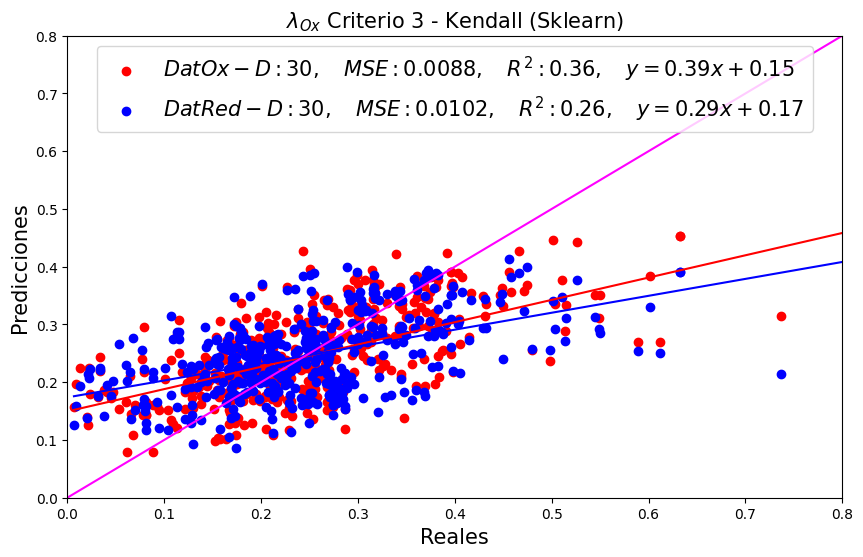

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[list(top_30_kendall_DatOx_lambda_Ox.index)]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[list(top_30_kendall_DatRed_lambda_Ox.index)]], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 3 - Kendall (Sklearn)', fontsize= 15)
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_Kendall_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 34)
(2219, 34)


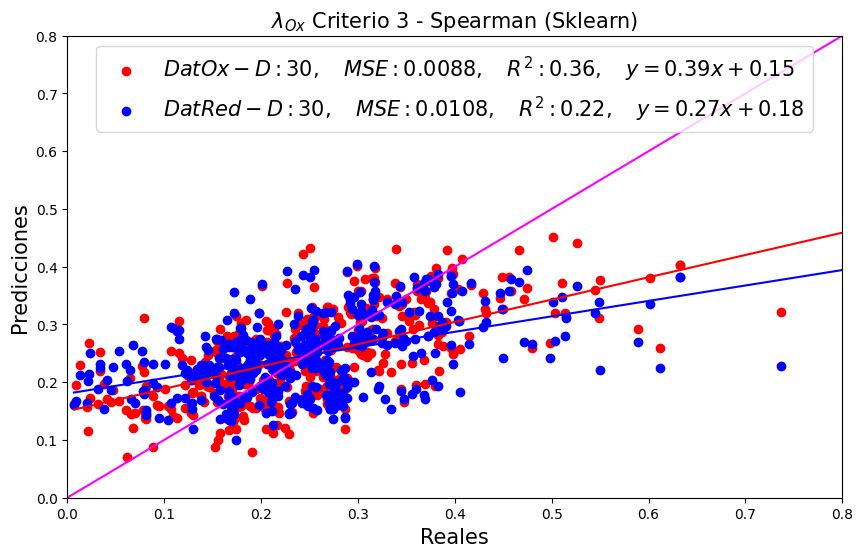

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[list(top_30_spearman_DatOx_lambda_Ox.index)]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[list(top_30_spearman_DatRed_lambda_Ox.index)]], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 3 - Spearman (Sklearn)', fontsize= 15)
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_Spearman_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

###λRed

In [ ]:
energia_reorganizacion = 'lambda_Red'
energia_title = '$\lambda_{Red}$'

(2219, 34)
(2219, 34)


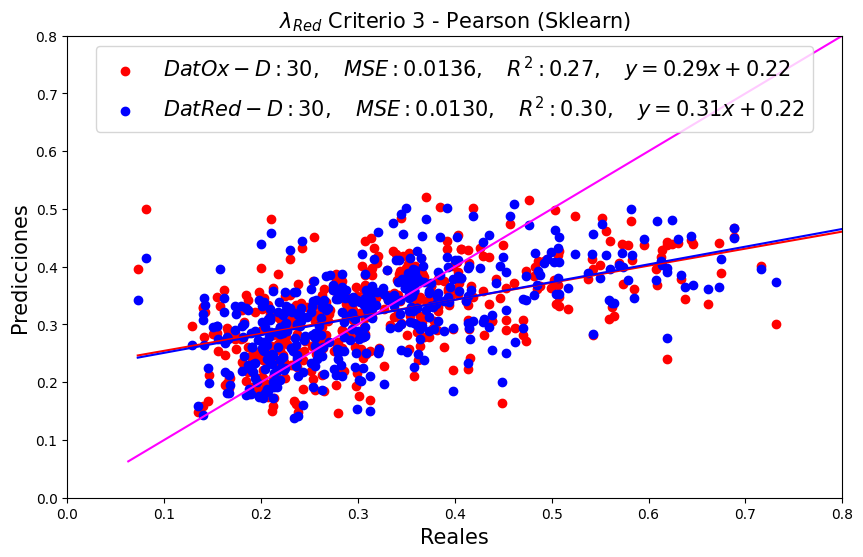

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[list(top_30_pearson_DatOx_lambda_Red.index)]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[list(top_30_pearson_DatRed_lambda_Red.index)]], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4


plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 3 - Pearson (Sklearn)', fontsize= 15)
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_Pearson_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 34)
(2219, 34)


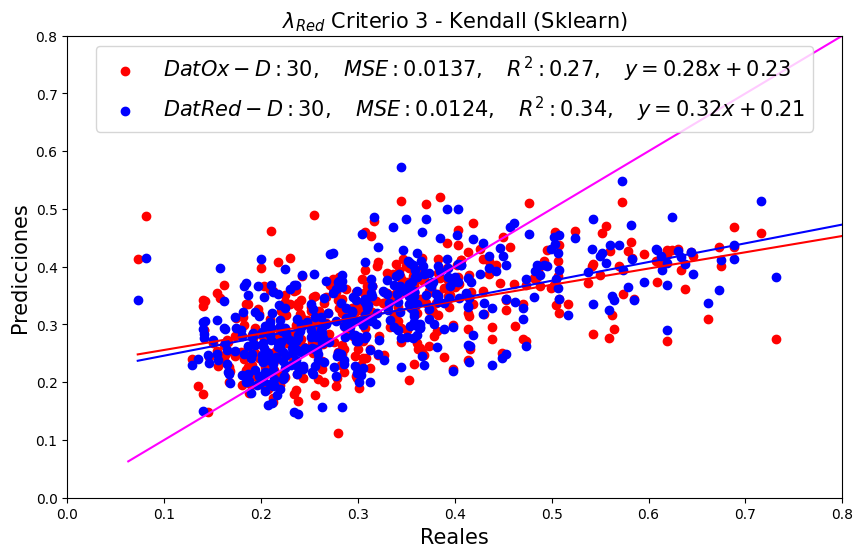

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[list(top_30_kendall_DatOx_lambda_Red.index)]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[list(top_30_kendall_DatRed_lambda_Red.index)]], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 3 - Kendall (Sklearn)', fontsize= 15)
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_Kendall_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 34)
(2219, 34)


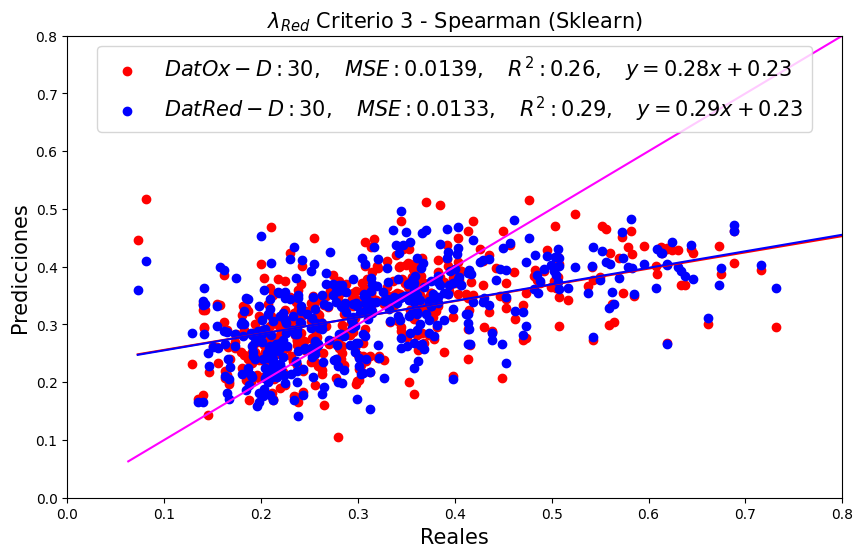

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[list(top_30_spearman_DatOx_lambda_Red.index)]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[list(top_30_spearman_DatRed_lambda_Red.index)]], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 3 - Spearman (Sklearn)', fontsize= 15)
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_Spearman_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

#XGBoost

## Criterio 0

[0]	train-rmse:0.09700	eval-rmse:0.10243
[41]	train-rmse:0.02007	eval-rmse:0.07985
[0]	train-rmse:0.09817	eval-rmse:0.10360
[41]	train-rmse:0.02269	eval-rmse:0.08094


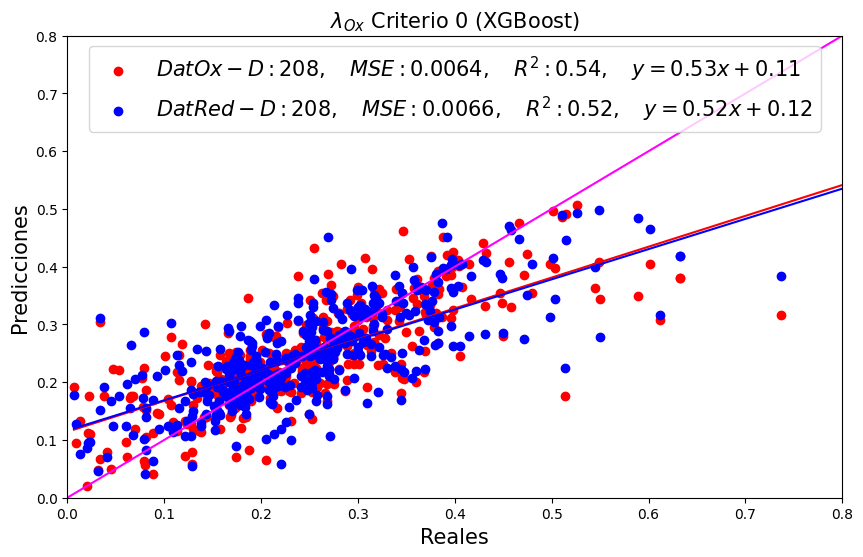

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Ox], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Red], axis=1)
reacciones = df_descriptors_Ox.shape[1]

energia_reorganizacion = 'lambda_Ox'
energia_title = '$\lambda_{Ox}$'

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 0 (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero0_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

[0]	train-rmse:0.11184	eval-rmse:0.12099
[29]	train-rmse:0.03079	eval-rmse:0.09368
[0]	train-rmse:0.11355	eval-rmse:0.12262
[45]	train-rmse:0.02489	eval-rmse:0.09426


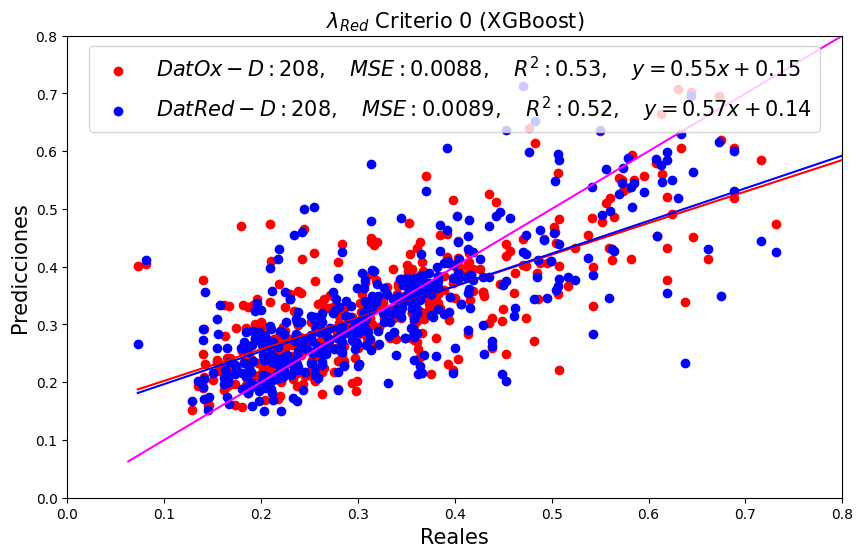

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Ox], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Red], axis=1)
reacciones = df_descriptors_Ox.shape[1]

energia_reorganizacion = 'lambda_Red'
energia_title = '$\lambda_{Red}$'

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 0 (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero0_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

## Criteio 1

[0]	train-rmse:0.09704	eval-rmse:0.10316
[38]	train-rmse:0.02021	eval-rmse:0.07868
[0]	train-rmse:0.09818	eval-rmse:0.10369
[47]	train-rmse:0.01893	eval-rmse:0.08101


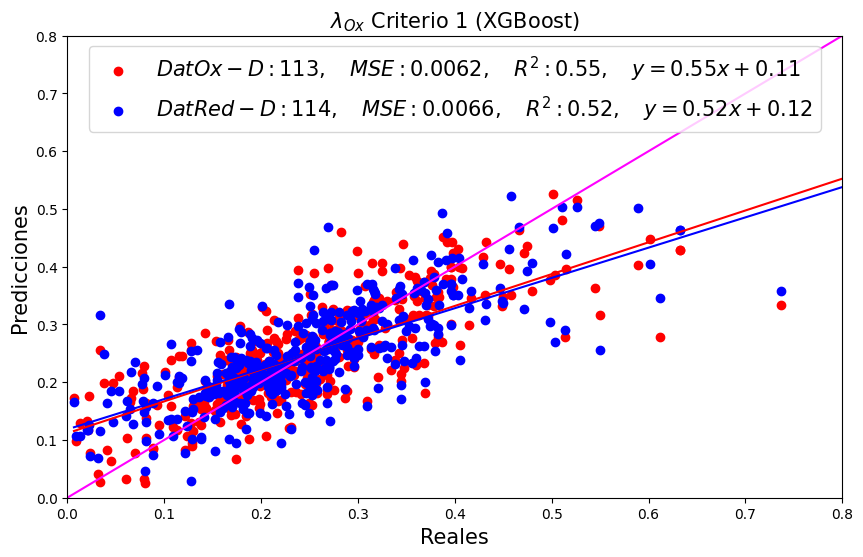

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_01_Ox
df_entrenamiento_Red = df_filtro_01_Red

energia_reorganizacion = 'lambda_Ox'
energia_title = '$\lambda_{Ox}$'

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 1 (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero01_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()


[0]	train-rmse:0.11184	eval-rmse:0.12099
[54]	train-rmse:0.01965	eval-rmse:0.09323
[0]	train-rmse:0.11338	eval-rmse:0.12101
[43]	train-rmse:0.02543	eval-rmse:0.09193


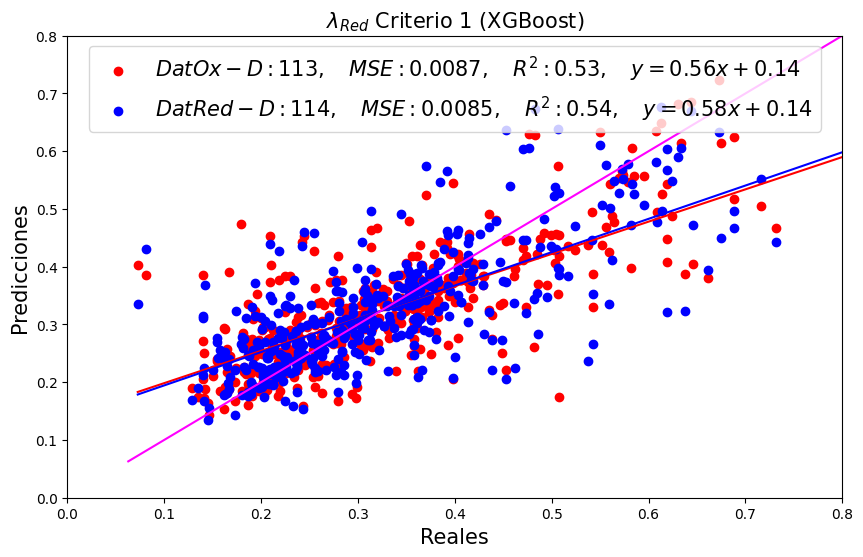

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_01_Ox
df_entrenamiento_Red = df_filtro_01_Red

energia_reorganizacion = 'lambda_Red'
energia_title = '$\lambda_{Red}$'

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 1 (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero01_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

## Criterio 2

### λOx

In [ ]:
energia_reorganizacion = 'lambda_Ox'
energia_title = '$\lambda_{Ox}$'

[0]	train-rmse:0.09706	eval-rmse:0.10344
[62]	train-rmse:0.01446	eval-rmse:0.08198
[0]	train-rmse:0.09879	eval-rmse:0.10347
[38]	train-rmse:0.02625	eval-rmse:0.08314


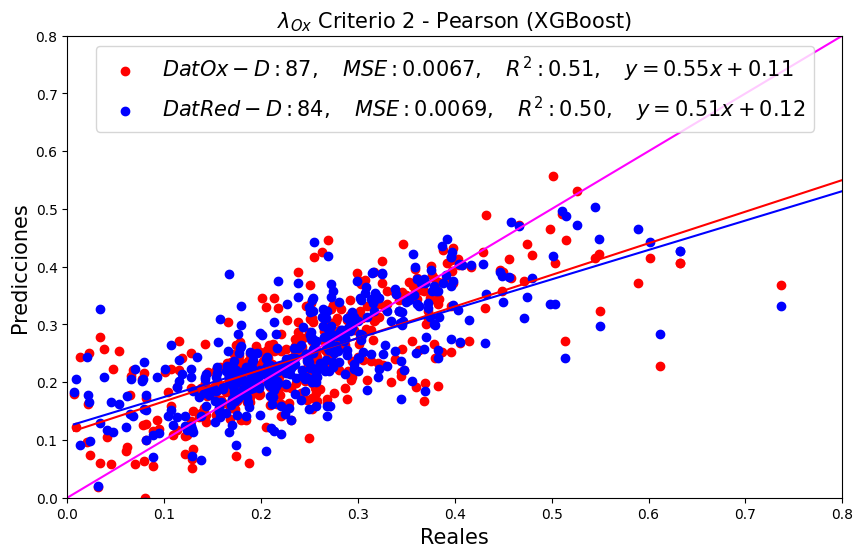

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_02_Ox_pearson
df_entrenamiento_Red = df_filtro_02_Red_pearson

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 2 - Pearson (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero02_Pearson_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

[0]	train-rmse:0.09705	eval-rmse:0.10322
[37]	train-rmse:0.02178	eval-rmse:0.08107
[0]	train-rmse:0.09818	eval-rmse:0.10363
[54]	train-rmse:0.01941	eval-rmse:0.07967


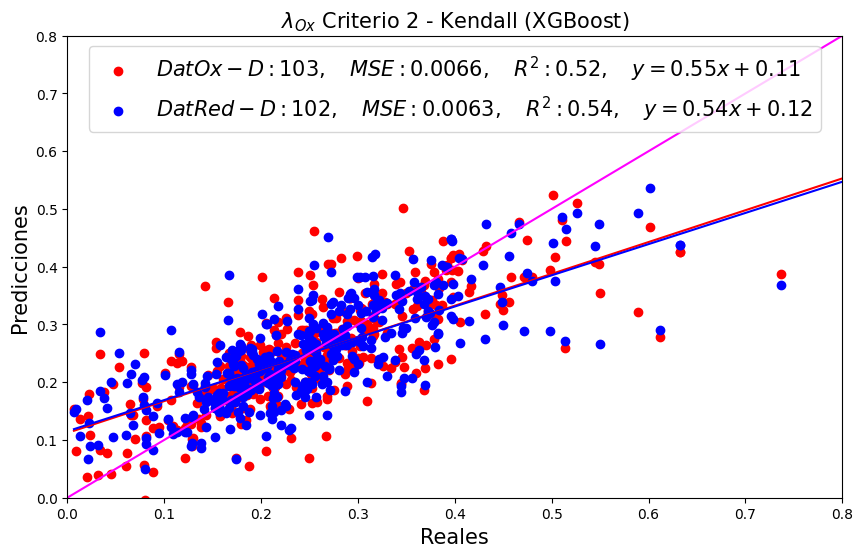

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_02_Ox_kendall
df_entrenamiento_Red = df_filtro_02_Red_kendall

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 2 - Kendall (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero02_Kendall_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

[0]	train-rmse:0.09709	eval-rmse:0.10331
[42]	train-rmse:0.01967	eval-rmse:0.08224
[0]	train-rmse:0.09876	eval-rmse:0.10397
[46]	train-rmse:0.02078	eval-rmse:0.08318


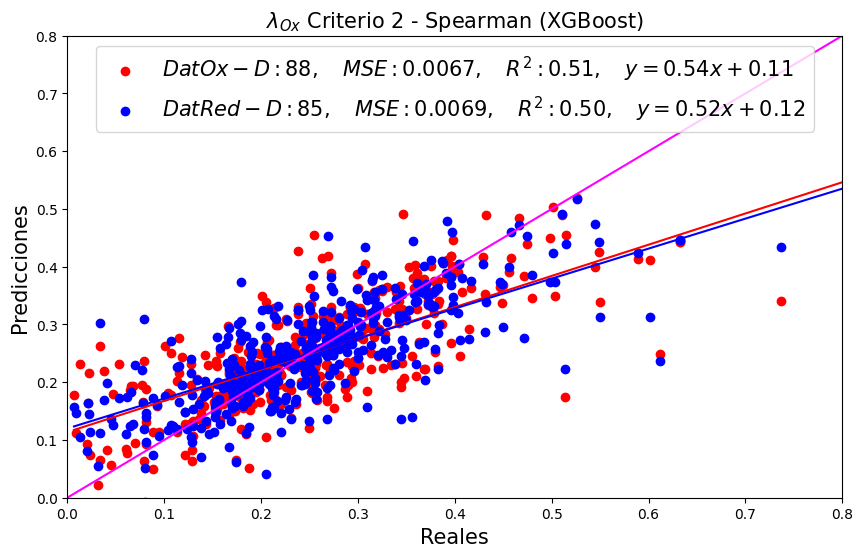

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_02_Ox_spearman
df_entrenamiento_Red = df_filtro_02_Red_spearman

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 2 - Spearman (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero02_Spearman_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

###λRed

In [ ]:
energia_reorganizacion = 'lambda_Red'
energia_title = '$\lambda_{Red}$'

[0]	train-rmse:0.11149	eval-rmse:0.12063
[30]	train-rmse:0.02929	eval-rmse:0.09177
[0]	train-rmse:0.11361	eval-rmse:0.12028
[31]	train-rmse:0.03091	eval-rmse:0.09545


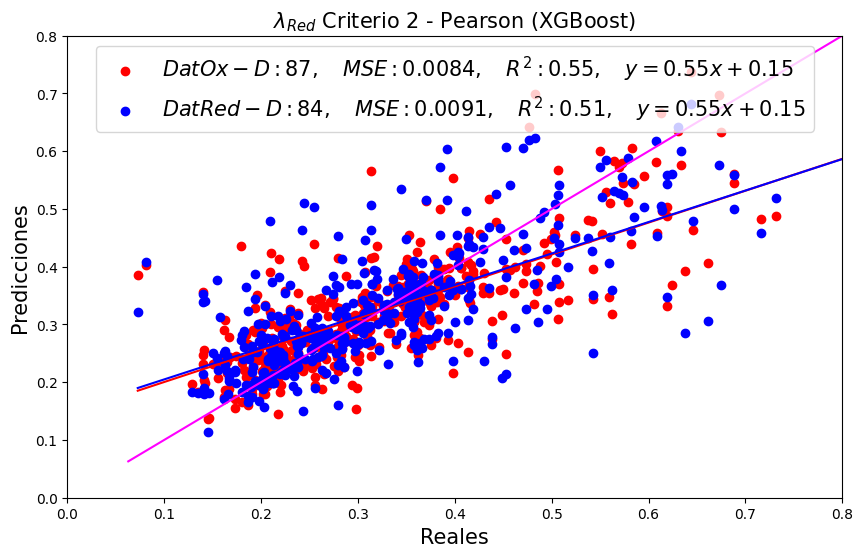

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_02_Ox_pearson
df_entrenamiento_Red = df_filtro_02_Red_pearson

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 2 - Pearson (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero02_Pearson_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

[0]	train-rmse:0.11184	eval-rmse:0.12099
[52]	train-rmse:0.01976	eval-rmse:0.09397
[0]	train-rmse:0.11339	eval-rmse:0.12100
[27]	train-rmse:0.03488	eval-rmse:0.09192


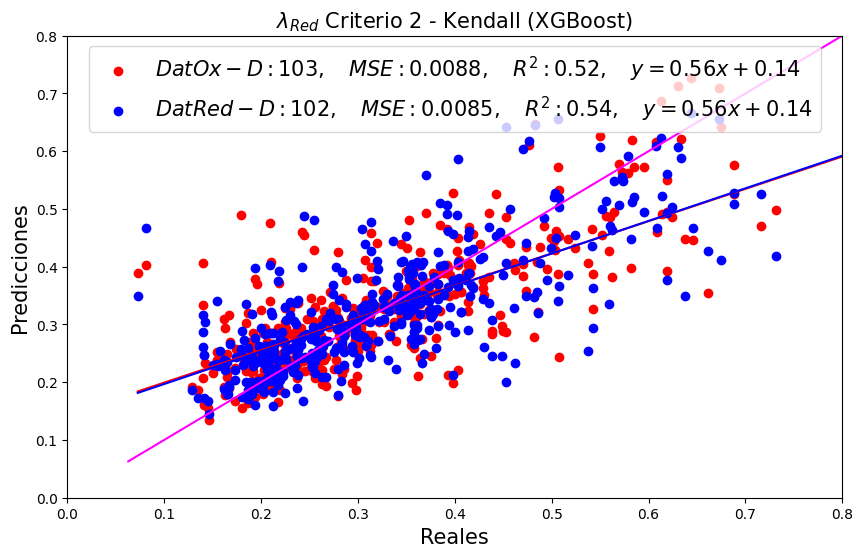

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_02_Ox_kendall
df_entrenamiento_Red = df_filtro_02_Red_kendall

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 2 - Kendall (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero02_Kendall_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

[0]	train-rmse:0.11161	eval-rmse:0.12020
[38]	train-rmse:0.02616	eval-rmse:0.09152
[0]	train-rmse:0.11361	eval-rmse:0.12060
[36]	train-rmse:0.03008	eval-rmse:0.09478


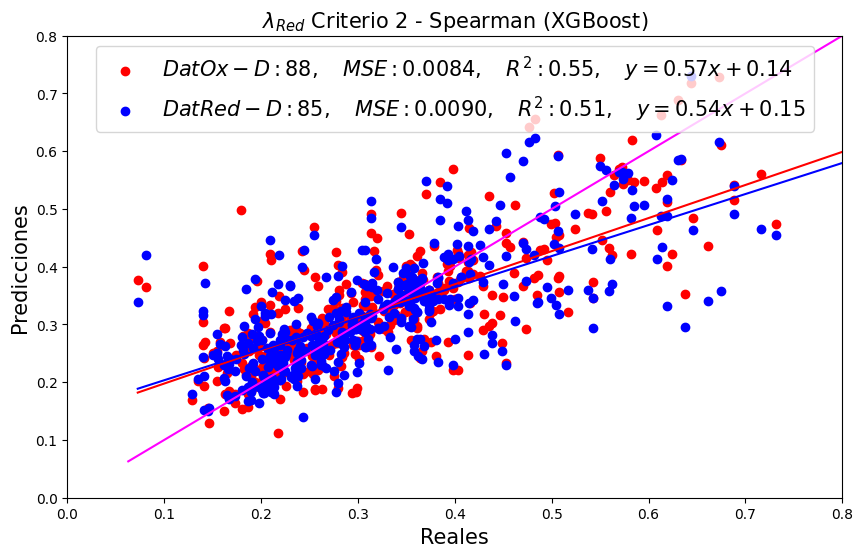

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = df_filtro_02_Ox_spearman
df_entrenamiento_Red = df_filtro_02_Red_spearman

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 2 - Spearman (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero02_Spearman_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

## Criterio 3

###λOx

In [ ]:
energia_reorganizacion = 'lambda_Ox'
energia_title = '$\lambda_{Ox}$'

(2219, 34)
(2219, 34)
[0]	train-rmse:0.09846	eval-rmse:0.10316
[50]	train-rmse:0.02298	eval-rmse:0.08011
[0]	train-rmse:0.10057	eval-rmse:0.10616
[33]	train-rmse:0.03368	eval-rmse:0.08248


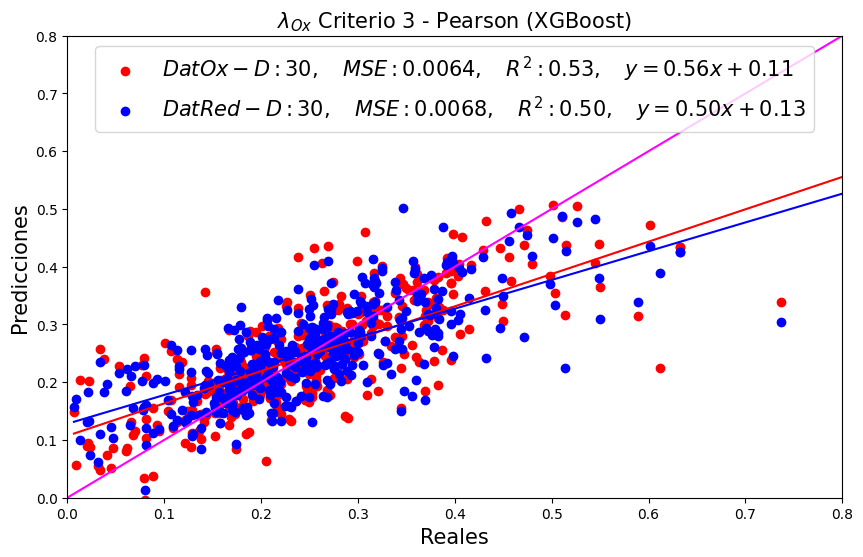

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[list(top_30_pearson_DatOx_lambda_Ox.index)]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[list(top_30_pearson_DatRed_lambda_Ox.index)]], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 3 - Pearson (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_Pearson_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 34)
(2219, 34)
[0]	train-rmse:0.09879	eval-rmse:0.10388
[61]	train-rmse:0.02015	eval-rmse:0.08024
[0]	train-rmse:0.10036	eval-rmse:0.10610
[82]	train-rmse:0.01577	eval-rmse:0.08551


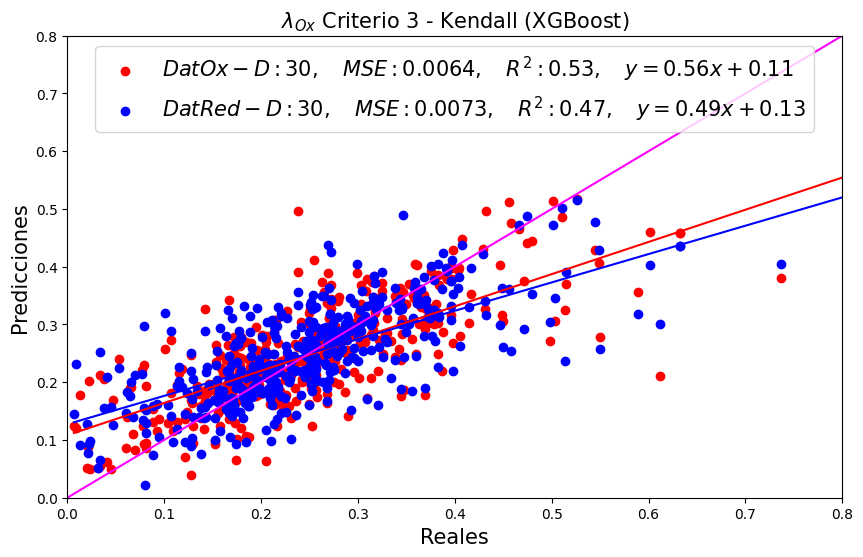

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[list(top_30_kendall_DatOx_lambda_Ox.index)]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[list(top_30_kendall_DatRed_lambda_Ox.index)]], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 3 - Kendall (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_Kendall_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 34)
(2219, 34)
[0]	train-rmse:0.09871	eval-rmse:0.10274
[29]	train-rmse:0.03603	eval-rmse:0.08237
[0]	train-rmse:0.10113	eval-rmse:0.10673
[51]	train-rmse:0.02405	eval-rmse:0.08606


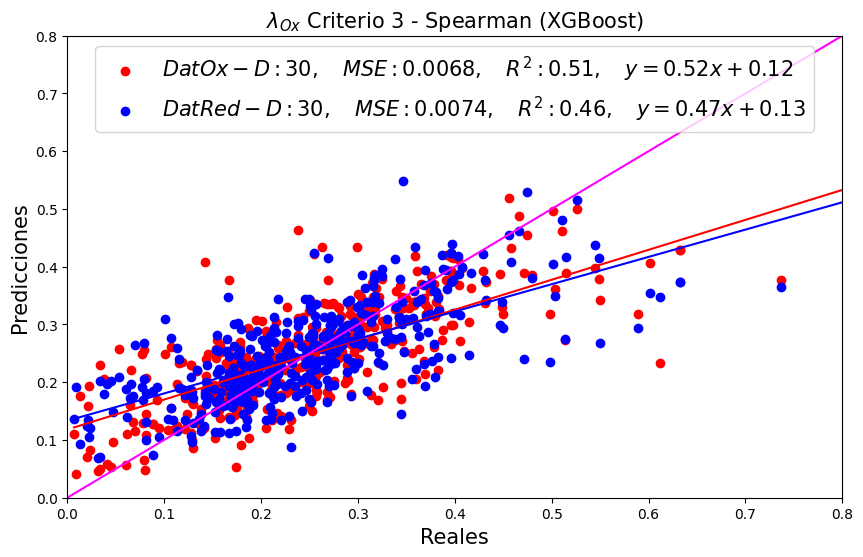

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[list(top_30_spearman_DatOx_lambda_Ox.index)]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[list(top_30_spearman_DatRed_lambda_Ox.index)]], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 3 - Spearman (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_Spearman_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

###λRed


In [ ]:
energia_reorganizacion = 'lambda_Red'
energia_title = '$\lambda_{Red}$'

(2219, 34)
(2219, 34)
[0]	train-rmse:0.11350	eval-rmse:0.12200
[56]	train-rmse:0.02178	eval-rmse:0.09229
[0]	train-rmse:0.11379	eval-rmse:0.12238
[37]	train-rmse:0.03102	eval-rmse:0.09383


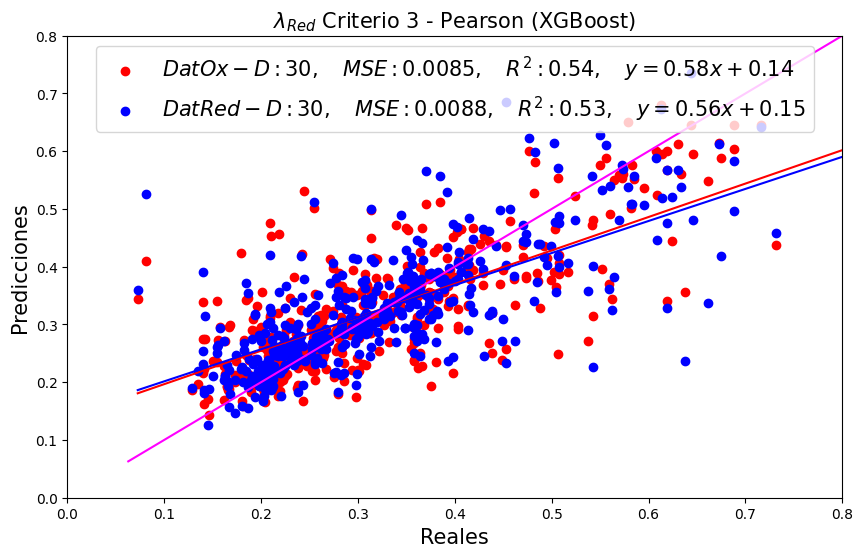

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[list(top_30_pearson_DatOx_lambda_Red.index)]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[list(top_30_pearson_DatRed_lambda_Red.index)]], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 3 - Pearson (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_Pearson_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 34)
(2219, 34)
[0]	train-rmse:0.11333	eval-rmse:0.12054
[71]	train-rmse:0.01557	eval-rmse:0.08912
[0]	train-rmse:0.11432	eval-rmse:0.12210
[45]	train-rmse:0.02606	eval-rmse:0.09228


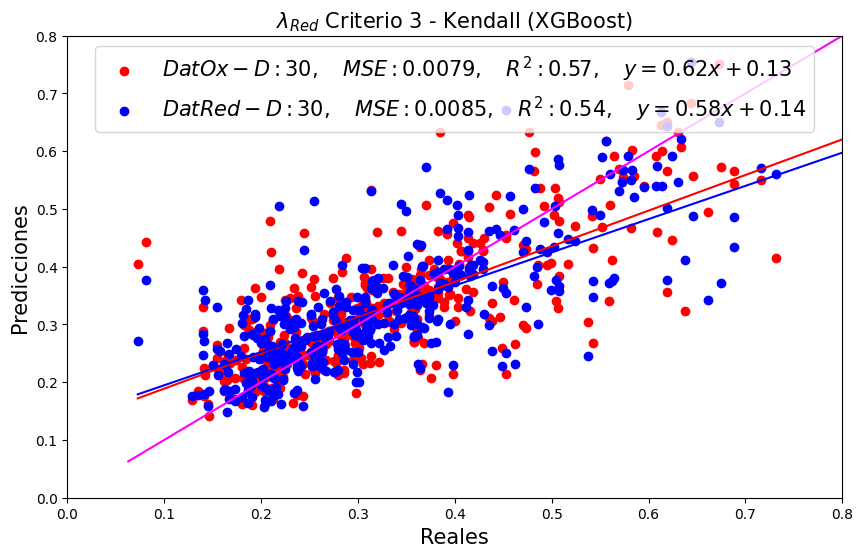

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[list(top_30_kendall_DatOx_lambda_Red.index)]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[list(top_30_kendall_DatRed_lambda_Red.index)]], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 3 - Kendall (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_Kendall_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 34)
(2219, 34)
[0]	train-rmse:0.11191	eval-rmse:0.12224
[36]	train-rmse:0.03204	eval-rmse:0.09131
[0]	train-rmse:0.11336	eval-rmse:0.12350
[37]	train-rmse:0.03161	eval-rmse:0.09296


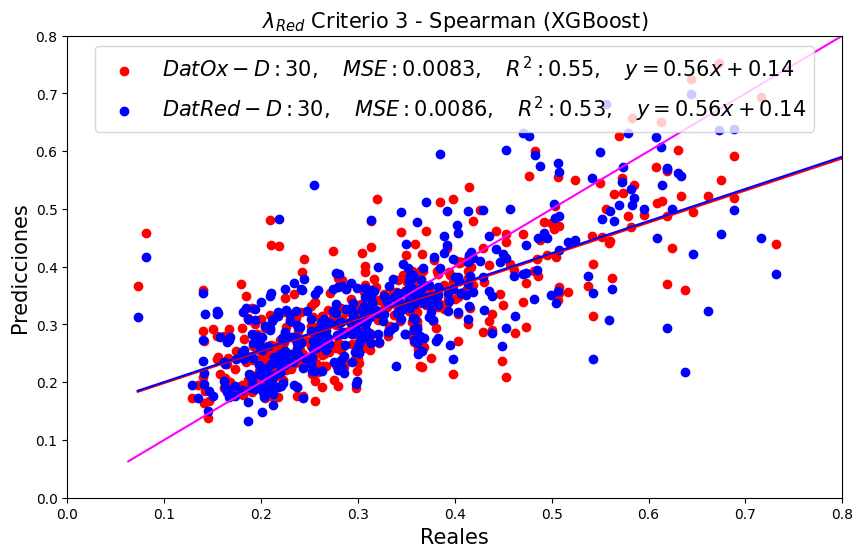

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[list(top_30_spearman_DatOx_lambda_Red.index)]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[list(top_30_spearman_DatRed_lambda_Red.index)]], axis=1)
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)

descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 3 - Spearman (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_Spearman_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

# Distancia de Correlación


## Variables

In [ ]:
import scipy
from sklearn.feature_selection import mutual_info_regression
from scipy.stats import spearmanr

In [ ]:
def distance_corr(v1:pd.Series, v2: pd.Series)-> float:
  dist_corr= abs(1 + scipy.spatial.distance.correlation(v1,v2))
  return dist_corr
def mutual_inf(v1:pd.Series, v2: pd.Series)-> float:
  v1 = np.array(v1)
  v2 = np.array(v2)
  inf_mut = mutual_info_regression(v1.reshape(-1,1),v2)
  return inf_mut

def corr_kendall(v1:pd.Series, v2: pd.Series)-> tuple[float]:
  tau, p_value =scipy.stats.kendalltau(v1,v2)
  return tau, p_value

In [ ]:
import numpy as np
import math

def _validate_vector(u):
    """Validate that the input is a 1-D array."""
    u = np.asarray(u)
    if u.ndim != 1:
        raise ValueError("Input must be a 1-D array.")
    return u

def _validate_weights(w):
    """Validate that the weights sum to 1."""
    w = np.asarray(w)
    if np.abs(w.sum() - 1.0) > 1e-10:
        raise ValueError("Weights must sum to 1.")
    return w

def distance_corr(u, v, w=None, centered=True):
    """
    Compute the correlation distance between two 1-D arrays.

    The correlation distance between `u` and `v`, is
    defined as

    .. math::

        1 - \\frac{(u - \\bar{u}) \\cdot (v - \\bar{v})}
                  {{\\|(u - \\bar{u})\\|}_2 {\\|(v - \\bar{v})\\|}_2}

    where :math:`\\bar{u}` is the mean of the elements of `u`
    and :math:`x \\cdot y` is the dot product of :math:`x` and :math:`y`.

    Parameters
    ----------
    u : (N,) array_like
        Input array.
    v : (N,) array_like
        Input array.
    w : (N,) array_like, optional
        The weights for each value in `u` and `v`. Default is None,
        which gives each value a weight of 1.0
    centered : bool, optional
        If True, `u` and `v` will be centered. Default is True.

    Returns
    -------
    correlation : double
        The correlation distance between 1-D array `u` and `v`.
    """
    u = _validate_vector(u)
    v = _validate_vector(v)
    if w is not None:
        w = _validate_weights(w)
        w = w / w.sum()
    if centered:
        if w is not None:
            umu = np.dot(u, w)
            vmu = np.dot(v, w)
        else:
            umu = np.mean(u)
            vmu = np.mean(v)
        u = u - umu
        v = v - vmu
    if w is not None:
        vw = v * w
        uw = u * w
    else:
        vw, uw = v, u
    uv = np.dot(u, vw)
    uu = np.dot(u, uw)
    vv = np.dot(v, vw)
    dist = uv / math.sqrt(uu * vv)
    # Return absolute value to avoid small negative value due to rounding
    return abs(dist)


In [ ]:
matrix_DC_DatOx = df_filtro_01_Ox.apply(lambda col1: df_filtro_01_Ox.apply(lambda col2: distance_corr(col1, col2)))[['lambda_Ox', 'lambda_Red']].iloc[4:]
matrix_DC_DatRed = df_filtro_01_Red.apply(lambda col1: df_filtro_01_Red.apply(lambda col2: distance_corr(col1, col2)))[['lambda_Ox', 'lambda_Red']]


In [ ]:
# Seleccionar los valores mayores a 0.1 a partir de la fila 4
variables_DC_DatOx_lambda_Red = matrix_DC_DatOx['lambda_Red'].iloc[4:][matrix_DC_DatOx['lambda_Red'].iloc[4:] > 0.1].index
variables_DC_DatOx_lambda_Ox = matrix_DC_DatOx['lambda_Ox'].iloc[4:][matrix_DC_DatOx['lambda_Ox'].iloc[4:] > 0.1].index

variables_DC_DatRed_lambda_Red = matrix_DC_DatRed['lambda_Red'].iloc[4:][matrix_DC_DatRed['lambda_Red'].iloc[4:] > 0.1].index
variables_DC_DatRed_lambda_Ox = matrix_DC_DatRed['lambda_Ox'].iloc[4:][matrix_DC_DatRed['lambda_Ox'].iloc[4:] > 0.1].index


print(f'DC: DatOx-lambda_Red ({len(variables_DC_DatOx_lambda_Red)})\n', variables_DC_DatOx_lambda_Red)
print(f'\nDC: DatOx-lambda_Ox ({len(variables_DC_DatOx_lambda_Ox)})\n', variables_DC_DatOx_lambda_Ox)
print(f'\nDC: DatRed-lambda_Red ({len(variables_DC_DatRed_lambda_Red)})\n', variables_DC_DatRed_lambda_Red)
print(f'\nDC: DatRed-lambda_Ox ({len(variables_DC_DatRed_lambda_Ox)})\n',variables_DC_DatRed_lambda_Ox)

DC: DatOx-lambda_Red (50)
 Index(['qed', 'MolWt', 'HeavyAtomMolWt', 'ExactMolWt', 'NumValenceElectrons',
       'BCUT2D_MWLOW', 'BCUT2D_CHGHI', 'BCUT2D_CHGLO', 'BCUT2D_LOGPHI',
       'BCUT2D_LOGPLOW', 'BCUT2D_MRLOW', 'BalabanJ', 'Chi0', 'Chi0n', 'Chi0v',
       'Chi1', 'Chi1n', 'Chi1v', 'Chi2n', 'Chi2v', 'Chi3n', 'Chi3v', 'Chi4n',
       'Chi4v', 'Kappa1', 'Kappa2', 'Kappa3', 'LabuteASA', 'PEOE_VSA1',
       'PEOE_VSA3', 'PEOE_VSA9', 'SMR_VSA3', 'SMR_VSA6', 'SMR_VSA9',
       'SlogP_VSA2', 'SlogP_VSA8', 'EState_VSA5', 'EState_VSA9', 'VSA_EState2',
       'VSA_EState3', 'VSA_EState4', 'VSA_EState6', 'VSA_EState9',
       'FractionCSP3', 'HeavyAtomCount', 'NHOHCount', 'NumAromaticRings',
       'MolMR', 'fr_NH0', 'fr_allylic_oxid'],
      dtype='object')

DC: DatOx-lambda_Ox (41)
 Index(['qed', 'MinPartialCharge', 'FpDensityMorgan1', 'FpDensityMorgan2',
       'FpDensityMorgan3', 'BCUT2D_MWLOW', 'BCUT2D_MRLOW', 'BalabanJ', 'Chi0v',
       'Chi4n', 'Chi4v', 'PEOE_VSA1', 'PEOE_VSA10', 'PE

In [ ]:
# Calcular la prueba KMO
kmo_all, kmo_DatOx_lambda_Ox = calculate_kmo( df_filtro_01_Ox[variables_DC_DatOx_lambda_Ox.to_list()])
kmo_all, kmo_DatOx_lambda_Red = calculate_kmo( df_filtro_01_Ox[variables_DC_DatOx_lambda_Red.to_list()])

kmo_all, kmo_DatRed_lambda_Ox = calculate_kmo( df_filtro_01_Red[variables_DC_DatRed_lambda_Ox.to_list()])
kmo_all, kmo_DatRed_lambda_Red = calculate_kmo( df_filtro_01_Red[variables_DC_DatRed_lambda_Red.to_list()])

print(f"kmo DatOx lamda_Ox: {kmo_DatOx_lambda_Ox:.2f}")
print(f"kmo_DatOx lambda_Red: {kmo_DatOx_lambda_Red:.2f}")
print(f"kmo_DatRed lambda_Ox: {kmo_DatRed_lambda_Ox:.2f}")
print(f"kmo_DatRed lambda_Red: {kmo_DatRed_lambda_Red:.2f}")

kmo DatOx lamda_Ox: 0.64
kmo_DatOx lambda_Red: 0.81
kmo_DatRed lambda_Ox: 0.70
kmo_DatRed lambda_Red: 0.79


/usr/local/lib/python3.10/dist-packages/factor_analyzer/utils.py:244: UserWarning: The inverse of the variance-covariance matrix was calculated using the Moore-Penrose generalized matrix inversion, due to its determinant being at or very close to zero.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/factor_analyzer/utils.py:244: UserWarning: The inverse of the variance-covariance matrix was calculated using the Moore-Penrose generalized matrix inversion, due to its determinant being at or very close to zero.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/factor_analyzer/utils.py:244: UserWarning: The inverse of the variance-covariance matrix was calculated using the Moore-Penrose generalized matrix inversion, due to its determinant being at or very close to zero.
  warnings.warn(


## Criterio 3

###λOx

In [ ]:
energia_reorganizacion = 'lambda_Ox'
energia_title = '$\lambda_{Ox}$'

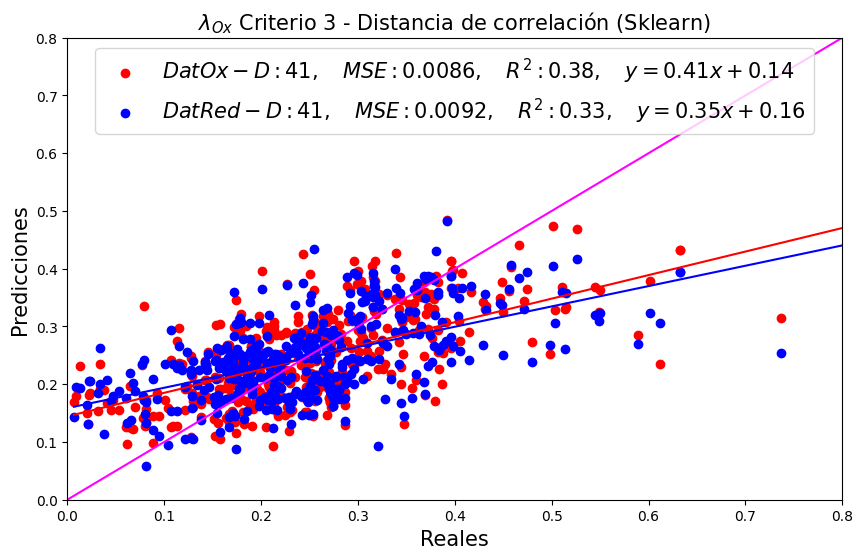

In [ ]:
df_entrenamiento_Ox = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[variables_DC_DatOx_lambda_Ox.to_list()]], axis=1)
df_entrenamiento_Red =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[variables_DC_DatRed_lambda_Ox.to_list()]], axis=1)

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 3 - Distancia de correlación (Sklearn)', fontsize= 15)
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_DC_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

[0]	train-rmse:0.09818	eval-rmse:0.10340
[64]	train-rmse:0.01602	eval-rmse:0.07804
[0]	train-rmse:0.10011	eval-rmse:0.10571
[45]	train-rmse:0.02359	eval-rmse:0.08513


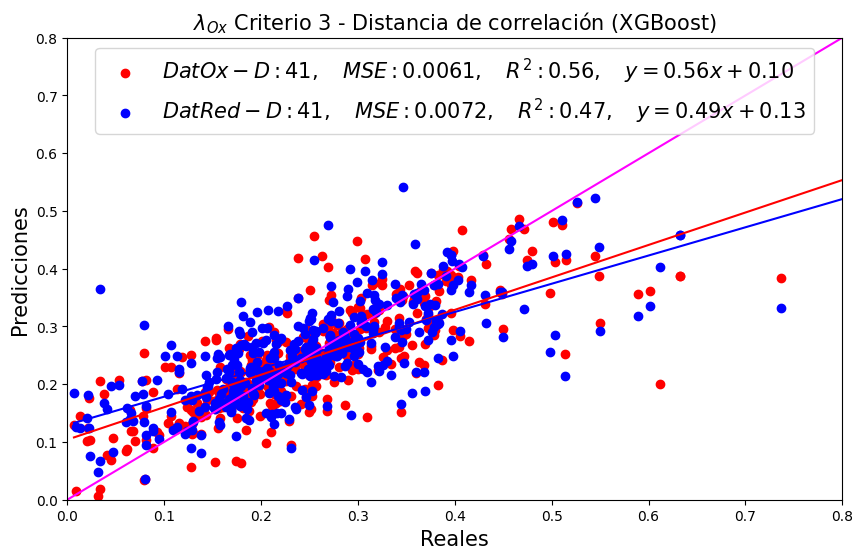

In [ ]:
df_entrenamiento_Ox = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[variables_DC_DatOx_lambda_Ox.to_list()]], axis=1)
df_entrenamiento_Red =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[variables_DC_DatRed_lambda_Ox.to_list()]], axis=1)

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 3 - Distancia de correlación (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_DC_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0084


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0082
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Mean Squared Error: 0.0083855611145453
R^2: 0.3888779996615409
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.008170084077867694
R^2: 0.40458151143405774


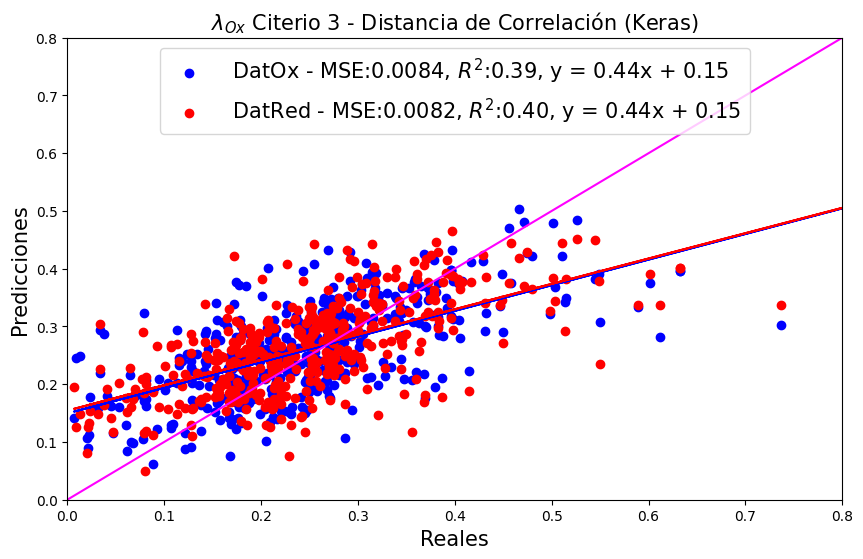

In [ ]:
df_entrenamiento_Ox = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[variables_DC_DatOx_lambda_Ox.to_list()]], axis=1)
df_entrenamiento_Red =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[variables_DC_DatRed_lambda_Ox.to_list()]], axis=1)

model, history, X_test, y_test = main(df_entrenamiento_Ox, energia_reorganizacion)
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, energia_reorganizacion)

plt.figure(figsize=(10, 6))
# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

plt.ylim(0, 0.8)
plt.xlim(0, 0.8)

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 3 - Distancia de Correlación (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_DC_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

###λRed

In [ ]:
energia_reorganizacion = 'lambda_Red'
energia_title = '$\lambda_{Red}$'

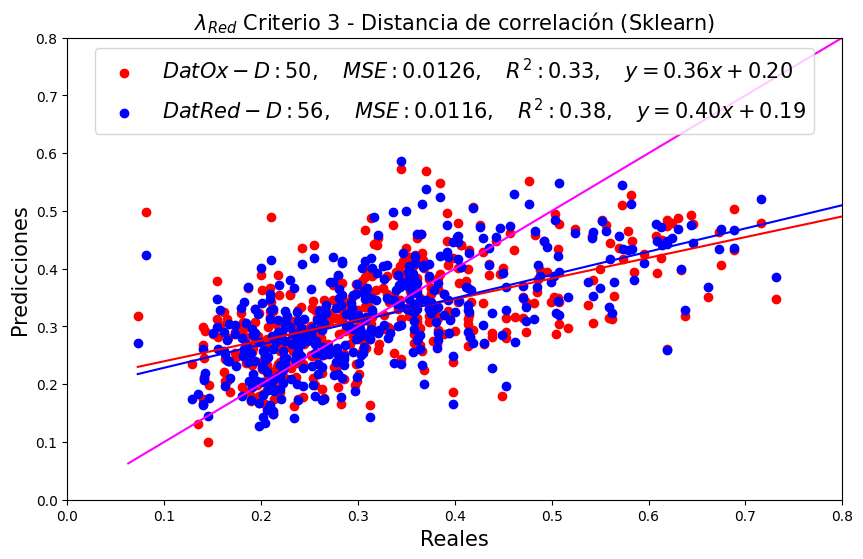

In [ ]:
df_entrenamiento_Ox = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[variables_DC_DatOx_lambda_Red.to_list()]], axis=1)
df_entrenamiento_Red =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[variables_DC_DatRed_lambda_Red.to_list()]], axis=1)

reacciones = df_entrenamiento_Ox.shape[0]

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 3 - Distancia de correlación (Sklearn)', fontsize= 15)
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_DC_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

[0]	train-rmse:0.11350	eval-rmse:0.12092
[37]	train-rmse:0.03060	eval-rmse:0.09575
[0]	train-rmse:0.11371	eval-rmse:0.12225
[48]	train-rmse:0.02307	eval-rmse:0.09312


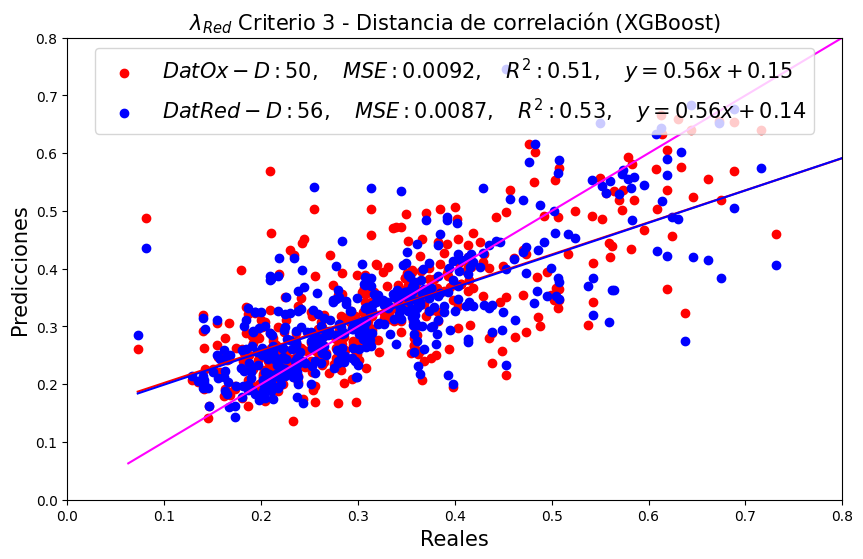

In [ ]:
df_entrenamiento_Ox = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[variables_DC_DatOx_lambda_Red.to_list()]], axis=1)
df_entrenamiento_Red =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[variables_DC_DatRed_lambda_Red.to_list()]], axis=1)

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 3 - Distancia de correlación (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, energia_reorganizacion, 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_DC_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0125


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0121
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.01248998748050319
R^2: 0.3262492787156702
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.012059205383230583
R^2: 0.3494870721247396


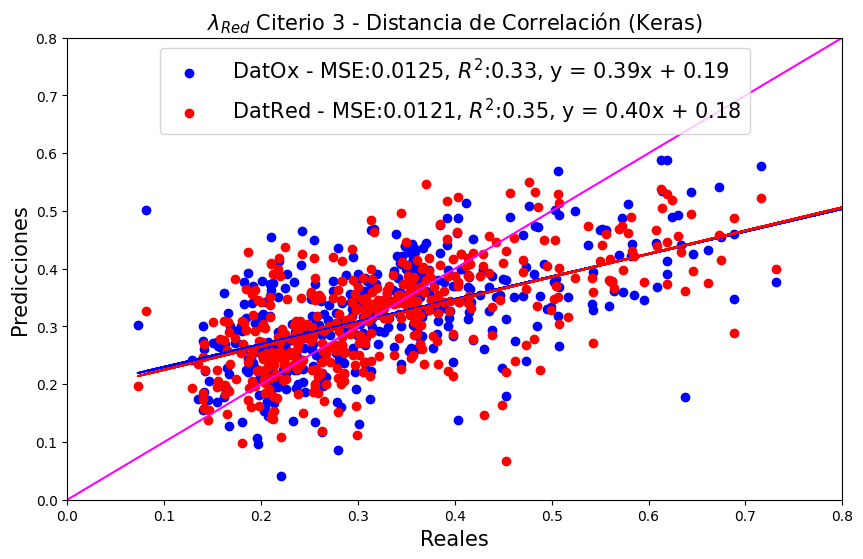

In [ ]:
df_entrenamiento_Ox = pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Ox[variables_DC_DatOx_lambda_Red.to_list()]], axis=1)
df_entrenamiento_Red =  pd.concat([df_reorganitation.iloc[:,:4],  df_reorganitation_Red[variables_DC_DatRed_lambda_Red.to_list()]], axis=1)


model, history, X_test, y_test = main(df_entrenamiento_Ox, energia_reorganizacion)
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, energia_reorganizacion)

plt.figure(figsize=(10, 6))
# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

plt.ylim(0, 0.8)
plt.xlim(0, 0.8)

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 3 - Distancia de Correlación (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/{familia}/{energia_reorganizacion}/Critero03_DC_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

#PCA

In [ ]:
# Guardar en una carpeta llamada "resultados"
df_descriptors_Ox.to_csv("df_descriptors_DatOx.csv", index=False)
df_descriptors_Red.to_csv("df_descriptors_DatRed.csv", index=False)
print(df_descriptors_Red.shape)
print(df_descriptors_Ox.shape)

(2219, 208)
(2219, 208)


In [ ]:
# Guardar solo las etiquetas (índices) en un archivo CSV
top_30_pearson_DatRed_lambda_Ox.index.to_series().to_csv("top_30_pearson_DatRed_lambda_Ox.txt", index=False, header=False)
top_30_pearson_DatOx_lambda_Ox.index.to_series().to_csv("top_30_pearson_DatOx_lambda_Ox.txt", index=False, header=False)

variables_DC_DatOx_lambda_Red.to_series().to_csv("top_DC_DatOx_lambda_Red.txt", index=False, header=False)
variables_DC_DatRed_lambda_Red.to_series().to_csv("top_DC_DatRed_lambda_Red.txt", index=False, header=False)

In [ ]:
  %%file pca.R

criterio3_lambda_Ox_DatRed <- readLines("top_30_pearson_DatRed_lambda_Ox.txt")
criterio3_lambda_Red_DatOx <- readLines("top_DC_DatOx_lambda_Red.txt")

criterio3_lambda_Ox_DatOx <- readLines("top_30_pearson_DatOx_lambda_Ox.txt")
criterio3_lambda_Red_DatRed <- readLines("top_DC_DatRed_lambda_Red.txt")


datos_Red <- read.csv("df_descriptors_DatRed.csv")
datos_Ox <- read.csv("df_descriptors_DatOx.csv")

#ndata <- datos_Red[, criterio3_lambda_Ox_DatRed]
#ndata <- datos_Ox[, criterio3_lambda_Red_DatOx]

#ndata <- datos_Red[, criterio3_lambda_Red_DatRed]
ndata <- datos_Ox[, criterio3_lambda_Ox_DatOx]

datos_pca <- prcomp(ndata, center = TRUE, scale = TRUE)

ncp <-11
print(paste("Numero de componentes principales:",ncp))
varianza_acumulada <- summary(datos_pca)$importance[3,][ncp]
print(paste("Varianza acumulada", varianza_acumulada))
loadings <- datos_pca$rotation

lista <- c()
ntcp <- dim(datos_pca$rotation)[1]
info_pesos <- array(NA, dim = c(ntcp, 2))
j <- 0
for (i in 1:ntcp){
  total <- sum(abs(loadings[i, 1:ncp]))
  des <- names(loadings[,i])[i]
  #print(paste(des,":",total))
  lista <- append(lista, total)
  j = j + total
  info_pesos[i,1] <- des
  info_pesos[i,2] <- total
}
#print(j)
#sort(lista, decreasing = TRUE)

indices_ordenados <- order(info_pesos[, 2], decreasing = TRUE)

# Indexar la matriz con los índices ordenados para reordenarla
info_pesos_ordenada <- info_pesos[indices_ordenados, ]

# Mostrar la matriz ordenada
print(info_pesos_ordenada)

num_umbral<- summary(as.numeric(info_pesos_ordenada[, 2]))[2]
print(paste("Umbral", num_umbral))
filas_seleccionadas <- info_pesos_ordenada[info_pesos_ordenada[, 2] > num_umbral, ]

# Imprimir solo el contenido de la primera columna de esas filas
descriptores_seleccionados <- filas_seleccionadas[, 1]

print(descriptores_seleccionados)

Overwriting pca.R


In [ ]:
%%sh
Rscript pca.R

[1] "Numero de componentes principales: 11"
[1] "Varianza acumulada 0.82114"
      [,1]               [,2]              
 [1,] "qed"              "2.21077760066877"
 [2,] "PEOE_VSA2"        "2.20712675996941"
 [3,] "PEOE_VSA7"        "2.09974923618985"
 [4,] "VSA_EState4"      "1.97443914053834"
 [5,] "VSA_EState3"      "1.9356351098105" 
 [6,] "PEOE_VSA1"        "1.93358855931674"
 [7,] "PEOE_VSA13"       "1.81021257040103"
 [8,] "PEOE_VSA6"        "1.79914395108997"
 [9,] "MinPartialCharge" "1.72745607963663"
[10,] "BCUT2D_MRLOW"     "1.69297815755562"
[11,] "fr_NH0"           "1.66721291006174"
[12,] "PEOE_VSA3"        "1.65256342480522"
[13,] "PEOE_VSA8"        "1.60543846129501"
[14,] "SMR_VSA9"         "1.57775483475653"
[15,] "TPSA"             "1.55440242425036"
[16,] "VSA_EState9"      "1.55345284869226"
[17,] "EState_VSA3"      "1.52067915183036"
[18,] "SlogP_VSA3"       "1.51709564727338"
[19,] "BalabanJ"         "1.49575967092213"
[20,] "NHOHCount"        "1.47434024408068"

In [ ]:
df_descriptors_Ox

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,4.269977,0.847199,4.269977,0.847199,0.802536,313.980,307.932,311.889772,70,0,...,0,0,0,0,0,0,0,0,0,0
1,8.942657,0.414537,8.942657,0.414537,0.713596,206.208,200.160,206.059246,74,0,...,0,0,0,0,0,0,0,0,0,0
2,4.346852,0.977407,4.346852,0.977407,0.680654,184.242,172.146,184.100048,70,0,...,0,0,0,0,0,0,0,0,0,0
3,6.035190,0.707296,6.035190,0.707296,0.393065,377.274,363.162,376.053404,126,0,...,0,0,0,0,0,0,0,0,0,0
4,12.813255,-4.815493,12.813255,0.663857,0.736773,292.182,286.134,292.043518,106,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
823,12.372585,-4.364117,12.372585,0.069792,0.847387,322.252,310.156,322.089919,119,1,...,0,0,0,0,0,0,0,0,0,0
824,5.826066,-0.595430,5.826066,0.595430,0.843229,324.038,313.958,321.959260,95,1,...,0,0,0,0,0,0,0,0,0,0
825,3.430436,1.029076,3.430436,1.029076,0.821221,214.312,196.168,214.146450,83,1,...,0,0,0,0,0,0,0,0,0,0
826,13.348189,-5.933530,13.348189,0.407896,0.761772,394.212,386.148,394.052232,143,1,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# DataFrame de entrada HAY QUE REVIZAR QUE ESTAS VARIABLES VENGAN DE PCA!!!!!!!!
pca_lambda_Ox_DatRed = ["SlogP_VSA3", "PEOE_VSA8", "EState_VSA9", "VSA_EState9",
               "BCUT2D_MRLOW", "PEOE_VSA1", "FpDensityMorgan1", "BCUT2D_CHGHI",
               "PEOE_VSA6", "SMR_VSA10", "SlogP_VSA8", "fr_NH0",
               "VSA_EState7", "EState_VSA3", "TPSA", "FractionCSP3",
               "BCUT2D_MWLOW", "PEOE_VSA11", "SlogP_VSA1", "VSA_EState6",
               "BCUT2D_CHGLO", "SlogP_VSA2"]

pca_lambda_Ox_DatOx = ["qed", "PEOE_VSA2", "PEOE_VSA7", "VSA_EState4",
"VSA_EState3", "PEOE_VSA1", "PEOE_VSA13", "PEOE_VSA6",
"MinPartialCharge", "BCUT2D_MRLOW", "fr_NH0", "PEOE_VSA3",
"PEOE_VSA8", "SMR_VSA9", "TPSA", "VSA_EState9",
"EState_VSA3", "SlogP_VSA3", "BalabanJ", "NHOHCount",
"NumAromaticRings", "PEOE_VSA10"]

pca_lambda_Red_DatOx = ["EState_VSA9", "fr_NH0", "qed", "SMR_VSA3",
                 "VSA_EState2", "PEOE_VSA1", "PEOE_VSA3",
                 "BCUT2D_MWLOW", "VSA_EState9", "BalabanJ",
                 "FractionCSP3", "BCUT2D_CHGHI", "Chi1v",
                 "SMR_VSA9", "NHOHCount", "Chi2v", "BCUT2D_CHGLO",
                 "VSA_EState3", "BCUT2D_LOGPLOW", "VSA_EState6",
                 "VSA_EState4", "Chi3v", "BCUT2D_MRLOW", "BCUT2D_LOGPHI",
                 "NumAromaticRings", "Chi4v", "HeavyAtomMolWt", "PEOE_VSA9",
                 "EState_VSA5", "Chi3n", "SlogP_VSA8", "MolWt", "Chi4n",
                 "ExactMolWt", "SlogP_VSA2", "Chi1n", "HeavyAtomCount"]

pca_lambda_Red_DatRed = ["VSA_EState3", "SlogP_VSA4", "MaxAbsPartialCharge",
"MinPartialCharge", "VSA_EState2", "PEOE_VSA9",
"VSA_EState7", "PEOE_VSA1", "FpDensityMorgan3",
"FpDensityMorgan2", "PEOE_VSA2", "PEOE_VSA8",
"BCUT2D_MWLOW", "VSA_EState9", "SMR_VSA7",
"SMR_VSA6", "FpDensityMorgan1", "Chi2v",
"PEOE_VSA5", "Chi1v", "FractionCSP3",
"SlogP_VSA10", "NumAromaticRings", "SlogP_VSA1",
"EState_VSA9", "PEOE_VSA11", "BalabanJ",
"BCUT2D_CHGHI", "VSA_EState6", "Chi3v",
"PEOE_VSA7", "SlogP_VSA2", "Chi4v",
"EState_VSA5", "BCUT2D_LOGPHI", "NHOHCount",
"Chi2n", "VSA_EState4", "MolMR",
"Chi3n", "HeavyAtomMolWt"]

(2219, 26)
(2219, 26)
[0]	train-rmse:0.11732	eval-rmse:0.11711
[100]	train-rmse:0.11132	eval-rmse:0.11251
[200]	train-rmse:0.10583	eval-rmse:0.10867
[300]	train-rmse:0.10089	eval-rmse:0.10548
[400]	train-rmse:0.09655	eval-rmse:0.10285
[500]	train-rmse:0.09269	eval-rmse:0.10054
[600]	train-rmse:0.08927	eval-rmse:0.09872
[700]	train-rmse:0.08618	eval-rmse:0.09726
[800]	train-rmse:0.08341	eval-rmse:0.09591
[900]	train-rmse:0.08093	eval-rmse:0.09489
[1000]	train-rmse:0.07869	eval-rmse:0.09398
[1100]	train-rmse:0.07669	eval-rmse:0.09328
[1200]	train-rmse:0.07499	eval-rmse:0.09270
[1300]	train-rmse:0.07338	eval-rmse:0.09208
[1400]	train-rmse:0.07185	eval-rmse:0.09153
[1500]	train-rmse:0.07039	eval-rmse:0.09105
[1600]	train-rmse:0.06872	eval-rmse:0.09062
[1700]	train-rmse:0.06718	eval-rmse:0.09004
[1800]	train-rmse:0.06582	eval-rmse:0.08946
[1900]	train-rmse:0.06459	eval-rmse:0.08905
[2000]	train-rmse:0.06335	eval-rmse:0.08869
[2100]	train-rmse:0.06215	eval-rmse:0.08839
[2200]	train-rmse:0.06

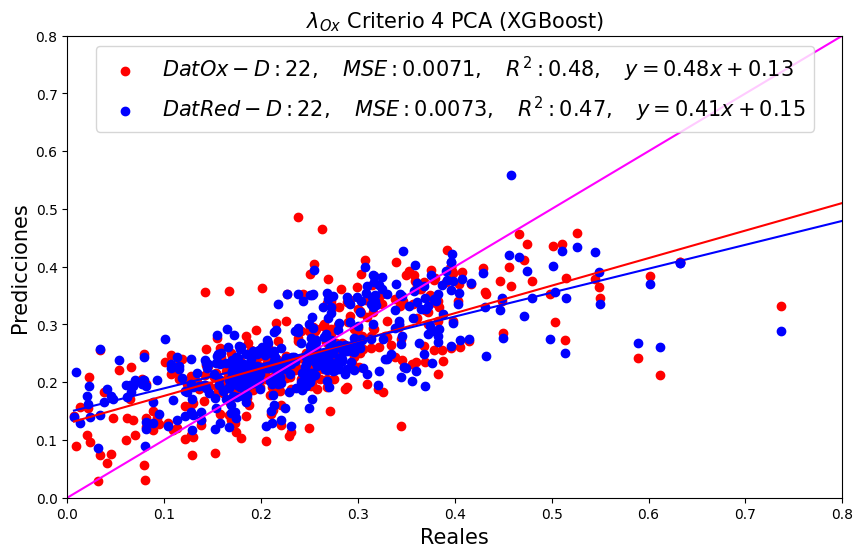

In [ ]:
df_entrenamiento_Ox = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Ox[pca_lambda_Ox_DatOx]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Red[pca_lambda_Ox_DatRed]], axis=1)

energia_title='$\lambda_{Ox}$'

print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)
reacciones = df_entrenamiento_Ox.shape[0]
plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 4 PCA (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, 'lambda_Ox', 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/All/lambda_Ox/Critero04_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 41)
(2219, 45)
[0]	train-rmse:0.13337	eval-rmse:0.13622
[100]	train-rmse:0.12485	eval-rmse:0.13040
[200]	train-rmse:0.11729	eval-rmse:0.12515
[300]	train-rmse:0.11054	eval-rmse:0.12085
[400]	train-rmse:0.10434	eval-rmse:0.11732
[500]	train-rmse:0.09866	eval-rmse:0.11422
[600]	train-rmse:0.09338	eval-rmse:0.11162
[700]	train-rmse:0.08863	eval-rmse:0.10974
[800]	train-rmse:0.08427	eval-rmse:0.10788
[900]	train-rmse:0.08032	eval-rmse:0.10608
[1000]	train-rmse:0.07669	eval-rmse:0.10442
[1100]	train-rmse:0.07335	eval-rmse:0.10309
[1200]	train-rmse:0.07034	eval-rmse:0.10195
[1300]	train-rmse:0.06748	eval-rmse:0.10083
[1400]	train-rmse:0.06471	eval-rmse:0.09969
[1500]	train-rmse:0.06197	eval-rmse:0.09898
[1600]	train-rmse:0.05943	eval-rmse:0.09835
[1700]	train-rmse:0.05718	eval-rmse:0.09774
[1800]	train-rmse:0.05517	eval-rmse:0.09720
[1900]	train-rmse:0.05318	eval-rmse:0.09670
[2000]	train-rmse:0.05120	eval-rmse:0.09628
[2100]	train-rmse:0.04938	eval-rmse:0.09597
[2200]	train-rmse:0.04

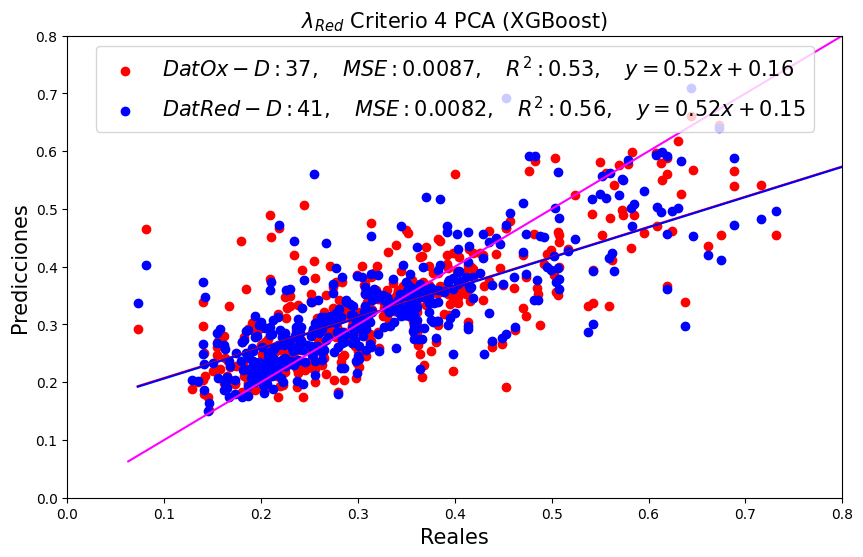

In [ ]:
df_entrenamiento_Ox = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Ox[pca_lambda_Red_DatOx]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Red[pca_lambda_Red_DatRed]], axis=1)

energia_title='$\lambda_{Red}$'
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)
reacciones = df_entrenamiento_Ox.shape[0]
plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 4 PCA (XGBoost)', fontsize= 15)
# Configuración del conjunto de datos
model_ead(df_entrenamiento_Ox, df_entrenamiento_Red, 'lambda_Red', 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/All/lambda_Red/Critero04_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 41)
(2219, 45)


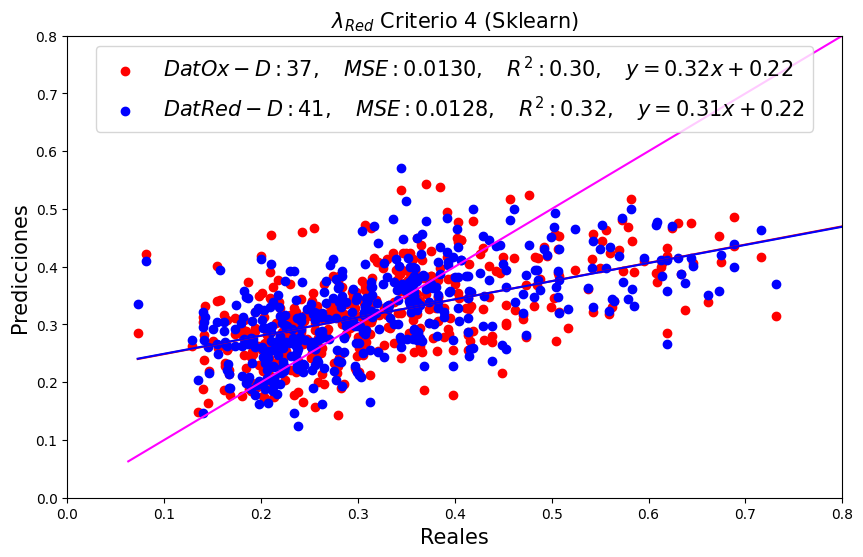

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Ox[pca_lambda_Red_DatOx]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Red[pca_lambda_Red_DatRed]], axis=1)

energia_title='$\lambda_{Red}$'
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)
reacciones = df_entrenamiento_Ox.shape[0]

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 4 (Sklearn)', fontsize= 15)#\n{reacciones} racciones redox
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, 'lambda_Red', 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/All/lambda_Red/Critero04_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

(2219, 26)
(2219, 26)


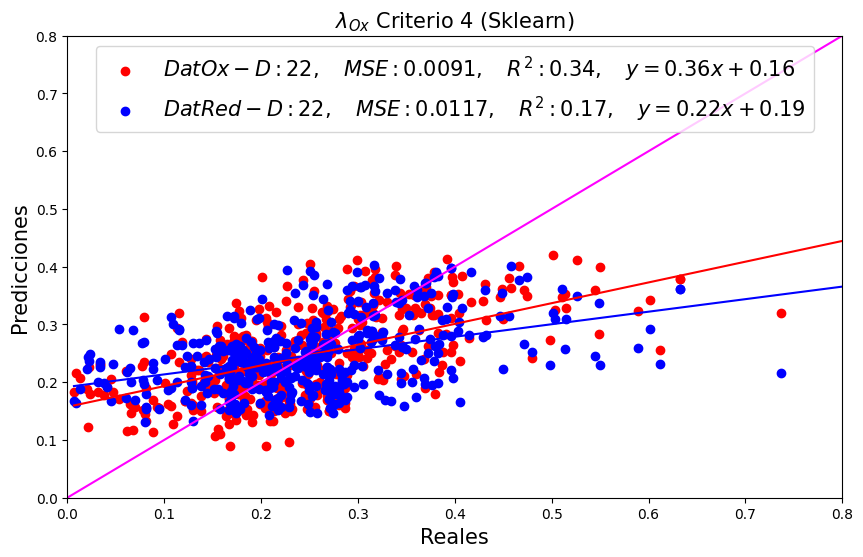

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Ox[pca_lambda_Ox_DatOx]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Red[pca_lambda_Ox_DatRed]], axis=1)

energia_title='$\lambda_{Ox}$'
print(df_entrenamiento_Ox.shape)
print(df_entrenamiento_Red.shape)
reacciones = df_entrenamiento_Ox.shape[0]

plt.figure(figsize=(10, 6))
plt.title(f'{energia_title} Criterio 4 (Sklearn)', fontsize= 15)#\n{reacciones} racciones redox
# Configuración del conjunto de datos
model_rlm(df_entrenamiento_Ox, df_entrenamiento_Red, 'lambda_Ox', 42, 'red', 'blue')
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/All/lambda_Ox/Critero04_Sklearn.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0124


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0118
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.01236092697252353
R^2: 0.333211224072009
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Mean Squared Error: 0.01175877076230804
R^2: 0.36569349689989017


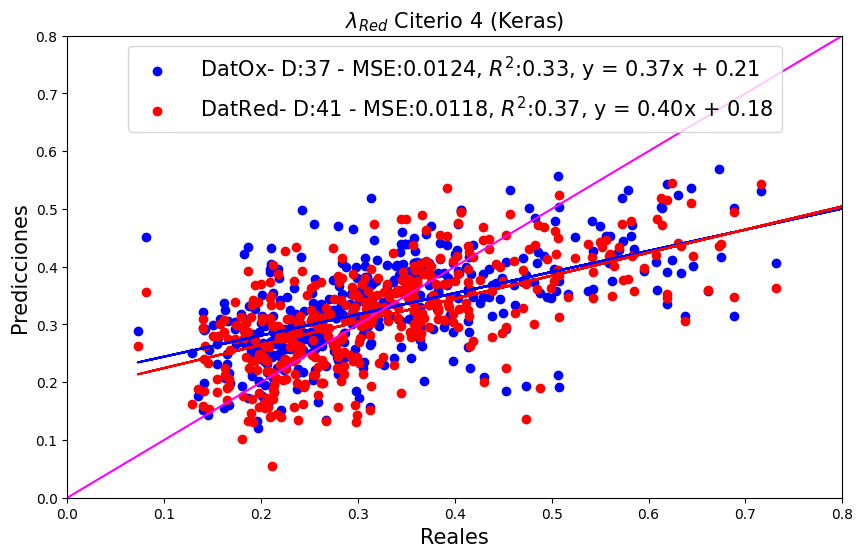

In [ ]:
# DataFrame de entrada
df_entrenamiento_Ox = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Ox[pca_lambda_Red_DatOx]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Red[pca_lambda_Red_DatRed]], axis=1)
descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4
energia_title='$\lambda_{Red}$'

model, history, X_test, y_test = main(df_entrenamiento_Ox,'lambda_Red' )
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, 'lambda_Red')

plt.figure(figsize=(10, 6))
plt.ylim(0, 0.8)
plt.xlim(0, 0.8)
# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx- D:{descript_Ox} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed- D:{descript_Red} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 4 (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/All/lambda_Red/Critero04_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0082


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Pérdida en el conjunto de prueba: 0.0100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Mean Squared Error: 0.008158054541286062
R^2: 0.4054581986775817
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Mean Squared Error: 0.009962540856610191
R^2: 0.2739510435163789


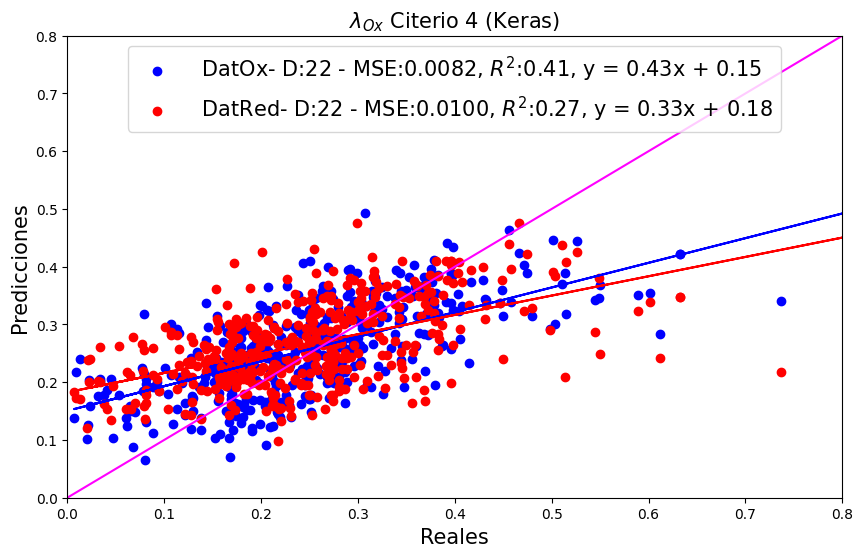

In [ ]:
df_entrenamiento_Ox = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Ox[pca_lambda_Ox_DatOx]], axis=1)
df_entrenamiento_Red = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Red[pca_lambda_Ox_DatRed]], axis=1)
descript_Ox = df_entrenamiento_Ox .shape[1]-4
descript_Red = df_entrenamiento_Red.shape[1]-4
energia_title='$\lambda_{Ox}$'

model, history, X_test, y_test = main(df_entrenamiento_Ox, 'lambda_Ox')
model_2, history_2, X_test_2, y_test_2 = main(df_entrenamiento_Red, 'lambda_Ox')

plt.figure(figsize=(10, 6))
plt.ylim(0, 0.8)
plt.xlim(0, 0.8)
# Peredicción DatOx
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model, X_test, y_test)
plt.plot(y_test, y_lineal, color='blue')
plt.scatter(y_test, y_pred, color='blue', label=f' DatOx- D:{descript_Ox} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Prediccioón Red
y_lineal, y_pred, mse, r2, m, b = metrics_lineal(model_2, X_test_2, y_test_2)
plt.plot(y_test, y_lineal, color='red')
plt.scatter(y_test, y_pred, color='red', label=f' DatRed- D:{descript_Red} - MSE:{mse:.4f}, $R^2$:{r2:.2f}, y = {m:.2f}x + {b:.2f}')

# Recta lineal
plt.plot([0,1], [0,1], color='magenta')
plt.xlabel('Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)
plt.title(f'{energia_title} Citerio 4 (Keras)', fontsize=15)
plt.legend(loc='upper center' ,fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/All/lambda_Ox/Critero04_RN.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()

##Optimización

In [ ]:
import sklearn.datasets
import sklearn.metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, auc
!pip install optuna
import optuna
import xgboost as xgb
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import confusion_matrix

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 22.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 6.9 MB/s eta 0:00:00


In [ ]:
df = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Ox[pca_lambda_Red_DatOx]], axis=1)
# Cargar los datos
data, target = df.drop(columns=['lambda_Red']).values, df['lambda_Red'].values
train_x, valid_x, train_y, valid_y = train_test_split(data,
                                                      target,
                                                      test_size=0.20,
                                                      random_state=43)

dtrain = xgb.DMatrix(train_x, label=train_y)
dvalid = xgb.DMatrix(valid_x, label=valid_y)

# Función objetivo para Optuna
def objective(trial):
    # Definir los hiperparámetros a explorar, sin incluir colsample_bynode
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'booster': trial.suggest_categorical('booster', ['gbtree', 'dart']),
        'lambda': trial.suggest_loguniform('lambda', 1e-8, 1.0),
        'alpha': trial.suggest_loguniform('alpha', 1e-8, 1.0),
        'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
        'colsample_bylevel': trial.suggest_uniform('colsample_bylevel', 0.5, 1.0),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 0.3),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
    }

    # Crear el modelo XGBoost para regresión con los hiperparámetros seleccionados
    model = xgb.XGBRegressor(**param)

    # Entrenar el modelo
    model.fit(train_x, train_y)

    # Predecir sobre los datos de prueba
    preds = model.predict(valid_x)

    # Evaluar el modelo utilizando el error cuadrático medio (MSE)
    mse = mean_squared_error(valid_y, preds)

    # Minimizar el MSE
    #return mse
    score = cross_val_score(model, train_x, train_y, cv=10, n_jobs=-1, scoring='r2').mean()
    return score

# Crear un estudio de Optuna
study = optuna.create_study(direction='maximize')  # Cambiar a 'minimize' para MSE
study.optimize(objective, n_trials=10)  # Puedes ajustar el número de intentos (n_trials

# Mostrar los mejores hiperparámetros
print("Mejores hiperparámetros:", study.best_params)

[I 2024-09-20 18:01:32,273] A new study created in memory with name: no-name-3dad7332-60b2-43ad-9f6a-ae47a040003b
<ipython-input-105-87011c5f5384>:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda': trial.suggest_loguniform('lambda', 1e-8, 1.0),
<ipython-input-105-87011c5f5384>:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'alpha': trial.suggest_loguniform('alpha', 1e-8, 1.0),
<ipython-input-105-87011c5f5384>:20: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
<

KeyboardInterrupt: 

In [ ]:
df = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Red[pca_lambda_Ox_DatRed]], axis=1)


data, target = df.drop(columns=['lambda_Ox']).values, df['lambda_Ox'].values
train_x, valid_x, train_y, valid_y = train_test_split(data,
                                                      target,
                                                      test_size=0.20,
                                                      random_state=43)

dtrain = xgb.DMatrix(train_x, label=train_y)
dvalid = xgb.DMatrix(valid_x, label=valid_y)

# Función objetivo para Optuna
def objective(trial):
    # Definir los hiperparámetros a explorar, sin incluir colsample_bynode
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'booster': trial.suggest_categorical('booster', ['gbtree', 'dart']),
        'lambda': trial.suggest_loguniform('lambda', 1e-8, 1.0),
        'alpha': trial.suggest_loguniform('alpha', 1e-8, 1.0),
        'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
        'colsample_bylevel': trial.suggest_uniform('colsample_bylevel', 0.5, 1.0),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 0.3),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
    }

    # Crear el modelo XGBoost para regresión con los hiperparámetros seleccionados
    model = xgb.XGBRegressor(**param)

    # Entrenar el modelo
    model.fit(train_x, train_y)

    # Predecir sobre los datos de prueba
    preds = model.predict(valid_x)

    # Evaluar el modelo utilizando el error cuadrático medio (MSE)
    mse = mean_squared_error(valid_y, preds)
    # Minimizar el MSE
    return mse
    #score = cross_val_score(model, train_x, train_y, cv=10, n_jobs=-1, scoring='precision').mean()
    #return score

# Crear un estudio de Optuna
study = optuna.create_study(direction='minimize')  # Cambiar a 'minimize' para MSE
study.optimize(objective, n_trials=50)  # Puedes ajustar el número de intentos (n_trials

# Mostrar los mejores hiperparámetros
print("Mejores hiperparámetros:", study.best_params)

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

In [ ]:
{'n_estimators': 401,
 'booster': 'dart',
 'lambda': 1.0580474982815924e-08,
 'alpha': 3.101779151187881e-07,
 'subsample': 0.9463766726533687,
 'colsample_bytree': 0.7086038895665232,
 'colsample_bylevel': 0.7021362912721183,
 'max_depth': 4,
 'learning_rate': 0.030871506490891824,
 'min_child_weight': 2}



{'n_estimators': 401,
 'booster': 'dart',
 'lambda': 1.0580474982815924e-08,
 'alpha': 3.101779151187881e-07,
 'subsample': 0.9463766726533687,
 'colsample_bytree': 0.7086038895665232,
 'colsample_bylevel': 0.7021362912721183,
 'max_depth': 4,
 'learning_rate': 0.030871506490891824,
 'min_child_weight': 2}

[0]	train-rmse:0.10401	eval-rmse:0.10636
[50]	train-rmse:0.01679	eval-rmse:0.02301
[100]	train-rmse:0.00888	eval-rmse:0.01721
[150]	train-rmse:0.00685	eval-rmse:0.01609
[172]	train-rmse:0.00624	eval-rmse:0.01596


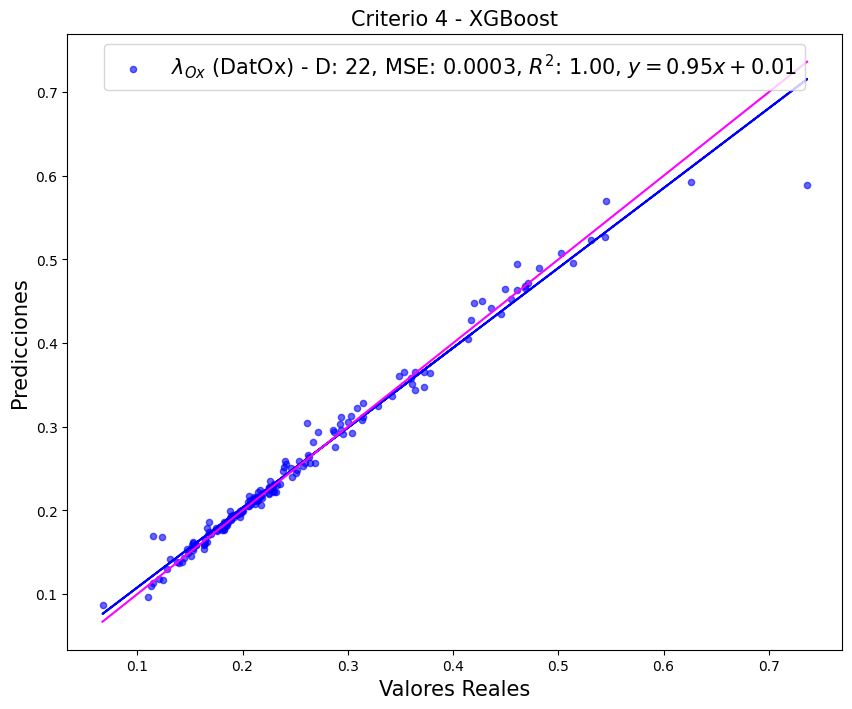

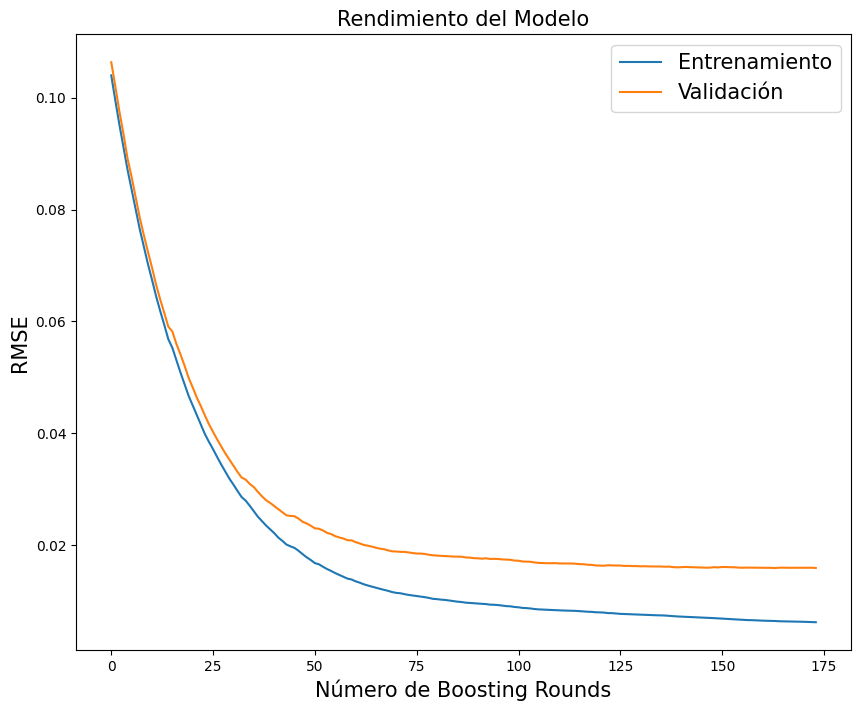

In [ ]:
# Concatenación de datos
df = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Red[pca_lambda_Ox_DatRed]], axis=1)

# División en datos y variable objetivo
target_column = 'lambda_Ox'  # Nombre de la variable objetivo
datos, target = df.drop(columns=[target_column]).values, df[target_column].values

# División en conjuntos de entrenamiento y validación
train_x, valid_x, train_y, valid_y = train_test_split(datos, target, test_size=0.20, random_state=43)

# Estandarización de los datos
scaler = StandardScaler()
train_x = scaler.fit_transform(train_x)
valid_x = scaler.transform(valid_x)

# Creación de matrices DMatrix para XGBoost
dtrain = xgb.DMatrix(train_x, label=train_y)
dvalid = xgb.DMatrix(valid_x, label=valid_y)


def rendimiento(evals_result):
  # Graficar rendimiento durante el entrenamiento
    plt.figure(figsize=(10, 8))
    plt.plot(evals_result['train']['rmse'], label='Entrenamiento')
    plt.plot(evals_result['eval']['rmse'], label='Validación')
    plt.xlabel('Número de Boosting Rounds', fontsize=15)
    plt.ylabel('RMSE', fontsize=15)
    plt.title('Rendimiento del Modelo', fontsize=15)
    plt.legend(fontsize=15)
    plt.show()
    return None

# Función de entrenamiento con validación cruzada
def xgboost_params(params, num_boost_round):
    evals = [(dtrain, 'train'), (dvalid, 'eval')]
    evals_result = {}

    # Entrenamiento del modelo
    xgb_model = xgb.train(params=params,
                          dtrain=dtrain,
                          num_boost_round=num_boost_round,
                          evals=evals,
                          verbose_eval=50,
                          evals_result=evals_result,
                          early_stopping_rounds=10)

    # Predicciones
    y_pred = xgb_model.predict(dvalid)

    # Métricas
    mse = mean_squared_error(valid_y, y_pred)

    # Ajuste lineal
    lin_reg = LinearRegression()
    lin_reg.fit(valid_y.reshape(-1, 1), y_pred.reshape(-1, 1))
    y_lineal = lin_reg.predict(valid_y.reshape(-1, 1))

    # Obtener pendiente, ordenada y R²
    m = lin_reg.coef_[0][0]
    b = lin_reg.intercept_[0]
    r2 = r2_score(valid_y, y_lineal)
    return evals_result, y_lineal, y_pred, valid_y, mse, r2, m, b

# Parámetros del modelo XGBoost

params1 = {'objective': 'reg:squarederror',
           'booster': 'gbtree',
           'lambda': 0.2320989612007283,
           'alpha': 0.0011844312379449082,
           'subsample': 0.5471050723616294,
           'colsample_bytree': 0.9478468797358522,
           'colsample_bylevel': 0.7872740740073115,
           'max_depth': 6,
           'learning_rate': 0.05131314925837941,
           'min_child_weight': 6 }
'''
paeams1 = {'booster': 'dart',
 'lambda': 1.0580474982815924e-08,
 'alpha': 3.101779151187881e-07,
 'subsample': 0.9463766726533687,
 'colsample_bytree': 0.7086038895665232,
 'colsample_bylevel': 0.7021362912721183,
 'max_depth': 4,
 'learning_rate': 0.030871506490891824,
 'min_child_weight': 2}
'''

# Llamar a la función de entrenamiento con validación cruzada

# Gráfica de resultados
plt.figure(figsize=(10, 8))
plt.title(f'Criterio 4 - XGBoost', fontsize=15)
plt.xlabel('Valores Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)

# Gráfico de dispersión de los valores reales y predichos
evals_result, y_lineal, y_pred, valid_y, mse, r2, m, b = xgboost_params(params1, 1000)
plt.scatter(valid_y, y_pred, label=f'$\lambda_{{Ox}}$ (DatOx) - D: {len(df.columns)-4}, MSE: {mse:.4f}, $R^2$: {r2:.2f}, $y = {m:.2f}x + {b:.2f}$', alpha=0.6, s=20, color='blue')

# Graficar la recta del ajuste lineal
plt.plot(valid_y, y_lineal, color='blue')

# Recta con pendiente 1 (referencia)
x = np.linspace(min(valid_y), max(valid_y), 100)
plt.plot(x, x, color='magenta')

# Leyenda y visualización
plt.legend(loc='upper center', fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/Bpy/{energia_reorganizacion}/Opt_lambda_Ox_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')

plt.show()

rendimiento(evals_result)

[0]	train-rmse:0.12001	eval-rmse:0.12174
[50]	train-rmse:0.04300	eval-rmse:0.04960
[100]	train-rmse:0.01981	eval-rmse:0.02903
[150]	train-rmse:0.01246	eval-rmse:0.02169
[200]	train-rmse:0.01007	eval-rmse:0.01946
[250]	train-rmse:0.00859	eval-rmse:0.01816
[300]	train-rmse:0.00747	eval-rmse:0.01752
[302]	train-rmse:0.00740	eval-rmse:0.01751


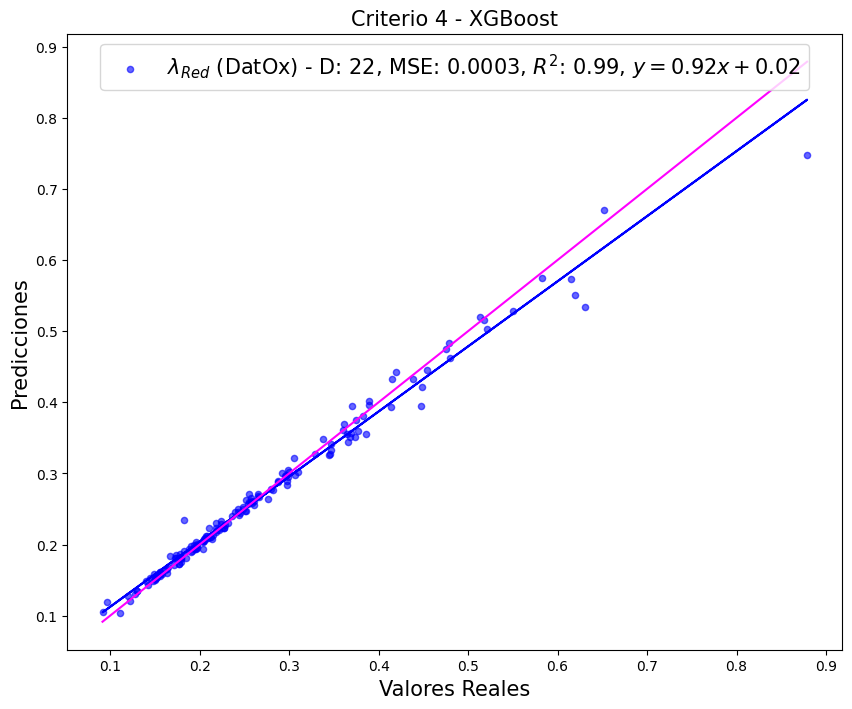

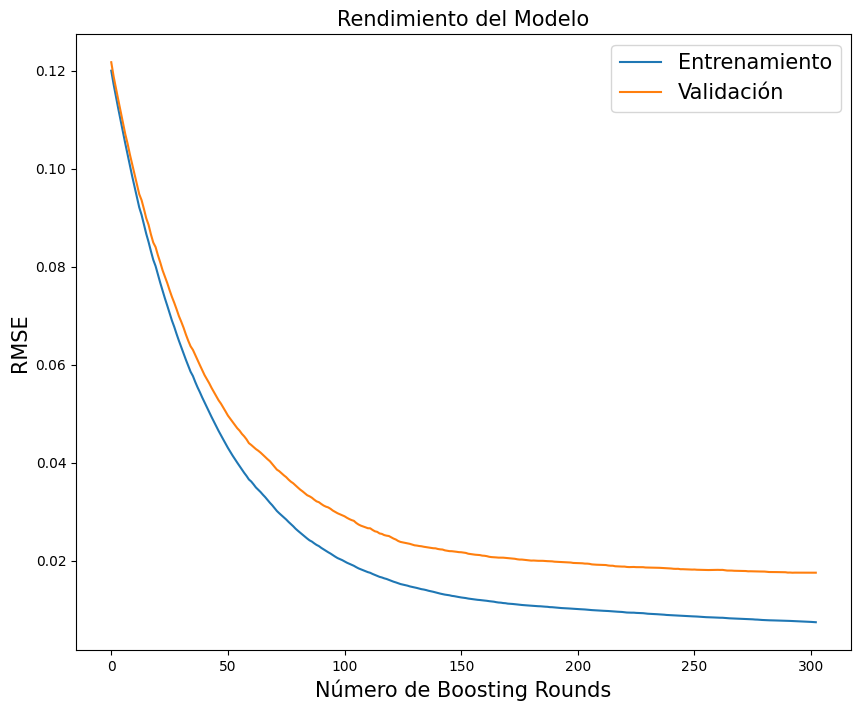

In [ ]:
# Concatenación de datos
df = pd.concat([df_reorganitation.iloc[:,:4], df_descriptors_Ox[pca_10_lambda_Red_DatOx]], axis=1)

# División en datos y variable objetivo
target_column = 'lambda_Red'  # Nombre de la variable objetivo
datos, target = df.drop(columns=[target_column]).values, df[target_column].values

# División en conjuntos de entrenamiento y validación
train_x, valid_x, train_y, valid_y = train_test_split(datos, target, test_size=0.20, random_state=43)

# Estandarización de los datos
scaler = StandardScaler()
train_x = scaler.fit_transform(train_x)
valid_x = scaler.transform(valid_x)

# Creación de matrices DMatrix para XGBoost
dtrain = xgb.DMatrix(train_x, label=train_y)
dvalid = xgb.DMatrix(valid_x, label=valid_y)

# Parámetros del modelo XGBoost
params1 = {'objective': 'reg:squarederror',
           'booster': 'gbtree',
           'lambda': 0.0001759684691729498,
           'alpha': 0.002188089638702213,
           'subsample': 0.7819356378179168,
           'colsample_bytree': 0.9473763249119455,
           'colsample_bylevel': 0.7551915295620789,
           'max_depth': 10,
           'learning_rate': 0.024443034374354872,
           'min_child_weight': 6}



# Llamar a la función de entrenamiento con validación cruzada

# Gráfica de resultados
plt.figure(figsize=(10, 8))
plt.title(f'Criterio 4 - XGBoost', fontsize=15)
plt.xlabel('Valores Reales', fontsize=15)
plt.ylabel('Predicciones', fontsize=15)

# Gráfico de dispersión de los valores reales y predichos
evals_result, y_lineal, y_pred, valid_y, mse, r2, m, b = xgboost_params(params1, 1000)
plt.scatter(valid_y, y_pred, label=f'$\lambda_{{Red}}$ (DatOx) - D: {len(df.columns)-4}, MSE: {mse:.4f}, $R^2$: {r2:.2f}, $y = {m:.2f}x + {b:.2f}$', alpha=0.6, s=20, color='blue')

# Graficar la recta del ajuste lineal
plt.plot(valid_y, y_lineal, color='blue')

# Recta con pendiente 1 (referencia)
x = np.linspace(min(valid_y), max(valid_y), 100)
plt.plot(x, x, color='magenta')

# Leyenda y visualización
plt.legend(loc='upper center', fontsize=15)
ruta_guardado = f'/content/drive/MyDrive/Proyecto-Maestria/Img/Bpy/{energia_reorganizacion}/Opt_lambda_Red_XGBoost.png'
plt.savefig(ruta_guardado, dpi=200, bbox_inches='tight')
plt.show()
rendimiento(evals_result)

#Clasificación

In [ ]:
from sklearn.preprocessing import StandardScaler

# Normalizar las características (excluyendo la columna 'reversibilidad')
scaler = StandardScaler()
variables_norm = scaler.fit_transform(df_descriptors_Ox[pca_lambda_Red_DatOx])

df_variables_norm = pd.DataFrame(variables_norm, columns=pca_lambda_Red_DatOx)

reversibilidad = pd.Series(np.nan, index=df_descriptors_Ox.index, name='Reversibilidad')
df_class = pd.concat([reversibilidad, df_variables_norm], axis=1)
df_class

,Reversibilidad,EState_VSA9,fr_NH0,qed,SMR_VSA3,VSA_EState2,PEOE_VSA1,PEOE_VSA3,BCUT2D_MWLOW,VSA_EState9,...,PEOE_VSA9,EState_VSA5,Chi3n,SlogP_VSA8,MolWt,Chi4n,ExactMolWt,SlogP_VSA2,Chi1n,HeavyAtomCount
0,NaN,1.016854,0.592717,0.345721,-0.812567,-0.590871,-1.170039,-1.002971,-0.283267,-0.537106,...,-0.511455,-0.914205,-0.417295,-0.864558,0.106833,-0.339154,0.108550,-0.482151,-0.419162,0.048950
1,NaN,3.958247,-1.133319,0.375285,-0.812567,-0.910628,-1.170039,-1.002971,-1.112641,-0.537106,...,-0.462736,-0.914205,0.050404,-0.864558,0.827422,0.216225,0.808258,0.145908,-0.269766,0.048950
2,NaN,4.734891,-1.133319,0.465830,-0.812567,-0.735357,0.816689,-1.002971,-0.465979,-0.537106,...,-0.869219,-0.914205,-0.243787,-0.864558,1.273579,-0.103853,1.256460,0.170071,-0.027621,0.558898
3,NaN,0.154128,-1.133319,0.077183,-0.812567,-0.735357,-1.170039,0.891678,-1.131922,-0.537106,...,-0.462736,-0.914205,0.017211,-0.864558,-0.592005,0.034804,-0.590898,0.384641,-0.436849,-0.460999
4,NaN,0.930772,-1.133319,0.549866,-0.812567,-0.735357,0.816689,0.891678,-0.466399,-0.537106,...,-0.869219,-0.914205,-0.267356,-0.864558,-0.145847,-0.134440,-0.142696,0.408803,-0.213777,0.048950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2214,NaN,-0.732764,-1.133319,1.525430,0.719175,-0.452847,-0.055059,0.072427,0.479841,-0.537106,...,-0.400906,2.316440,-0.236680,-0.864558,0.439464,0.096786,0.445597,-0.421814,0.151977,0.558898
2215,NaN,3.071355,-1.133319,1.491689,0.719175,-0.520949,-0.055059,0.072427,0.693317,-0.537106,...,-0.869219,-0.914205,-0.803918,-0.864558,0.464366,-0.781220,0.443767,-0.909866,-0.727433,-0.460999
2216,NaN,-0.732764,-1.133319,1.313095,0.719175,-0.358967,-0.055059,0.072427,0.540697,-0.537106,...,-0.869219,0.096035,-0.265959,-0.864558,-1.065575,-0.349988,-1.066773,-1.223895,-0.189881,-0.970948
2217,NaN,-0.732764,-1.133319,0.830680,0.719175,-0.549102,-0.055059,0.072427,0.298859,-0.537106,...,-0.453697,-0.914205,0.475100,-0.864558,1.442823,-0.026097,1.453845,-0.037251,0.425692,1.578795


In [ ]:
for i in range(df_reorganitation.shape[0]):
  energy = min(df_reorganitation.iloc[i,0],df_reorganitation.iloc[i,1])
  if energy < 0.8:
    df_class.iloc[i,0]= 0 # Quasirreversibles
  else:
    df_class.iloc[i,0] = 1 # Reversible
df_class

,Reversibilidad,EState_VSA9,fr_NH0,qed,SMR_VSA3,VSA_EState2,PEOE_VSA1,PEOE_VSA3,BCUT2D_MWLOW,VSA_EState9,...,PEOE_VSA9,EState_VSA5,Chi3n,SlogP_VSA8,MolWt,Chi4n,ExactMolWt,SlogP_VSA2,Chi1n,HeavyAtomCount
0,1.0,1.016854,0.592717,0.345721,-0.812567,-0.590871,-1.170039,-1.002971,-0.283267,-0.537106,...,-0.511455,-0.914205,-0.417295,-0.864558,0.106833,-0.339154,0.108550,-0.482151,-0.419162,0.048950
1,1.0,3.958247,-1.133319,0.375285,-0.812567,-0.910628,-1.170039,-1.002971,-1.112641,-0.537106,...,-0.462736,-0.914205,0.050404,-0.864558,0.827422,0.216225,0.808258,0.145908,-0.269766,0.048950
2,1.0,4.734891,-1.133319,0.465830,-0.812567,-0.735357,0.816689,-1.002971,-0.465979,-0.537106,...,-0.869219,-0.914205,-0.243787,-0.864558,1.273579,-0.103853,1.256460,0.170071,-0.027621,0.558898
3,1.0,0.154128,-1.133319,0.077183,-0.812567,-0.735357,-1.170039,0.891678,-1.131922,-0.537106,...,-0.462736,-0.914205,0.017211,-0.864558,-0.592005,0.034804,-0.590898,0.384641,-0.436849,-0.460999
4,0.0,0.930772,-1.133319,0.549866,-0.812567,-0.735357,0.816689,0.891678,-0.466399,-0.537106,...,-0.869219,-0.914205,-0.267356,-0.864558,-0.145847,-0.134440,-0.142696,0.408803,-0.213777,0.048950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2214,1.0,-0.732764,-1.133319,1.525430,0.719175,-0.452847,-0.055059,0.072427,0.479841,-0.537106,...,-0.400906,2.316440,-0.236680,-0.864558,0.439464,0.096786,0.445597,-0.421814,0.151977,0.558898
2215,1.0,3.071355,-1.133319,1.491689,0.719175,-0.520949,-0.055059,0.072427,0.693317,-0.537106,...,-0.869219,-0.914205,-0.803918,-0.864558,0.464366,-0.781220,0.443767,-0.909866,-0.727433,-0.460999
2216,1.0,-0.732764,-1.133319,1.313095,0.719175,-0.358967,-0.055059,0.072427,0.540697,-0.537106,...,-0.869219,0.096035,-0.265959,-0.864558,-1.065575,-0.349988,-1.066773,-1.223895,-0.189881,-0.970948
2217,1.0,-0.732764,-1.133319,0.830680,0.719175,-0.549102,-0.055059,0.072427,0.298859,-0.537106,...,-0.453697,-0.914205,0.475100,-0.864558,1.442823,-0.026097,1.453845,-0.037251,0.425692,1.578795


In [ ]:
df_class.to_csv('/content/drive/MyDrive/Proyecto-Maestria/Img/All/df_class.csv', index=False)

In [ ]:
df_class.describe()

,Reversibilidad,EState_VSA9,fr_NH0,qed,SMR_VSA3,VSA_EState2,PEOE_VSA1,PEOE_VSA3,BCUT2D_MWLOW,VSA_EState9,...,PEOE_VSA9,EState_VSA5,Chi3n,SlogP_VSA8,MolWt,Chi4n,ExactMolWt,SlogP_VSA2,Chi1n,HeavyAtomCount
count,2219.000000,2.219000e+03,2.219000e+03,2.219000e+03,2.219000e+03,2.219000e+03,2.219000e+03,2.219000e+03,2.219000e+03,2.219000e+03,...,2.219000e+03,2.219000e+03,2.219000e+03,2.219000e+03,2.219000e+03,2.219000e+03,2.219000e+03,2.219000e+03,2.219000e+03,2.219000e+03
mean,0.420910,1.280834e-17,1.024667e-16,5.507587e-16,5.123337e-17,-2.561668e-17,6.404171e-17,-8.965839e-17,3.227702e-15,-1.921251e-17,...,5.763754e-17,-1.056688e-16,5.123337e-17,-5.123337e-17,-2.625710e-16,1.408918e-16,-8.325422e-17,-1.088709e-16,3.138044e-16,-2.305501e-16
std,0.493816,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,...,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00
min,0.000000,-7.327639e-01,-1.133319e+00,-3.456476e+00,-8.125667e-01,-9.136966e-01,-1.170039e+00,-1.002971e+00,-2.383970e+00,-3.183228e+00,...,-8.692191e-01,-9.142049e-01,-1.833675e+00,-8.645583e-01,-1.484849e+00,-1.747044e+00,-1.487746e+00,-1.223895e+00,-1.687005e+00,-1.480896e+00
25%,0.000000,-7.327639e-01,-1.133319e+00,-5.801772e-01,-8.125667e-01,-7.353572e-01,-1.170039e+00,-1.002971e+00,-7.152546e-01,-5.371065e-01,...,-4.816200e-01,-9.142049e-01,-6.934524e-01,-8.645583e-01,-6.745420e-01,-7.202853e-01,-6.743801e-01,-5.766541e-01,-7.150637e-01,-7.159733e-01
50%,0.000000,-2.893180e-01,5.927172e-01,2.679187e-02,-8.125667e-01,-4.559576e-01,-5.505932e-02,-1.752338e-02,-2.225263e-01,-5.371065e-01,...,-4.009063e-01,5.793683e-03,-1.685414e-01,-8.645583e-01,-2.018158e-01,-1.710111e-01,-1.988257e-01,-1.492372e-01,-2.120620e-01,4.894955e-02
75%,1.000000,1.807206e-01,5.927172e-01,8.569511e-01,6.232944e-01,1.702498e-01,7.102273e-01,9.679246e-01,7.296278e-01,3.607875e-01,...,1.679095e-01,7.868631e-01,5.134798e-01,8.816386e-01,3.522346e-01,4.749125e-01,3.473382e-01,3.682355e-01,4.953469e-01,5.588981e-01
max,1.000000,4.761483e+00,2.318753e+00,2.055850e+00,4.642236e+00,3.021954e+00,3.072094e+00,3.216870e+00,1.863242e+00,3.736469e+00,...,4.106309e+00,3.436632e+00,3.525536e+00,4.455938e+00,5.534842e+00,3.627804e+00,5.482735e+00,3.729728e+00,3.552523e+00,3.108641e+00


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df_class = pd.read_csv('/content/drive/MyDrive/Proyecto-Maestria/Img/All/df_class.csv')

In [ ]:
print(f'Tamaño: {df_class.shape}')
class_counts = df_class['Reversibilidad'].value_counts()
print(class_counts)

Tamaño: (2219, 38)
Reversibilidad
0.0    1285
1.0     934
Name: count, dtype: int64


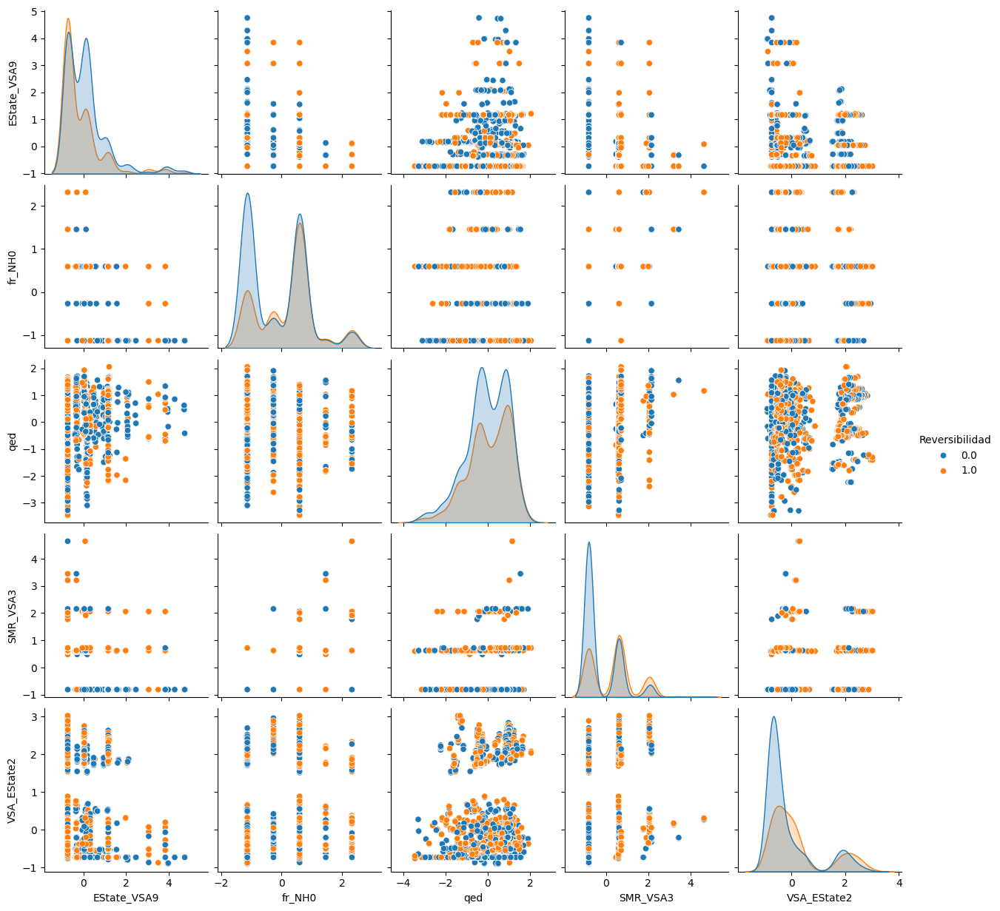

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# Graficar usando seaborn pairplot8

sns.pairplot(df_class.iloc[:,:6], hue="Reversibilidad", palette="tab10")
plt.savefig('variables_5_all_Ox.jpeg')
plt.show()

In [ ]:
!pip install xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.9/153.9 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 201.3/201.3 MB 5.2 MB/s eta 0:00:00


[0]	train-logloss:0.67695	train-auc:0.85141	train-error:0.42085	test-logloss:0.67823	test-auc:0.74808	test-error:0.42117
[10]	train-logloss:0.64412	train-auc:0.87955	train-error:0.42085	test-logloss:0.65522	test-auc:0.78449	test-error:0.42117
[20]	train-logloss:0.61653	train-auc:0.89180	train-error:0.37915	test-logloss:0.63699	test-auc:0.79296	test-error:0.38739
[30]	train-logloss:0.59069	train-auc:0.90150	train-error:0.25521	test-logloss:0.62111	test-auc:0.79621	test-error:0.29955
[40]	train-logloss:0.56829	train-auc:0.90742	train-error:0.21972	test-logloss:0.60779	test-auc:0.79706	test-error:0.29955
[50]	train-logloss:0.54881	train-auc:0.91092	train-error:0.19718	test-logloss:0.59690	test-auc:0.79844	test-error:0.29505


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [20:46:44] WARNING: /workspace/src/context.cc:43: No visible GPU is found, setting device to CPU.
  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [20:46:44] WARNING: /workspace/src/context.cc:196: XGBoost is not compiled with CUDA support.
  warnings.warn(smsg, UserWarning)


[60]	train-logloss:0.53153	train-auc:0.91351	train-error:0.18592	test-logloss:0.58784	test-auc:0.79653	test-error:0.30180
[70]	train-logloss:0.51593	train-auc:0.91611	train-error:0.17746	test-logloss:0.58005	test-auc:0.79566	test-error:0.30180
[80]	train-logloss:0.50187	train-auc:0.91826	train-error:0.17521	test-logloss:0.57330	test-auc:0.79446	test-error:0.30631
[90]	train-logloss:0.48868	train-auc:0.92104	train-error:0.16507	test-logloss:0.56771	test-auc:0.79350	test-error:0.29054
[100]	train-logloss:0.47597	train-auc:0.92485	train-error:0.15831	test-logloss:0.56218	test-auc:0.79481	test-error:0.28604
[110]	train-logloss:0.46443	train-auc:0.92793	train-error:0.15831	test-logloss:0.55738	test-auc:0.79652	test-error:0.28153
[120]	train-logloss:0.45355	train-auc:0.93081	train-error:0.15324	test-logloss:0.55323	test-auc:0.79701	test-error:0.27477
[130]	train-logloss:0.44222	train-auc:0.93538	train-error:0.14141	test-logloss:0.55065	test-auc:0.79628	test-error:0.27477
[140]	train-logloss:

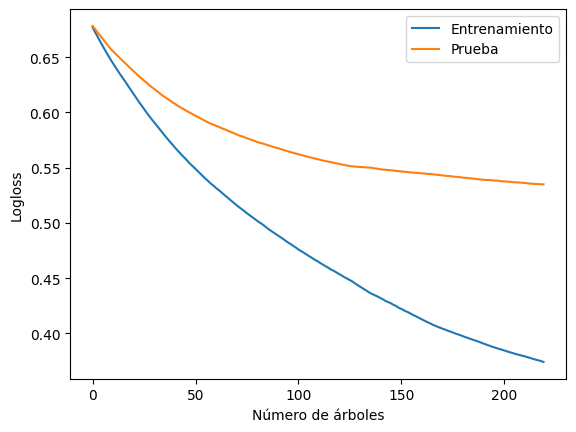

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import xgboost as xgb
import matplotlib.pyplot as plt

# Separar las características (X) y la variable objetivo (y)
X = df_class.drop(columns=['Reversibilidad'])  # Eliminar la columna objetivo
y = df_class['Reversibilidad']  # Variable objetivo

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

params ={
    'objective':'binary:logistic',
    'tree_method': 'hist',        # Mantén el 'tree_method' en 'hist'
    'device': 'cuda',
    'eval_metric': ['logloss', 'auc', 'error'],
    #'max_depth': 20,
    #'reg_lambda': 10,
    #'reg_alpha': 10,
    'learning_rate': 0.01,
    'random_state': 42
}

evals = [(dtrain, 'train'), (dtest, 'test')]
evals_result = {}
# Entrenamiento del modelo
model = xgb.train(
    params=params,
    dtrain=dtrain,
    num_boost_round=10000,
    evals=evals,
    early_stopping_rounds=100,
    verbose_eval=10,
    evals_result=evals_result
)

# Predicciones y evaluación del rendimiento
y_pred_proba = model.predict(dtest)
y_pred = [1 if prob > 0.5 else 0 for prob in y_pred_proba]  # Convertir probabilidades a clases


# Evaluar el rendimiento del modelo
print("Matriz de confusión:")
print(confusion_matrix(y_test, y_pred))

print("\nReporte de clasificación:")
print(classification_report(y_test, y_pred))

print("\nPrecisión del modelo:")
print(f"Accuracy: {100*accuracy_score(y_test, y_pred):.2f}")

# Importancia de las características
print("\nImportancia de las características:")
feature_importances = model.get_score(importance_type='weight')
feature_importances_df_class = pd.DataFrame({
    'Característica': feature_importances.keys(),
    'Importancia': feature_importances.values()
}).sort_values(by='Importancia', ascending=False)
print(feature_importances_df_class)



# Graficar logloss para entrenamiento y validación
plt.plot(evals_result['train']['logloss'], label='Entrenamiento')
plt.plot(evals_result['test']['logloss'], label='Prueba')
plt.xlabel('Número de árboles')
plt.ylabel('Logloss')
plt.legend()
#plt.title('Logloss durante el entrenamiento')
plt.show()